In [1]:
import yfinance as yf
import pandas as pd
import numpy as np
# Import Packages
import bs4 as bs
import pickle
import requests
import datetime as dt
import os
from pandas import DataFrame
import pandas_datareader.data as web
#import pandas.plotting
from pandas.plotting import register_matplotlib_converters
#import pandas.testing
from pandas.testing import assert_frame_equal
import seaborn as sns

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import matplotlib.dates as mdates
from matplotlib import style

import mplfinance  
#from mplfinance import candlestick_ohlc 
from concurrent import futures

import collections
from collections import Counter
from functools import reduce
from sklearn import covariance
from sklearn.covariance.shrunk_covariance_ import ledoit_wolf_shrinkage
from scipy.stats import moment
import rpy2.robjects as robjects
from rpy2.robjects.packages import importr
import warnings

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
!pip install rpy2

You should consider upgrading via the '/opt/anaconda3/bin/python -m pip install --upgrade pip' command.


In [3]:
!pip install pandas
!pip install pandas_datareader
!pip install mpl_finance
!pip install mplfinance
!pip install --upgrade mplfinance

You should consider upgrading via the '/opt/anaconda3/bin/python -m pip install --upgrade pip' command.
You should consider upgrading via the '/opt/anaconda3/bin/python -m pip install --upgrade pip' command.
You should consider upgrading via the '/opt/anaconda3/bin/python -m pip install --upgrade pip' command.
You should consider upgrading via the '/opt/anaconda3/bin/python -m pip install --upgrade pip' command.
     |████████████████████████████████| 62 kB 1.4 MB/s eta 0:00:011
  Attempting uninstall: mplfinance
    Found existing installation: mplfinance 0.12.7a12
    Uninstalling mplfinance-0.12.7a12:
      Successfully uninstalled mplfinance-0.12.7a12
You should consider upgrading via the '/opt/anaconda3/bin/python -m pip install --upgrade pip' command.


In [4]:
pip install --upgrade pip

     |████████████████████████████████| 1.5 MB 4.2 MB/s eta 0:00:01
  Attempting uninstall: pip
    Found existing installation: pip 21.0.1
    Uninstalling pip-21.0.1:
      Successfully uninstalled pip-21.0.1
Note: you may need to restart the kernel to use updated packages.


In [5]:
start = dt.datetime(2011,1,1)
end = dt.datetime.now()

In [6]:
stocks      = {'AAPL':'Apple', 'MSFT':'Microsoft', 'AMZN' : 'Amazon',  'GOOG': 'Google', 'TSLA':'Tesla'}
bonds       = {'HCA' : 'HCA', 'VRTX' :  'VRTX'}
commodities = {'BTC-USD' : 'Bitcoin', 'PA=F' : 'Palladium'}
assets = {**stocks, **bonds, **commodities}
tickers     = list(assets.keys())
asset_data = {}
N = len(tickers)

In [7]:
for ticker, asset in assets.items():
    print("Loading data series for assets {} with ticker = {}".format(assets[ticker], ticker))
    asset_data[ticker] = web.DataReader(ticker, data_source = 'yahoo', start = start, end = end)

Loading data series for assets Apple with ticker = AAPL
Loading data series for assets Microsoft with ticker = MSFT
Loading data series for assets Amazon with ticker = AMZN
Loading data series for assets Google with ticker = GOOG
Loading data series for assets Tesla with ticker = TSLA
Loading data series for assets HCA with ticker = HCA
Loading data series for assets VRTX with ticker = VRTX
Loading data series for assets Bitcoin with ticker = BTC-USD
Loading data series for assets Palladium with ticker = PA=F


In [8]:
df_tesla = web.DataReader('TSLA', 'yahoo', start, end)

print(df_tesla.tail(10))

                  High         Low        Open       Close      Volume  \
Date                                                                     
2021-04-26  749.299988  732.609985  741.000000  738.200012  31038500.0   
2021-04-27  724.000000  703.349976  717.960022  704.739990  29437000.0   
2021-04-28  708.500000  693.599976  696.409973  694.400024  22271000.0   
2021-04-29  702.250000  668.500000  699.510010  677.000000  28845400.0   
2021-04-30  715.469971  666.140015  667.590027  709.440002  40686400.0   
2021-05-03  706.000000  680.500000  703.799988  684.900024  27043100.0   
2021-05-04  683.450012  657.700012  678.940002  673.599976  29739300.0   
2021-05-05  685.299988  667.340027  681.059998  670.940002  21901900.0   
2021-05-06  681.020020  650.000000  680.760010  663.539978  27714800.0   
2021-05-07  690.000000  660.219971  665.799988  672.369995  23396141.0   

             Adj Close  
Date                    
2021-04-26  738.200012  
2021-04-27  704.739990  
2021-04-28 

In [9]:
df_tesla.head(20)

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2011-01-03,5.400,5.180,5.368,5.324,6415000.0,5.324
2011-01-04,5.390,5.204,5.332,5.334,5937000.0,5.334
2011-01-05,5.380,5.238,5.296,5.366,7233500.0,5.366
2011-01-06,5.600,5.362,5.366,5.576,10306000.0,5.576
2011-01-07,5.716,5.580,5.600,5.648,11239500.0,5.648
2011-01-10,5.736,5.610,5.634,5.690,6713500.0,5.690
2011-01-11,5.742,5.384,5.718,5.392,8551000.0,5.392
2011-01-12,5.480,5.304,5.402,5.392,4822000.0,5.392
2011-01-13,5.394,5.232,5.392,5.244,3618000.0,5.244


In [10]:
df_msft = web.DataReader('MSFT', 'yahoo', start, end)

print(df_msft.tail(10))

                  High         Low        Open       Close      Volume  \
Date                                                                     
2021-04-26  262.440002  260.170013  261.660004  261.549988  19763300.0   
2021-04-27  263.190002  260.119995  261.579987  261.970001  31014200.0   
2021-04-28  256.540009  252.949997  256.079987  254.559998  46903100.0   
2021-04-29  256.100006  249.000000  255.460007  252.509995  40589000.0   
2021-04-30  253.080002  249.600006  249.740005  252.179993  30929200.0   
2021-05-03  254.350006  251.119995  253.399994  251.860001  19626600.0   
2021-05-04  251.210007  245.759995  250.970001  247.789993  32756100.0   
2021-05-05  249.500000  245.820007  249.059998  246.470001  21901300.0   
2021-05-06  249.860001  244.690002  246.449997  249.729996  26473300.0   
2021-05-07  254.300003  251.169998  252.149994  252.460007  22795257.0   

             Adj Close  
Date                    
2021-04-26  261.549988  
2021-04-27  261.970001  
2021-04-28 

In [11]:
df_msft.head(20)

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2011-01-03,28.180000,27.920000,28.049999,27.980000,53443800.0,22.194935
2011-01-04,28.170000,27.850000,27.940001,28.090000,54405600.0,22.282196
2011-01-05,28.010000,27.770000,27.900000,28.000000,58998700.0,22.210800
2011-01-06,28.850000,27.860001,28.040001,28.820000,88026300.0,22.861258
2011-01-07,28.740000,28.250000,28.639999,28.600000,73762000.0,22.686743
2011-01-10,28.400000,28.040001,28.260000,28.219999,57573600.0,22.385311
2011-01-11,28.250000,28.049999,28.200001,28.110001,50298900.0,22.298059
2011-01-12,28.590000,28.070000,28.120001,28.549999,52631100.0,22.647087
2011-01-13,28.389999,28.010000,28.330000,28.190001,67077600.0,22.361511


In [12]:
df_apple = web.DataReader('AAPL', 'yahoo', start, end)

print(df_apple.tail(10))

                  High         Low        Open       Close       Volume  \
Date                                                                      
2021-04-26  135.059998  133.559998  134.830002  134.720001   66905100.0   
2021-04-27  135.410004  134.110001  135.009995  134.389999   66015800.0   
2021-04-28  135.020004  133.080002  134.309998  133.580002  107760100.0   
2021-04-29  137.070007  132.449997  136.470001  133.479996  151101000.0   
2021-04-30  133.559998  131.070007  131.779999  131.460007  109713200.0   
2021-05-03  134.070007  131.830002  132.039993  132.539993   75135100.0   
2021-05-04  131.490005  126.699997  131.190002  127.849998  137564700.0   
2021-05-05  130.449997  127.970001  129.199997  128.100006   84000900.0   
2021-05-06  129.750000  127.129997  127.889999  129.740005   77968100.0   
2021-05-07  131.258194  129.475006  130.850006  130.210007   74667644.0   

             Adj Close  
Date                    
2021-04-26  134.720001  
2021-04-27  134.389999  

In [13]:
df_google = web.DataReader('GOOG', 'yahoo', start, end)

print(df_google.tail(10))

                   High          Low         Open        Close     Volume  \
Date                                                                        
2021-04-26  2341.260010  2313.840088  2319.929932  2326.739990  1041700.0   
2021-04-27  2337.449951  2304.270020  2336.000000  2307.120117  1598600.0   
2021-04-28  2452.377930  2374.850098  2407.145020  2379.909912  2986400.0   
2021-04-29  2436.520020  2402.280029  2410.330078  2429.889893  1977700.0   
2021-04-30  2427.139893  2402.159912  2404.489990  2410.120117  1956700.0   
2021-05-03  2419.699951  2384.500000  2402.719971  2395.169922  1689400.0   
2021-05-04  2379.260010  2311.699951  2369.739990  2354.250000  1756000.0   
2021-05-05  2382.199951  2351.409912  2368.419922  2356.739990  1090300.0   
2021-05-06  2382.709961  2342.337891  2350.639893  2381.350098  1030500.0   
2021-05-07  2415.389893  2390.000000  2400.000000  2398.689941  1123039.0   

              Adj Close  
Date                     
2021-04-26  2326.739990

In [14]:
df_amazon = web.DataReader('AMZN', 'yahoo', start, end)

print(df_amazon.tail(10))

                   High          Low         Open        Close   Volume  \
Date                                                                      
2021-04-26  3428.449951  3330.939941  3348.000000  3409.000000  4880700   
2021-04-27  3460.000000  3398.010010  3443.469971  3417.429932  3827100   
2021-04-28  3489.879883  3425.000000  3434.800049  3458.500000  4631900   
2021-04-29  3514.449951  3435.000000  3505.100098  3471.310059  7682400   
2021-04-30  3554.000000  3462.500000  3525.120117  3467.419922  7001800   
2021-05-03  3486.649902  3372.699951  3484.729980  3386.489990  5875500   
2021-05-04  3367.979980  3272.129883  3356.189941  3311.870117  5439400   
2021-05-05  3354.699951  3264.360107  3338.860107  3270.540039  3711300   
2021-05-06  3314.399902  3247.199951  3270.000000  3306.370117  4442600   
2021-05-07  3330.780029  3289.070312  3319.090088  3291.610107  4506685   

              Adj Close  
Date                     
2021-04-26  3409.000000  
2021-04-27  3417.4299

In [15]:
df_HCA = web.DataReader('HCA', 'yahoo', start, end)

print(df_HCA.tail(10))

                  High         Low        Open       Close     Volume  \
Date                                                                    
2021-04-26  201.110001  196.220001  196.229996  200.559998  1461600.0   
2021-04-27  201.029999  197.410004  200.850006  198.960007  1809900.0   
2021-04-28  200.899994  197.550003  199.279999  198.490005  2274900.0   
2021-04-29  203.550003  199.559998  199.649994  201.940002  1388500.0   
2021-04-30  203.710007  200.570007  201.710007  201.059998  1394800.0   
2021-05-03  205.639999  201.679993  203.339996  204.509995  1594600.0   
2021-05-04  206.669998  202.179993  204.000000  206.339996  1732200.0   
2021-05-05  208.509995  206.020004  206.020004  207.839996  1055700.0   
2021-05-06  209.839996  207.210007  207.970001  209.330002  1249700.0   
2021-05-07  211.240005  207.279999  207.600006  210.520004  1038121.0   

             Adj Close  
Date                    
2021-04-26  200.559998  
2021-04-27  198.960007  
2021-04-28  198.490005 

In [16]:
df_HCA.head()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2011-03-10,31.500000,30.700001,31.200001,31.020000,64599900.0,24.070442
2011-03-11,31.290001,30.500000,30.500000,31.120001,9531600.0,24.148039
2011-03-14,31.049999,30.570000,30.959999,30.910000,8663800.0,23.985086
2011-03-15,31.500000,30.360001,30.389999,31.340000,7121200.0,24.318754
2011-03-16,31.950001,31.120001,31.250000,31.250000,6157900.0,24.248917


In [17]:
df_VRTX = web.DataReader('VRTX', 'yahoo', start, end)

print(df_VRTX.tail(10))

                  High         Low        Open       Close   Volume  \
Date                                                                  
2021-04-26  218.279999  214.460007  217.740005  216.970001  1303400   
2021-04-27  218.149994  215.000000  217.100006  215.529999  1223900   
2021-04-28  215.720001  212.809998  215.679993  213.479996  1426800   
2021-04-29  213.800003  210.270004  213.600006  211.860001  1656000   
2021-04-30  221.410004  213.000000  213.339996  218.199997  2592700   
2021-05-03  219.690002  216.699997  217.270004  217.949997  1367000   
2021-05-04  217.539993  211.759995  217.539993  214.850006  1772600   
2021-05-05  215.839996  213.240005  214.850006  213.869995  1254800   
2021-05-06  213.580002  211.059998  212.250000  213.160004  1182400   
2021-05-07  216.770004  213.809998  214.354996  215.009995  1068638   

             Adj Close  
Date                    
2021-04-26  216.970001  
2021-04-27  215.529999  
2021-04-28  213.479996  
2021-04-29  211.860001

In [18]:
df_VRTX.head()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2011-01-03,36.230000,35.189999,35.200001,35.990002,1752900,35.990002
2011-01-04,36.220001,35.320000,36.020000,35.490002,1229300,35.490002
2011-01-05,37.070000,35.560001,35.560001,36.840000,2866800,36.840000
2011-01-06,36.799999,36.180000,36.599998,36.200001,1548900,36.200001
2011-01-07,36.360001,35.720001,36.259998,36.160000,1462800,36.160000


In [19]:
df_BTC = web.DataReader('BTC-USD', 'yahoo', start, end)

print(df_BTC.tail(10))

                    High           Low          Open         Close  \
Date                                                                 
2021-04-27  56227.207031  53887.917969  55036.636719  54824.703125   
2021-04-28  55115.843750  52418.027344  54858.089844  53555.109375   
2021-04-29  57900.718750  53129.601562  53568.664062  57750.175781   
2021-04-30  58448.339844  57052.273438  57714.664062  57828.050781   
2021-05-01  57902.593750  56141.906250  57825.863281  56631.078125   
2021-05-02  58973.308594  56590.871094  56620.273438  57200.292969   
2021-05-03  57214.179688  53191.425781  57214.179688  53333.539062   
2021-05-04  57911.363281  52969.054688  53252.164062  57424.007812   
2021-05-05  58363.316406  55382.507812  57441.308594  56396.515625   
2021-05-07  58578.226562  55321.847656  56285.355469  57605.207031   

                  Volume     Adj Close  
Date                                    
2021-04-27  4.800057e+10  54824.703125  
2021-04-28  4.608893e+10  53555.1093

In [20]:
df_palladium = web.DataReader('PA=F', 'yahoo', start, end)

print(df_palladium.tail(10))

                   High          Low         Open        Close  Volume  \
Date                                                                     
2021-04-22  2837.600098  2837.600098  2837.600098  2837.600098     0.0   
2021-04-23  2851.699951  2851.699951  2851.699951  2851.699951     0.0   
2021-04-26  2904.000000  2904.000000  2904.000000  2904.000000     0.0   
2021-04-27  2947.300049  2947.300049  2947.300049  2947.300049     0.0   
2021-04-28  2924.899902  2924.899902  2924.899902  2924.899902     0.0   
2021-05-03  2985.399902  2985.399902  2985.399902  2985.399902     0.0   
2021-05-04  2981.600098  2981.600098  2981.600098  2981.600098     0.0   
2021-05-05  2976.800049  2976.800049  2976.800049  2976.800049     0.0   
2021-05-06  2951.399902  2951.399902  2951.399902  2951.399902     0.0   
2021-05-07  2965.000000  2823.500000  2958.000000  2933.500000   606.0   

              Adj Close  
Date                     
2021-04-22  2837.600098  
2021-04-23  2851.699951  
2021-04

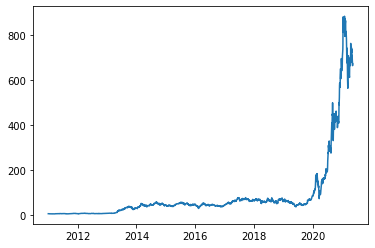

In [21]:
plt.plot(df_tesla["Adj Close"]);

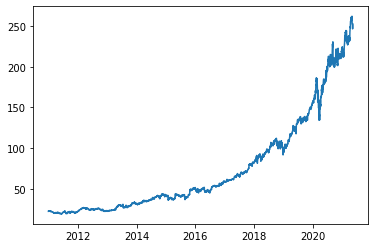

In [22]:
plt.plot(df_msft["Adj Close"]);

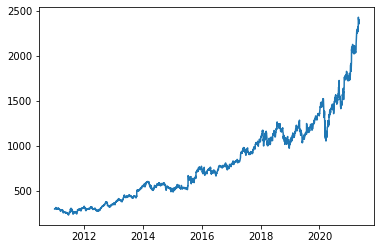

In [23]:
plt.plot(df_google["Adj Close"]);

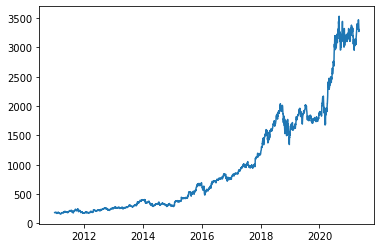

In [24]:
plt.plot(df_amazon["Adj Close"]);

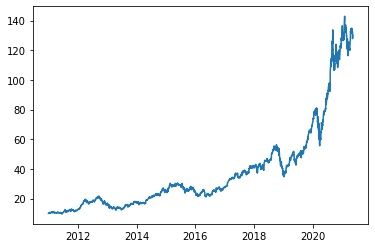

In [25]:
plt.plot(df_apple["Adj Close"]);

In [26]:
df_tesla['Log_Ret'] = np.log(df_tesla['Close'] / df_tesla['Close'].shift(1))
df_tesla['Volatility'] = df_tesla['Log_Ret'].rolling(center=False,window=252).std() * np.sqrt(252)
df_tesla.tail()

,High,Low,Open,Close,Volume,Adj Close,Log_Ret,Volatility
Date,,,,,,,,
2021-05-03,706.000000,680.500000,703.799988,684.900024,27043100.0,684.900024,-0.035203,0.725122
2021-05-04,683.450012,657.700012,678.940002,673.599976,29739300.0,673.599976,-0.016636,0.721491
2021-05-05,685.299988,667.340027,681.059998,670.940002,21901900.0,670.940002,-0.003957,0.721551
2021-05-06,681.020020,650.000000,680.760010,663.539978,27714800.0,663.539978,-0.011091,0.721636
2021-05-07,690.000000,660.219971,665.799988,672.369995,23396141.0,672.369995,0.013220,0.721618


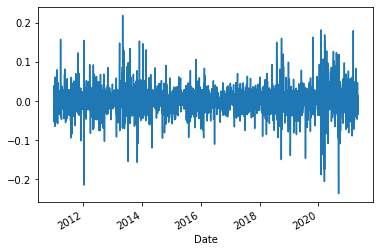

In [27]:
df_tesla['Log_Ret'].plot();

In [28]:
#df_tesla = df_tesla.drop(["Log_Ret", "Volatility"], axis = 1, inplace = True) 

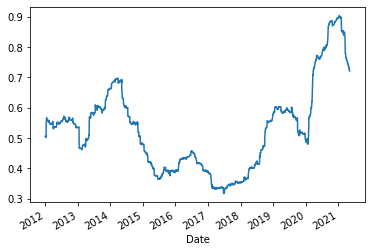

In [29]:
df_tesla['Volatility'].plot();

In [30]:
df_apple['Log_Ret'] = np.log(df_apple['Close'] / df_apple['Close'].shift(1))
df_apple['Volatility'] = df_apple['Log_Ret'].rolling(center=False,window=252).std() * np.sqrt(252)
df_apple.tail()

,High,Low,Open,Close,Volume,Adj Close,Log_Ret,Volatility
Date,,,,,,,,
2021-05-03,134.070007,131.830002,132.039993,132.539993,75135100.0,132.539993,0.008182,0.348502
2021-05-04,131.490005,126.699997,131.190002,127.849998,137564700.0,127.849998,-0.036027,0.350415
2021-05-05,130.449997,127.970001,129.199997,128.100006,84000900.0,128.100006,0.001954,0.350183
2021-05-06,129.750000,127.129997,127.889999,129.740005,77968100.0,129.740005,0.012721,0.350249
2021-05-07,131.258194,129.475006,130.850006,130.210007,74667644.0,130.210007,0.003616,0.350157


In [31]:
df_amazon['Log_Ret'] = np.log(df_amazon['Close'] / df_amazon['Close'].shift(1))
df_amazon['Volatility'] = df_amazon['Log_Ret'].rolling(center=False,window=252).std() * np.sqrt(252)
df_amazon.tail()

,High,Low,Open,Close,Volume,Adj Close,Log_Ret,Volatility
Date,,,,,,,,
2021-05-03,3486.649902,3372.699951,3484.729980,3386.489990,5875500,3386.489990,-0.023617,0.311151
2021-05-04,3367.979980,3272.129883,3356.189941,3311.870117,5439400,3311.870117,-0.022281,0.311848
2021-05-05,3354.699951,3264.360107,3338.860107,3270.540039,3711300,3270.540039,-0.012558,0.312160
2021-05-06,3314.399902,3247.199951,3270.000000,3306.370117,4442600,3306.370117,0.010896,0.312036
2021-05-07,3330.780029,3289.070312,3319.090088,3291.610107,4506685,3291.610107,-0.004474,0.312040


In [32]:
df_msft['Log_Ret'] = np.log(df_msft['Close'] / df_msft['Close'].shift(1))
df_msft['Volatility'] = df_msft['Log_Ret'].rolling(center=False,window=252).std() * np.sqrt(252)
df_msft.tail()

,High,Low,Open,Close,Volume,Adj Close,Log_Ret,Volatility
Date,,,,,,,,
2021-05-03,254.350006,251.119995,253.399994,251.860001,19626600.0,251.860001,-0.001270,0.276962
2021-05-04,251.210007,245.759995,250.970001,247.789993,32756100.0,247.789993,-0.016292,0.276586
2021-05-05,249.500000,245.820007,249.059998,246.470001,21901300.0,246.470001,-0.005341,0.276504
2021-05-06,249.860001,244.690002,246.449997,249.729996,26473300.0,249.729996,0.013140,0.276628
2021-05-07,254.300003,251.169998,252.149994,252.460007,22795257.0,252.460007,0.010873,0.276759


In [33]:
df_google['Log_Ret'] = np.log(df_google['Close'] / df_google['Close'].shift(1))
df_google['Volatility'] = df_google['Log_Ret'].rolling(center=False,window=252).std() * np.sqrt(252)
df_google.tail()

,High,Low,Open,Close,Volume,Adj Close,Log_Ret,Volatility
Date,,,,,,,,
2021-05-03,2419.699951,2384.500000,2402.719971,2395.169922,1689400.0,2395.169922,-0.006222,0.281671
2021-05-04,2379.260010,2311.699951,2369.739990,2354.250000,1756000.0,2354.250000,-0.017232,0.282342
2021-05-05,2382.199951,2351.409912,2368.419922,2356.739990,1090300.0,2356.739990,0.001057,0.281894
2021-05-06,2382.709961,2342.337891,2350.639893,2381.350098,1030500.0,2381.350098,0.010388,0.281967
2021-05-07,2415.389893,2390.000000,2400.000000,2398.689941,1123039.0,2398.689941,0.007255,0.281536


In [34]:
df_BTC['Log_Ret'] = np.log(df_BTC['Close'] / df_BTC['Close'].shift(1))
df_BTC['Volatility'] = df_BTC['Log_Ret'].rolling(center=False,window=252).std() * np.sqrt(252)
df_BTC.tail()

,High,Low,Open,Close,Volume,Adj Close,Log_Ret,Volatility
Date,,,,,,,,
2021-05-02,58973.308594,56590.871094,56620.273438,57200.292969,5.171314e+10,57200.292969,0.010001,0.596751
2021-05-03,57214.179688,53191.425781,57214.179688,53333.539062,6.856471e+10,53333.539062,-0.069994,0.601611
2021-05-04,57911.363281,52969.054688,53252.164062,57424.007812,6.924132e+10,57424.007812,0.073897,0.605377
2021-05-05,58363.316406,55382.507812,57441.308594,56396.515625,6.952329e+10,56396.515625,-0.018055,0.605860
2021-05-07,58578.226562,55321.847656,56285.355469,57605.207031,6.779342e+10,57605.207031,0.021206,0.604605


In [35]:
df_BTC.head()

,High,Low,Open,Close,Volume,Adj Close,Log_Ret,Volatility
Date,,,,,,,,
2014-09-16,468.174011,452.421997,465.864014,457.334015,21056800.0,457.334015,NaN,NaN
2014-09-17,456.859985,413.104004,456.859985,424.440002,34483200.0,424.440002,-0.074643,NaN
2014-09-18,427.834991,384.532013,424.102997,394.795990,37919700.0,394.795990,-0.072402,NaN
2014-09-19,423.295990,389.882996,394.673004,408.903992,36863600.0,408.903992,0.035111,NaN
2014-09-20,412.425995,393.181000,408.084991,398.821014,26580100.0,398.821014,-0.024968,NaN


In [36]:
df_palladium['Log_Ret'] = np.log(df_palladium['Close'] / df_palladium['Close'].shift(1))
df_palladium['Volatility'] = df_palladium['Log_Ret'].rolling(center=False,window=252).std() * np.sqrt(252)
df_palladium.tail()

,High,Low,Open,Close,Volume,Adj Close,Log_Ret,Volatility
Date,,,,,,,,
2021-05-03,2985.399902,2985.399902,2985.399902,2985.399902,0.0,2985.399902,0.020473,0.362568
2021-05-04,2981.600098,2981.600098,2981.600098,2981.600098,0.0,2981.600098,-0.001274,0.362566
2021-05-05,2976.800049,2976.800049,2976.800049,2976.800049,0.0,2976.800049,-0.001611,0.345715
2021-05-06,2951.399902,2951.399902,2951.399902,2951.399902,0.0,2951.399902,-0.008569,0.345732
2021-05-07,2965.000000,2823.500000,2958.000000,2933.500000,606.0,2933.500000,-0.006083,0.341634


In [37]:
df_HCA['Log_Ret'] = np.log(df_HCA['Close'] / df_HCA['Close'].shift(1))
df_HCA['Volatility'] = df_HCA['Log_Ret'].rolling(center=False,window=252).std() * np.sqrt(252)
df_HCA.tail()

,High,Low,Open,Close,Volume,Adj Close,Log_Ret,Volatility
Date,,,,,,,,
2021-05-03,205.639999,201.679993,203.339996,204.509995,1594600.0,204.509995,0.017013,0.378612
2021-05-04,206.669998,202.179993,204.000000,206.339996,1732200.0,206.339996,0.008908,0.378377
2021-05-05,208.509995,206.020004,206.020004,207.839996,1055700.0,207.839996,0.007243,0.377611
2021-05-06,209.839996,207.210007,207.970001,209.330002,1249700.0,209.330002,0.007143,0.370948
2021-05-07,211.240005,207.279999,207.600006,210.520004,1038121.0,210.520004,0.005669,0.369942


In [38]:
df_VRTX['Log_Ret'] = np.log(df_VRTX['Close'] / df_VRTX['Close'].shift(1))
df_VRTX['Volatility'] = df_VRTX['Log_Ret'].rolling(center=False,window=252).std() * np.sqrt(252)
df_VRTX.tail()

,High,Low,Open,Close,Volume,Adj Close,Log_Ret,Volatility
Date,,,,,,,,
2021-05-03,219.690002,216.699997,217.270004,217.949997,1367000,217.949997,-0.001146,0.377878
2021-05-04,217.539993,211.759995,217.539993,214.850006,1772600,214.850006,-0.014326,0.376159
2021-05-05,215.839996,213.240005,214.850006,213.869995,1254800,213.869995,-0.004572,0.375026
2021-05-06,213.580002,211.059998,212.250000,213.160004,1182400,213.160004,-0.003325,0.374960
2021-05-07,216.770004,213.809998,214.354996,215.009995,1068638,215.009995,0.008641,0.375082


In [39]:
quarterly_apple = df_apple.resample('q').mean()
quarterly_apple.head()

,High,Low,Open,Close,Volume,Adj Close,Log_Ret,Volatility
Date,,,,,,,,
2011-03-31,12.433525,12.223433,12.334989,12.345829,5.071604e+08,10.634246,0.000916,NaN
2011-06-30,12.168316,11.964943,12.080635,12.057585,4.036467e+08,10.385963,-0.000596,NaN
2011-09-30,13.743108,13.414397,13.576043,13.589654,6.058437e+08,11.705632,0.001992,NaN
2011-12-31,14.123345,13.849422,13.997409,13.987806,4.509788e+08,12.048585,0.000956,NaN
2012-03-31,18.112079,17.793992,17.950541,17.988566,5.453669e+08,15.494693,0.006327,0.264344


In [40]:
quarterly_amazon = df_amazon.resample('q').mean()
quarterly_amazon.head()

,High,Low,Open,Close,Volume,Adj Close,Log_Ret,Volatility
Date,,,,,,,,
2011-03-31,178.862904,174.740968,176.731935,176.948064,5.296239e+06,176.948064,-0.000368,NaN
2011-06-30,193.693016,189.045397,191.163651,191.582699,5.056946e+06,191.582699,0.002013,NaN
2011-09-30,215.789063,208.041563,212.167032,212.180469,6.119164e+06,212.180469,0.000872,NaN
2011-12-31,208.968413,201.836984,206.053650,205.417619,6.688852e+06,205.417619,-0.003531,NaN
2012-03-31,187.950645,183.046129,185.124192,186.051128,5.969232e+06,186.051128,0.002531,0.390751


In [41]:
quarterly_msft = df_msft.resample('q').mean()
quarterly_msft.head()

,High,Low,Open,Close,Volume,Adj Close,Log_Ret,Volatility
Date,,,,,,,,
2011-03-31,27.226452,26.778387,27.009355,26.990000,6.107278e+07,21.472336,-0.001592,NaN
2011-06-30,25.273333,24.850635,25.070635,25.077143,6.310580e+07,20.074868,0.000377,NaN
2011-09-30,26.388281,25.712031,26.017188,26.075156,6.654044e+07,21.009633,-0.000682,NaN
2011-12-31,26.312540,25.837778,26.097460,26.081587,5.192883e+07,21.158916,0.000668,NaN
2012-03-31,30.745645,30.286936,30.477097,30.566452,5.292834e+07,24.981711,0.003504,0.239416


In [42]:
quarterly_google = df_google.resample('q').mean()
quarterly_google.head()

,High,Low,Open,Close,Volume,Adj Close,Log_Ret,Volatility
Date,,,,,,,,
2011-03-31,303.043473,298.265175,300.903109,300.653962,5.245148e+06,300.653962,-0.000484,NaN
2011-06-30,265.255598,261.253535,263.587643,263.074171,5.566651e+06,263.074171,-0.002339,NaN
2011-09-30,277.936741,270.812816,274.410972,274.244487,7.730769e+06,274.244487,0.000265,NaN
2011-12-31,298.604408,293.111584,295.611342,296.145530,6.136040e+06,296.145530,0.003594,NaN
2012-03-31,309.299541,304.547113,307.103498,307.120610,5.450593e+06,307.120610,-0.000117,0.305268


In [43]:
quarterly_tesla = df_tesla.resample('q').mean()
quarterly_tesla.head()

,High,Low,Open,Close,Volume,Adj Close,Log_Ret,Volatility
Date,,,,,,,,
2011-03-31,4.938806,4.744710,4.852903,4.843548,7.281202e+06,4.843548,0.000682,NaN
2011-06-30,5.575397,5.337683,5.472635,5.449651,7.934206e+06,5.449651,0.000770,NaN
2011-09-30,5.308875,5.056812,5.193094,5.174781,5.182758e+06,5.174781,-0.002775,NaN
2011-12-31,6.075238,5.811175,5.933556,5.970571,5.447452e+06,5.970571,0.002505,NaN
2012-03-31,6.505903,6.246290,6.381871,6.388194,5.723145e+06,6.388194,0.004280,0.546061


In [44]:
quarterly_BTC = df_BTC.resample('q').mean()
quarterly_BTC.head()

,High,Low,Open,Close,Volume,Adj Close,Log_Ret,Volatility
Date,,,,,,,,
2014-09-30,419.122727,397.014998,410.972203,405.611265,2.914069e+07,405.611265,-0.012555,NaN
2014-12-31,365.706496,349.127143,357.489977,356.783495,2.296265e+07,356.783495,-0.001986,NaN
2015-03-31,259.307485,244.299254,251.831462,251.166407,3.068468e+07,251.166407,-0.002840,NaN
2015-06-30,239.742999,234.072561,236.820231,236.983022,2.059774e+07,236.983022,0.000493,0.603799
2015-09-30,259.027164,251.176793,255.048250,254.630629,2.719747e+07,254.630629,-0.000924,0.579633


In [45]:
quarterly_HCA = df_HCA.resample('q').mean()
quarterly_HCA.head()

,High,Low,Open,Close,Volume,Adj Close,Log_Ret,Volatility
Date,,,,,,,,
2011-03-31,32.663125,31.870000,32.220625,32.380625,8.390725e+06,25.126241,0.005860,NaN
2011-06-30,33.995080,33.092222,33.613175,33.562064,2.824051e+06,26.042996,-0.000413,NaN
2011-09-30,24.467187,23.271094,23.966406,23.820469,3.965216e+06,18.483856,-0.007700,NaN
2011-12-31,22.979365,21.967302,22.455556,22.468413,2.905659e+06,17.434708,0.001408,NaN
2012-03-31,25.586774,24.711129,25.163226,25.189355,3.139431e+06,20.375178,0.001871,0.522046


In [46]:
quarterly_VRTX = df_VRTX.resample('q').mean()
quarterly_VRTX.head()

,High,Low,Open,Close,Volume,Adj Close,Log_Ret,Volatility
Date,,,,,,,,
2011-03-31,42.578871,41.347903,41.908387,42.024355,2.478287e+06,42.024355,0.004697,NaN
2011-06-30,52.187302,50.429048,51.283492,51.401270,2.601837e+06,51.401270,0.001291,NaN
2011-09-30,48.966875,46.763281,47.866563,47.880000,2.086788e+06,47.880000,-0.002445,NaN
2011-12-31,35.527302,33.817619,34.938889,34.700476,3.782352e+06,34.700476,-0.004631,NaN
2012-03-31,38.789516,37.523226,38.126291,38.218710,2.939121e+06,38.218710,0.003403,0.504417


In [47]:
quarterly_palladium = df_palladium.resample('q').mean()
quarterly_palladium.head()

,High,Low,Open,Close,Volume,Adj Close,Log_Ret,Volatility
Date,,,,,,,,
2011-03-31,790.745969,787.375807,788.938710,789.145969,199.709677,789.145969,-0.000680,NaN
2011-06-30,759.769842,757.480159,758.176190,759.296828,150.825397,759.296828,-0.000177,NaN
2011-09-30,753.168751,750.210939,752.236717,751.929686,110.937500,751.929686,-0.003320,NaN
2011-12-31,633.657265,629.187907,631.426616,631.587908,108.903226,631.587908,0.001056,NaN
2012-03-31,685.135485,682.078226,683.395161,684.028227,164.209677,684.028227,-0.000060,0.352596


In [48]:
df_merge = pd.concat([df_tesla,df_amazon,df_apple,df_google,df_msft,df_BTC,df_palladium,df_HCA,df_VRTX])
df_merge

,High,Low,Open,Close,Volume,Adj Close,Log_Ret,Volatility
Date,,,,,,,,
2011-01-03,5.400000,5.180000,5.368000,5.324000,6415000.0,5.324000,NaN,NaN
2011-01-04,5.390000,5.204000,5.332000,5.334000,5937000.0,5.334000,0.001877,NaN
2011-01-05,5.380000,5.238000,5.296000,5.366000,7233500.0,5.366000,0.005981,NaN
2011-01-06,5.600000,5.362000,5.366000,5.576000,10306000.0,5.576000,0.038389,NaN
2011-01-07,5.716000,5.580000,5.600000,5.648000,11239500.0,5.648000,0.012830,NaN
...,...,...,...,...,...,...,...,...
2021-05-03,219.690002,216.699997,217.270004,217.949997,1367000.0,217.949997,-0.001146,0.377878
2021-05-04,217.539993,211.759995,217.539993,214.850006,1772600.0,214.850006,-0.014326,0.376159
2021-05-05,215.839996,213.240005,214.850006,213.869995,1254800.0,213.869995,-0.004572,0.375026


In [49]:
## keep only `adjusted close` prices
for ticker, asset in assets.items():
    asset_data[ticker] = asset_data[ticker]["Adj Close"]

In [50]:
asset_data

{'AAPL': Date
 2011-01-03     10.138556
 2011-01-04     10.191467
 2011-01-05     10.274836
 2011-01-06     10.266529
 2011-01-07     10.340052
                  ...    
 2021-05-03    132.539993
 2021-05-04    127.849998
 2021-05-05    128.100006
 2021-05-06    129.740005
 2021-05-07    130.210007
 Name: Adj Close, Length: 2604, dtype: float64, 'MSFT': Date
 2011-01-03     22.194935
 2011-01-04     22.282196
 2011-01-05     22.210800
 2011-01-06     22.861258
 2011-01-07     22.686743
                  ...    
 2021-05-03    251.860001
 2021-05-04    247.789993
 2021-05-05    246.470001
 2021-05-06    249.729996
 2021-05-07    252.460007
 Name: Adj Close, Length: 2604, dtype: float64, 'AMZN': Date
 2011-01-03     184.220001
 2011-01-04     185.009995
 2011-01-05     187.419998
 2011-01-06     185.860001
 2011-01-07     185.490005
                  ...     
 2021-05-03    3386.489990
 2021-05-04    3311.870117
 2021-05-05    3270.540039
 2021-05-06    3306.370117
 2021-05-07    3291.61

In [51]:
asset_data['PA=F'] = asset_data['PA=F'].drop_duplicates()

In [52]:
# merging
data = list(asset_data.values())
data_df = reduce(lambda x, y: pd.merge(x, y, left_index = True, right_index = True, how = 'outer'), data).dropna()
data_df.columns = tickers

In [53]:
data_df

,AAPL,MSFT,AMZN,GOOG,TSLA,HCA,VRTX,BTC-USD,PA=F
Date,,,,,,,,,
2014-09-16,22.836317,41.183929,327.760010,578.362122,52.147999,69.421944,93.860001,457.334015,844.200012
2014-09-17,22.999332,40.972549,324.000000,583.168884,52.276001,69.208954,94.500000,424.440002,838.799988
2014-09-18,23.046888,41.113487,325.000000,587.656616,52.764000,70.060974,97.349998,394.795990,831.400024
2014-09-19,22.858961,41.853306,331.320007,594.447937,51.863998,71.145401,103.750000,408.903992,812.349976
2014-09-22,22.881599,41.448158,324.500000,585.761780,50.006001,70.322403,104.709999,435.790985,802.900024
...,...,...,...,...,...,...,...,...,...
2021-04-28,133.580002,254.559998,3458.500000,2379.909912,694.400024,198.490005,213.479996,53555.109375,2924.899902
2021-05-03,132.539993,251.860001,3386.489990,2395.169922,684.900024,204.509995,217.949997,53333.539062,2985.399902
2021-05-04,127.849998,247.789993,3311.870117,2354.250000,673.599976,206.339996,214.850006,57424.007812,2981.600098


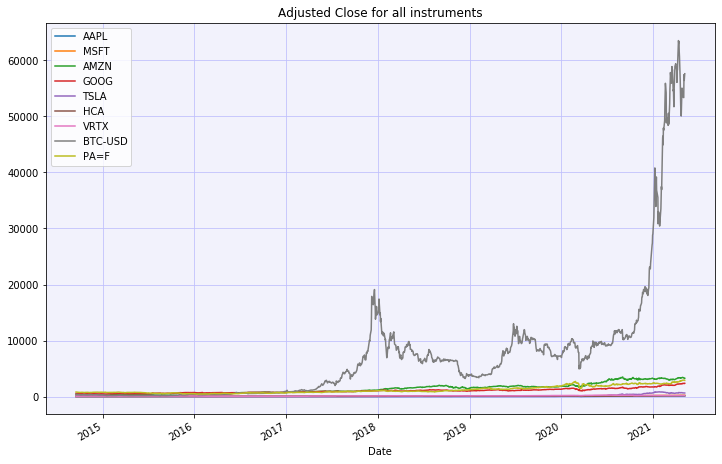

In [54]:
fig, ax = plt.subplots(figsize=(12,8))
data_df.plot(ax = plt.gca(),grid = True)
ax.set_title('Adjusted Close for all instruments')
ax.set_facecolor((0.95, 0.95, 0.99))
ax.grid(c = (0.75, 0.75, 0.99))

# Daily : Simple Returns

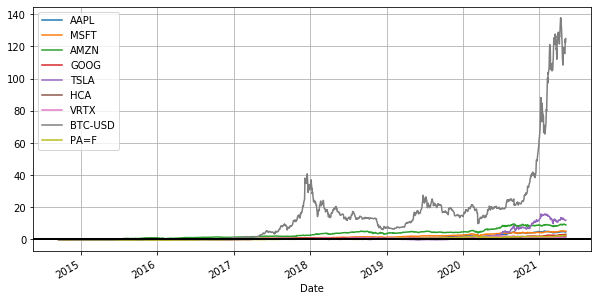

In [55]:
simple_returns = data_df.apply(lambda x: x / x[0] - 1)
simple_returns.plot(grid = True, figsize = (10,5)).axhline(y = 0, color = "black", lw = 2)

# Daily : Log Returns

In [56]:
log_returns = data_df.pct_change()
log_returns

,AAPL,MSFT,AMZN,GOOG,TSLA,HCA,VRTX,BTC-USD,PA=F
Date,,,,,,,,,
2014-09-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-09-17,0.007138,-0.005133,-0.011472,0.008311,0.002455,-0.003068,0.006819,-0.071926,-0.006397
2014-09-18,0.002068,0.003440,0.003086,0.007695,0.009335,0.012311,0.030159,-0.069843,-0.008822
2014-09-19,-0.008154,0.017995,0.019446,0.011557,-0.017057,0.015478,0.065742,0.035735,-0.022913
2014-09-22,0.000990,-0.009680,-0.020584,-0.014612,-0.035824,-0.011568,0.009253,0.065754,-0.011633
...,...,...,...,...,...,...,...,...,...
2021-04-28,-0.006027,-0.028286,0.012018,0.031550,-0.014672,-0.002362,-0.009511,-0.023157,-0.007600
2021-05-03,-0.007786,-0.010607,-0.020821,0.006412,-0.013681,0.030329,0.020939,-0.004137,0.020684
2021-05-04,-0.035386,-0.016160,-0.022035,-0.017084,-0.016499,0.008948,-0.014223,0.076696,-0.001273


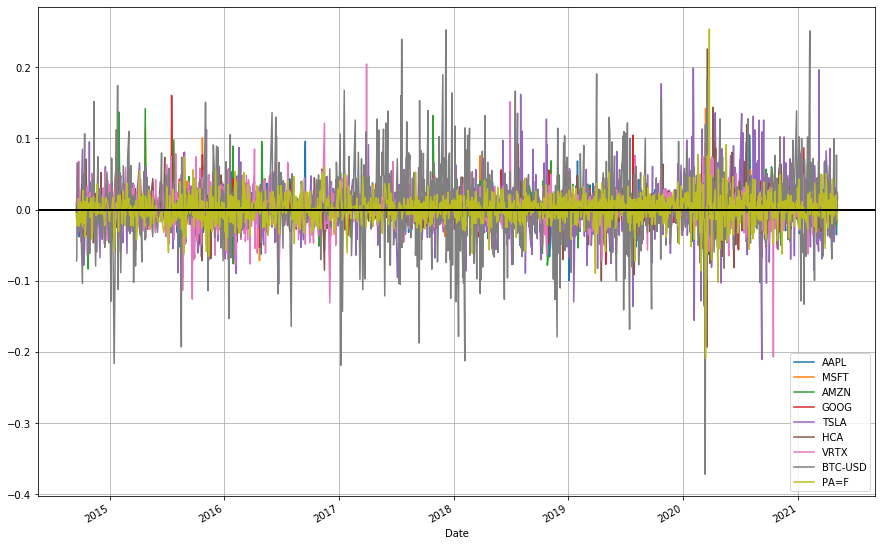

In [57]:
log_returns.plot(grid = True, figsize = (15,10)).axhline(y = 0, color = "black", lw = 2)

# Annual : APR or R-nominal

In [58]:
APR = log_returns.groupby([log_returns.index.year]).agg('sum')
APR_avg = APR.mean()

In [59]:
APR

,AAPL,MSFT,AMZN,GOOG,TSLA,HCA,VRTX,BTC-USD,PA=F
Date,,,,,,,,,
2014,0.101187,0.005751,-0.043644,-0.090542,-0.130769,0.034959,0.255669,-0.298113,-0.048853
2015,0.003719,0.244427,0.835580,0.412804,0.153675,-0.036031,0.149600,0.501762,-0.308305
2016,0.146599,0.164909,0.147449,0.037951,-0.040524,0.119345,-0.437564,0.923408,0.240240
2017,0.410257,0.352658,0.466559,0.316790,0.436209,0.191271,0.775833,3.188733,0.477704
2018,-0.016302,0.225484,0.312614,0.030426,0.198203,0.391116,0.154390,-1.049292,0.186203
2019,0.672136,0.475715,0.233811,0.284968,0.349317,0.220959,0.313163,0.875515,0.462469
2020,0.707599,0.448904,0.642395,0.344386,2.544831,0.304412,0.187520,1.652786,0.401860
2021,-0.003265,0.138213,0.020284,0.329936,0.019020,0.261080,-0.082259,0.812962,0.194771


In [60]:
pd.DataFrame(APR_avg, columns = ['Average APR']).T

,AAPL,MSFT,AMZN,GOOG,TSLA,HCA,VRTX,BTC-USD,PA=F
Average APR,0.252741,0.257008,0.326881,0.20834,0.441245,0.185889,0.164544,0.82597,0.200761


# Risk (Volatility Risk of returns)

## Standard Deviation

In [61]:
STD       = log_returns.groupby([log_returns.index.year]).agg('std') * np.sqrt(N)
STD_avg   = STD.mean()
std       = log_returns.std()
STD

,AAPL,MSFT,AMZN,GOOG,TSLA,HCA,VRTX,BTC-USD,PA=F
Date,,,,,,,,,
2014,0.043699,0.042121,0.055796,0.042527,0.090490,0.058400,0.075697,0.129997,0.044658
2015,0.056346,0.061028,0.073156,0.064908,0.084743,0.065034,0.092051,0.136392,0.064292
2016,0.049571,0.045377,0.060731,0.041991,0.079478,0.049401,0.090299,0.099419,0.060741
2017,0.035863,0.030596,0.044107,0.032610,0.071935,0.041809,0.077818,0.198591,0.046011
2018,0.054523,0.052738,0.068729,0.055672,0.100916,0.048460,0.064595,0.152316,0.048551
2019,0.050888,0.039295,0.044484,0.046970,0.094676,0.051854,0.050727,0.129101,0.055480
2020,0.088860,0.083557,0.074829,0.074050,0.172654,0.119250,0.089649,0.131812,0.106741
2021,0.058892,0.047564,0.048966,0.061481,0.130981,0.052882,0.054803,0.177060,0.058559


In [62]:
pd.DataFrame(STD_avg, columns = ['Average STD']).T

,AAPL,MSFT,AMZN,GOOG,TSLA,HCA,VRTX,BTC-USD,PA=F
Average STD,0.05483,0.050284,0.05885,0.052526,0.103234,0.060886,0.074455,0.144336,0.060629


### Visualize standard deviation for all assets for all years

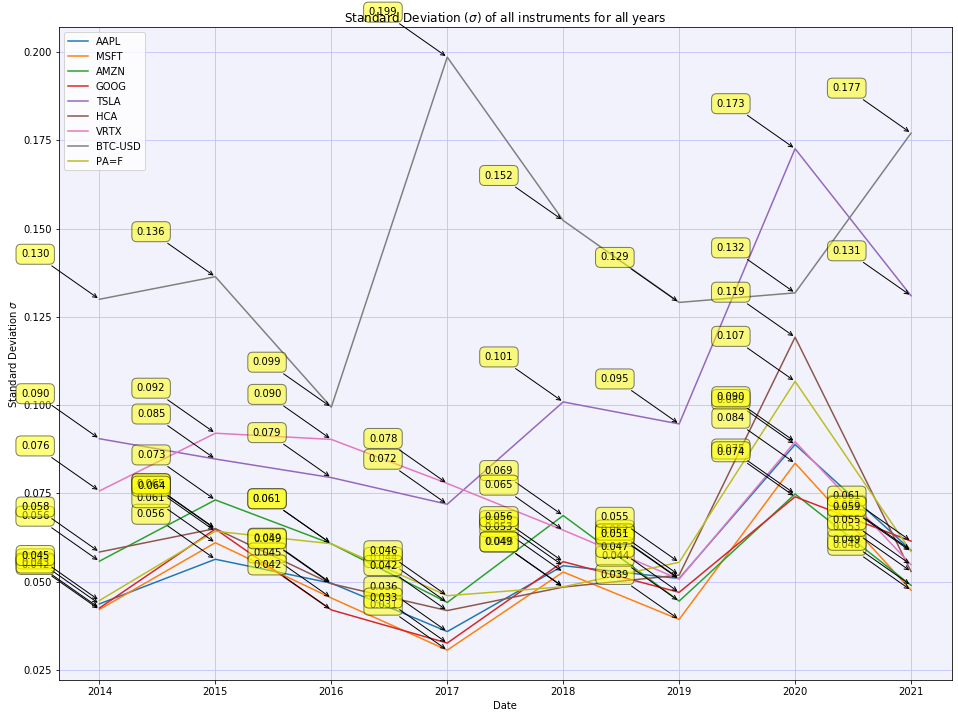

In [63]:
# configuration
fig, ax = plt.subplots(figsize = (16,12))
ax.set_title(r"Standard Deviation ($\sigma$) of all instruments for all years")
ax.set_facecolor((0.95, 0.95, 0.99))
ax.grid(c = (0.75, 0.75, 0.99))
ax.set_ylabel(r"Standard Deviation $\sigma$")
ax.set_xlabel(r"Years")
STD.plot(ax = plt.gca(),grid = True)

for instr in STD:
    stds = STD[instr]
    years = list(STD.index)
    for year, std in zip(years, stds):
        label = "%.3f"%std
        plt.annotate(label, xy = (year, std), xytext=((-1)*50, 40),textcoords = 'offset points', ha = 'right', va='bottom', bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
            arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))

In [64]:
VAR = STD **2
VAR_avg = VAR.mean()
VAR

,AAPL,MSFT,AMZN,GOOG,TSLA,HCA,VRTX,BTC-USD,PA=F
Date,,,,,,,,,
2014,0.001910,0.001774,0.003113,0.001809,0.008188,0.003411,0.005730,0.016899,0.001994
2015,0.003175,0.003724,0.005352,0.004213,0.007181,0.004229,0.008473,0.018603,0.004133
2016,0.002457,0.002059,0.003688,0.001763,0.006317,0.002440,0.008154,0.009884,0.003689
2017,0.001286,0.000936,0.001945,0.001063,0.005175,0.001748,0.006056,0.039438,0.002117
2018,0.002973,0.002781,0.004724,0.003099,0.010184,0.002348,0.004172,0.023200,0.002357
2019,0.002590,0.001544,0.001979,0.002206,0.008964,0.002689,0.002573,0.016667,0.003078
2020,0.007896,0.006982,0.005599,0.005483,0.029810,0.014221,0.008037,0.017374,0.011394
2021,0.003468,0.002262,0.002398,0.003780,0.017156,0.002796,0.003003,0.031350,0.003429


In [65]:
pd.DataFrame(VAR_avg, columns = ['Average VAR']).T

,AAPL,MSFT,AMZN,GOOG,TSLA,HCA,VRTX,BTC-USD,PA=F
Average VAR,0.003219,0.002758,0.0036,0.002927,0.011622,0.004235,0.005775,0.021677,0.004024


### Visualize Return APR vs Risk(std)

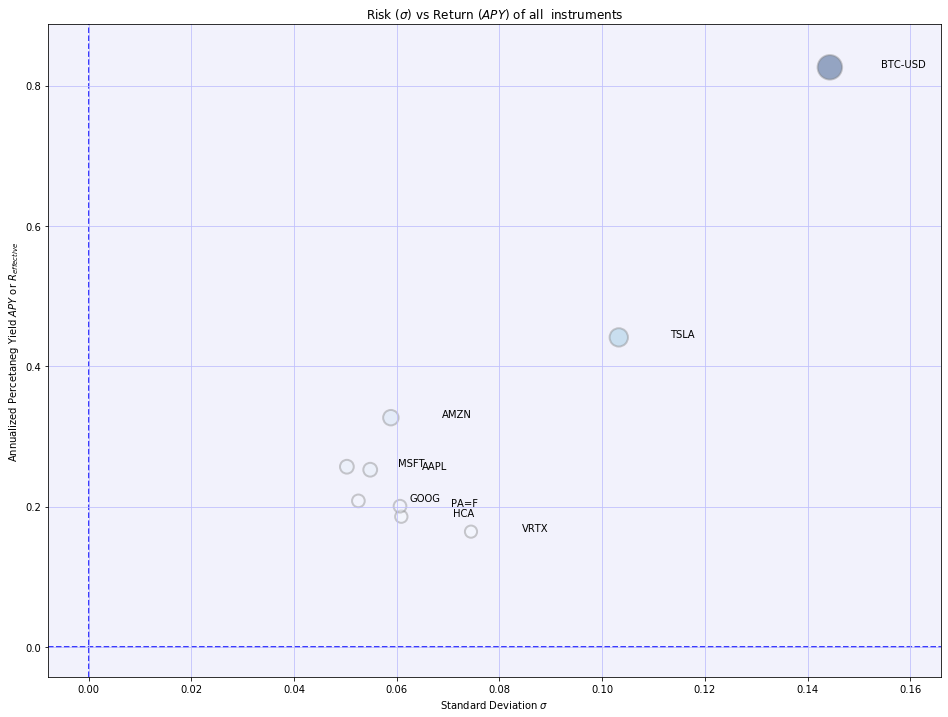

In [66]:
# configuration - generate different colors & sizes
c = [y + x for y, x in zip(APR_avg, STD_avg)]
c = list(map(lambda x : x /max(c), c))
s = list(map(lambda x : x * 600, c))


# plot
fig, ax = plt.subplots(figsize = (16,12))
ax.set_title(r"Risk ($\sigma$) vs Return ($APY$) of all  instruments")
ax.set_facecolor((0.95, 0.95, 0.99))
ax.grid(c = (0.75, 0.75, 0.99))
ax.set_xlabel(r"Standard Deviation $\sigma$")
ax.set_ylabel(r"Annualized Percetaneg Yield $APY$ or $R_{effective}$")
ax.scatter(STD_avg, APR_avg, s = s , c = c , cmap = "Blues", alpha = 0.4, edgecolors="grey", linewidth=2)
ax.axhline(y = 0.0,xmin = 0 ,xmax = 5,c = "blue",linewidth = 1.5,zorder = 0,  linestyle = 'dashed')
ax.axvline(x = 0.0,ymin = 0 ,ymax = 40,c = "blue",linewidth = 1.5,zorder = 0,  linestyle = 'dashed')
for idx, instr in enumerate(list(STD.columns)):
  ax.annotate(instr, (STD_avg[idx] + 0.01, APR_avg[idx]))

In [67]:
assets = list(log_returns.columns)
assets

['AAPL', 'MSFT', 'AMZN', 'GOOG', 'TSLA', 'HCA', 'VRTX', 'BTC-USD', 'PA=F']

In [68]:
def visualize_statistic(statistic, title, limit = 0):
    # configuration
    fig, ax = plt.subplots(figsize = (12,8))
    ax.set_facecolor((0.95, 0.95, 0.99))
    ax.grid(c = (0.75, 0.75, 0.99), axis = 'y')
    colors = sns.color_palette('Reds', n_colors = len(statistic))
    # visualize
    barlist = ax.bar(x = np.arange(len(statistic)), height =  statistic)
    for b, c in zip(barlist, colors):
        b.set_color(c)
    ax.axhline(y = limit, xmin = -1 ,xmax = 1,c = "blue",linewidth = 1.5,zorder = 0,  linestyle = 'dashed')

    # configure more
    for i, v in enumerate(statistic):
        ax.text( i - 0.22,v + 0.01 , str(round(v,3)), color = 'blue', fontweight='bold')
    plt.xticks(np.arange(len(statistic)), assets)
    plt.title(r"{}for every asset (i) against market (m) S&P500".format(title))
    plt.xlabel(r"Asset")
    plt.ylabel(r"{} value".format(title))
    plt.show()

In [69]:
def visualize_model(alpha, beta, data, model):
    fig, axs = plt.subplots(3,3, figsize = (14,10),  constrained_layout = True)
    # fig.tight_layout()
    idx = 0
    R_m = data["^GSPC"]
    del data["^GSPC"]
    for a, b, instr in zip(alpha, beta, data):
        i, j = int(idx / 3), idx % 3
        axs[i, j].set_title("Model : {} fitted for '{}'".format(model, instr))
        axs[i, j].set_facecolor((0.95, 0.95, 0.99))
        axs[i, j].grid(c = (0.75, 0.75, 0.99))
        axs[i, j].set_xlabel(r"Market (S&P500) log returns")
        axs[i, j].set_ylabel(r"{} log returns".format(instr))
    
        R = data[instr]
        y = a + b * R_m
        axs[i, j].scatter(x = R_m, y = R, label = 'Returns'.format(instr))
        axs[i, j].plot(R_m, y ,color = 'red', label = 'CAPM model')
        idx += 1


### Risk-Free rate $R_f$ :  Treasury-bill (^IRX)

In [70]:
# [*] Risk-Free Asset : Tbill (^IRX). Get the most recent value
risk_free = web.DataReader('^IRX', data_source = 'yahoo', start = start, end = end)['Adj Close']
risk_free = float(risk_free.tail(1))

In [71]:
print("Risk-Free rate (Daily T-bill) = {}".format(risk_free))

Risk-Free rate (Daily T-bill) = 0.007999999448657036


### Market $R_m$ : Assume S&P500 (^GSPC)

We load the time series for S&P500 with ticker ^GSPC. It is a 1331 x 1 dataframe (1-column because we keep only Adj. Close price). So we need first to merge market (m) with all instruments dataframe (i) to bring it on common date scale. After that we can calculate the respective Descpritive Statistics like before

In [72]:
# [*] Market          : S&P 500 index (^GSPC) | Yahoo Finance for index pricing, '^GSPC' is the underlying for 'SPX' options. 
market             = web.DataReader('^GSPC', data_source = 'yahoo', start = start, end = end)['Adj Close']
market             = market.rename("^GSPC")
market_log_returns = market.pct_change()
log_returns_total  = pd.concat([log_returns,market_log_returns], axis = 1).dropna()

In [73]:
# Descriptive statistics
# RETURN
log_returns_total = pd.concat([log_returns,market_log_returns], axis = 1).dropna()
APR_total         = log_returns_total.groupby([log_returns_total.index.year]).agg('sum')
APR_avg_total     = APR_total.mean()
APR_avg_market    = APR_avg_total['^GSPC']
# RISK
STD_total         = log_returns_total.groupby([log_returns_total.index.year]).agg('std') * np.sqrt(N)
STD_avg_total     = STD_total.mean()
STD_avg_market    = STD_avg_total['^GSPC']

In [74]:
pd.DataFrame(APR_avg_total, columns = ['Average APR']).T

,AAPL,MSFT,AMZN,GOOG,TSLA,HCA,VRTX,BTC-USD,PA=F,^GSPC
Average APR,0.252741,0.257008,0.326881,0.20834,0.441245,0.185889,0.164544,0.82597,0.200761,0.085314


In [75]:
pd.DataFrame(STD_avg_total, columns = ['Average STD']).T

,AAPL,MSFT,AMZN,GOOG,TSLA,HCA,VRTX,BTC-USD,PA=F,^GSPC
Average STD,0.05483,0.050284,0.05885,0.052526,0.103234,0.060886,0.074455,0.144336,0.060629,0.030557


### Find Correlation $\rho$ & R squared $R^2$


In [76]:
# Calculate correlation ρ & R squared R^2 between all instruments (i) & market (m)
corr = log_returns.corrwith(market_log_returns)
r_squared = corr ** 2

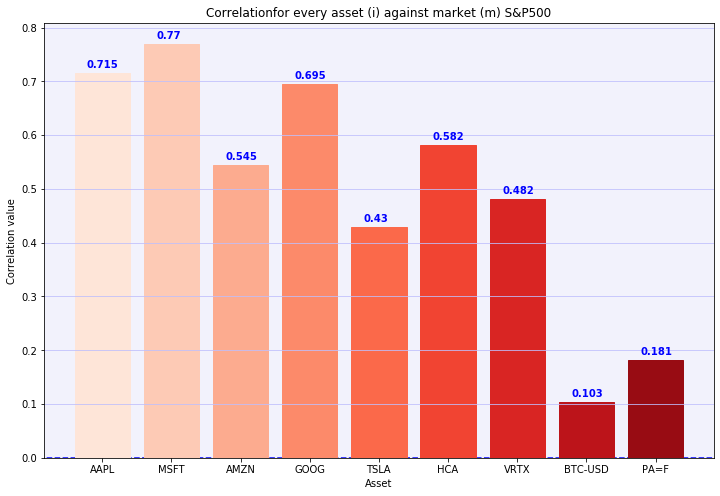

In [158]:
visualize_statistic(corr, "Correlation")

In [77]:
pd.DataFrame(r_squared, columns = ["R squared"]).T

,AAPL,MSFT,AMZN,GOOG,TSLA,HCA,VRTX,BTC-USD,PA=F
R squared,0.511179,0.593249,0.296574,0.482677,0.184776,0.339253,0.231877,0.010604,0.032881


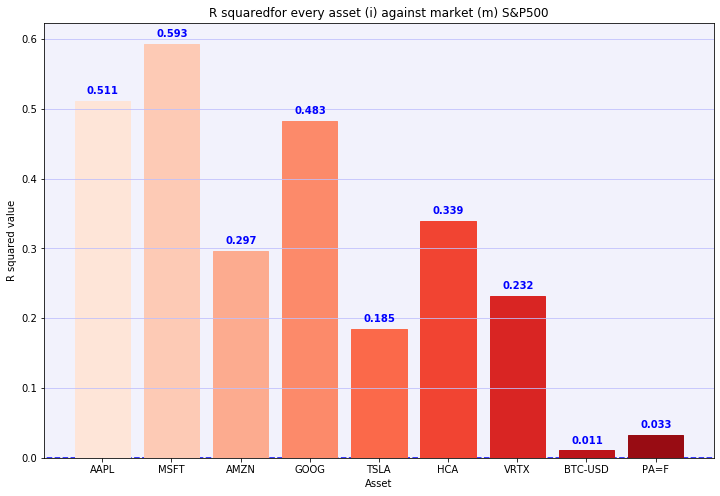

In [155]:
visualize_statistic(r_squared, "R squared")

In [157]:
np.mean(r_squared)

0.2981189323011566

# Expanded CAPM( Capital asset pricing model)

In [78]:
def CAPM():
  # 1 - Calculate average Risk Premium for every instrument  
  # [*]  _
  #     E[R] - R_f
  # [*]   __
  #     E[R_m] - R_f
  APR_premium        = APR_avg - risk_free
  APR_market_premium = APR_avg_market - risk_free

  # 2 - Calculate α, β
  beta  = corr *  STD_avg / STD_avg_market
  alpha = APR_premium - beta * APR_market_premium 
  
  return alpha, beta

In [79]:
alpha, beta = CAPM()

# Alpha α

In [80]:
pd.DataFrame(alpha,  columns = ["Average α"]).T

,AAPL,MSFT,AMZN,GOOG,TSLA,HCA,VRTX,BTC-USD,PA=F
Average α,0.145554,0.151013,0.237792,0.108008,0.320967,0.088161,0.065831,0.780364,0.164945


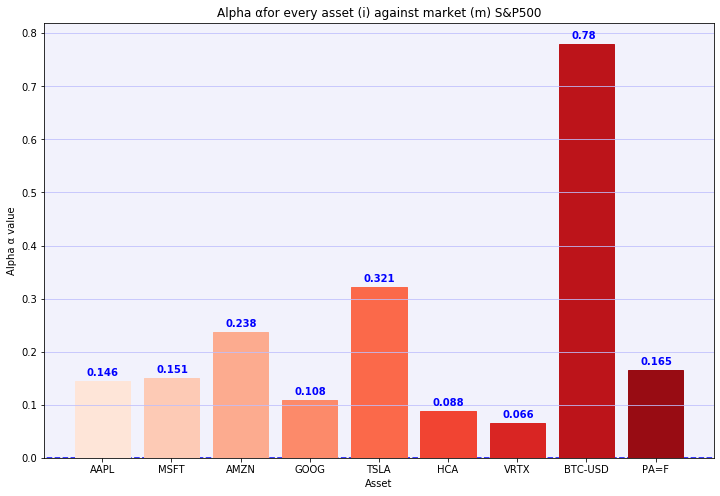

In [81]:
visualize_statistic(alpha.values, "Alpha α")

# Beta β

In [82]:
pd.DataFrame(beta,  columns = ["Average β"]).T

,AAPL,MSFT,AMZN,GOOG,TSLA,HCA,VRTX,BTC-USD,PA=F
Average β,1.282909,1.267483,1.048819,1.194245,1.45223,1.160566,1.173308,0.486402,0.359785


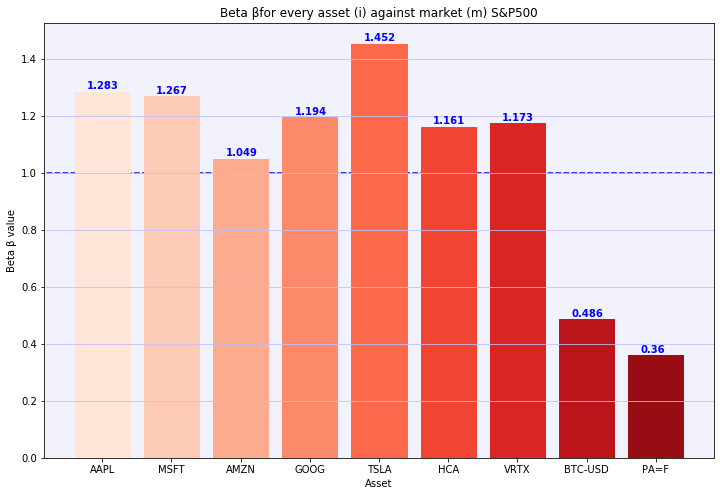

In [83]:
visualize_statistic(beta.values, "Beta β", limit = 1)

# Visualize data & CAPM

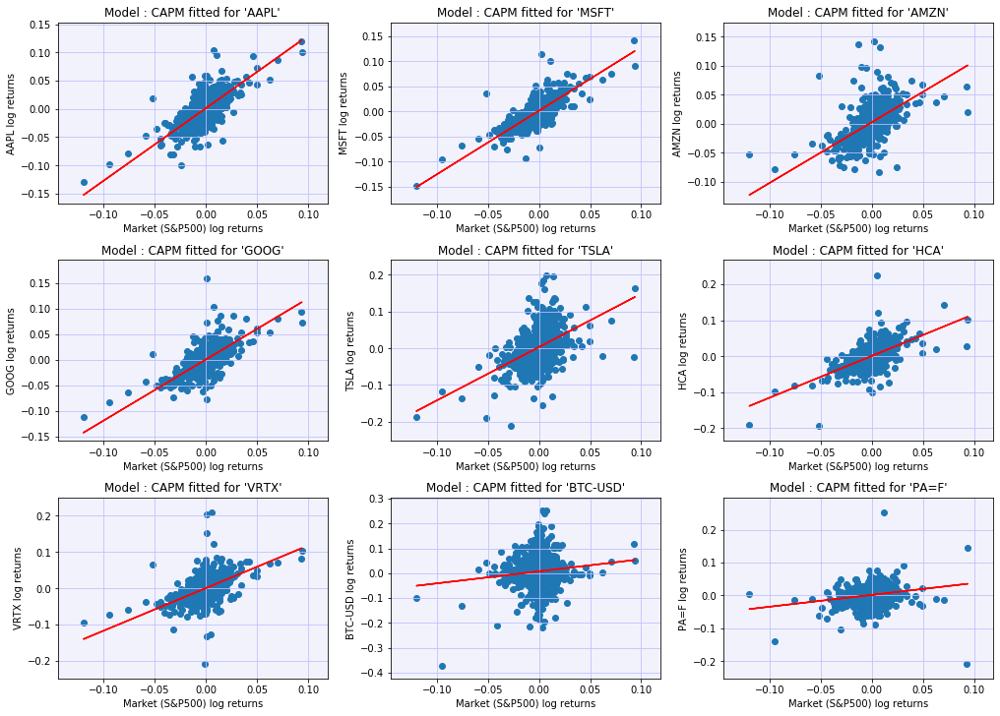

In [84]:
visualize_model(alpha/100, beta, data = log_returns_total.copy(), model = 'CAPM')

# Apply Linear Regression Model (OLS)

In [85]:
beta_reg, alpha_reg = np.polyfit(x = log_returns_total['^GSPC'] , y = log_returns_total[log_returns.columns] ,deg = 1)

### Alpha α

In [86]:
pd.DataFrame(alpha_reg,  index = log_returns.columns ,columns = ["Average α"]).T

,AAPL,MSFT,AMZN,GOOG,TSLA,HCA,VRTX,BTC-USD,PA=F
Average α,0.000828,0.00085,0.001338,0.000636,0.001783,0.000495,0.000409,0.004282,0.000932


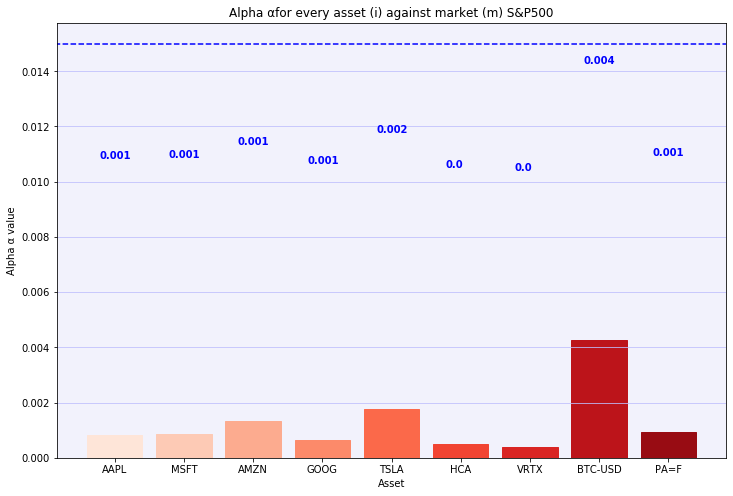

In [87]:
visualize_statistic(alpha_reg, "Alpha α", limit = 0.015)

### Beta β

In [88]:
pd.DataFrame(beta_reg,  index = log_returns.columns ,columns = ["Average β"]).T

,AAPL,MSFT,AMZN,GOOG,TSLA,HCA,VRTX,BTC-USD,PA=F
Average β,1.172327,1.174274,0.938771,1.06607,1.315288,1.107546,1.043911,0.421686,0.337255


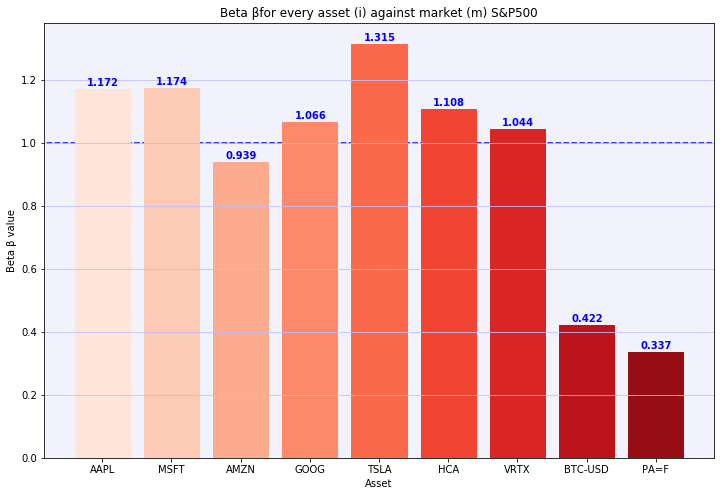

In [89]:
visualize_statistic(beta_reg, "Beta β", limit = 1)

### Visualize data & OLS

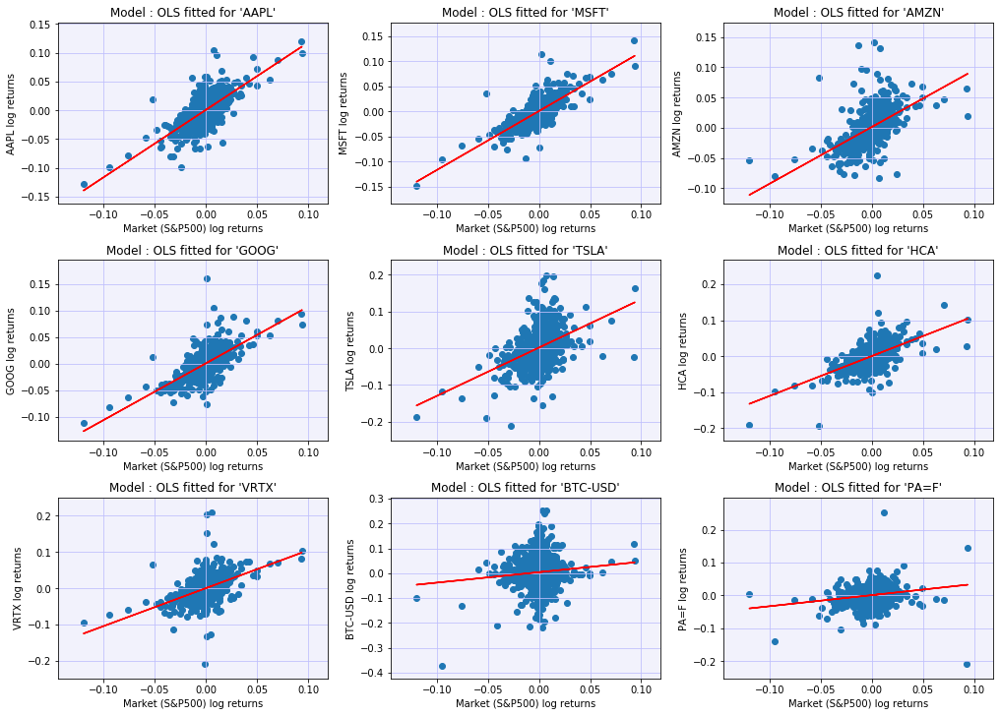

In [90]:
visualize_model(alpha_reg, beta_reg, data = log_returns_total.copy(), model = 'OLS')

# Portfolio Optimization

In [91]:
portfolios = {"#1 dummy (risky)" : {"Return E[R]" : 0, "Risk σ" : 0, "Sharpe Ratio SR" : 0},
              "#1 dummy (total)" : {"Return E[R]" : 0, "Risk σ" : 0, "Sharpe Ratio SR" : 0}, 
              "#2 optimized max sr (risky)" : {"Return E[R]" : 0, "Risk σ" : 0, "Sharpe Ratio SR" : 0},
              "#2 optimized max sr (total)" : {"Return E[R]" : 0, "Risk σ" : 0, "Sharpe Ratio SR" : 0},
              "#2 optimized min σ (risky)" : {"Return E[R]" : 0, "Risk σ" : 0, "Sharpe Ratio SR" : 0},
              "#2 optimized min σ (total)" : {"Return E[R]" : 0, "Risk σ" : 0, "Sharpe Ratio SR" : 0}, 
              }

## Portfolio #1 (the dummy portfolio)

5 Stocks : 45%
2 Bonds : 35%
2 Commodities : 10%

In [92]:
# WEIGHTS, RETURN, RISK
cov = APR.cov()
weights = np.array([ 0.45/ 5] * 5 + [ 0.35 / 2] * 2 + [ 0.1 / 2] * 2)
expected_return = np.sum(APR_avg * weights)
expected_risk   = np.sqrt( np.dot(weights.T , np.dot(cov, weights)) ) 

# RISKY PORTFOLIO
portfolios["#1 dummy (risky)"]["Return E[R]"]     = expected_return
portfolios["#1 dummy (risky)"]["Risk σ"]          = expected_risk
portfolios["#1 dummy (risky)"]["Sharpe Ratio SR"] = (expected_return - risk_free) / expected_risk

# TOTAL PORTFOLIO
total_expected_return = 0.9 * expected_return + 0.1 * risk_free
total_expected_risk   = 0.9 * expected_risk
portfolios["#1 dummy (total)"]["Return E[R]"]     = total_expected_return
portfolios["#1 dummy (total)"]["Risk σ"]          = total_expected_risk
portfolios["#1 dummy (total)"]["Sharpe Ratio SR"] = (total_expected_return - risk_free) / total_expected_risk

In [93]:
portfolios_df = pd.DataFrame(portfolios).T
portfolios_df

,Return E[R],Risk σ,Sharpe Ratio SR
#1 dummy (risky),0.246422,0.223764,1.065507
#1 dummy (total),0.222580,0.201387,1.065507
#2 optimized max sr (risky),0.000000,0.000000,0.000000
#2 optimized max sr (total),0.000000,0.000000,0.000000
#2 optimized min σ (risky),0.000000,0.000000,0.000000
#2 optimized min σ (total),0.000000,0.000000,0.000000


# Portfolio #2 (the optimized portfolio)

5 Stocks : ?
2 Bonds : ?
2 Commodities : ?

#### Portfolio Simulation

In [94]:
num_portfolios = 10000
generated_portfolios = [] # store the results

for idx in range(num_portfolios) :
  # 1 - select random weights for portfolio holdings & rebalance weights to sum to 1
    weights = np.array(np.random.random(9))
    weights /= np.sum(weights)

  # 2 - calculate return, risk, sharpe ratio
    expected_return = np.sum(APR_avg * weights)
    expected_risk   = np.sqrt( np.dot(weights.T , np.dot(cov, weights)) ) 
    sharpe_ratio    = ( expected_return - risk_free) / expected_risk

  # 3 - store the result
    generated_portfolios.append([ expected_return, expected_risk, sharpe_ratio, weights] )

# Locate the 2 'special' portfolios 1) maximum sharpe ratio 2) minimum risk
maximum_sr_portfolio   = sorted(generated_portfolios, key = lambda x : -x[2])[0]
minimum_risk_portfolio = sorted(generated_portfolios, key = lambda x : x[1])[0]
max_sr = maximum_sr_portfolio[2]

max_sr_weights = pd.DataFrame(maximum_sr_portfolio[3], index = log_returns.columns ,columns = ["Optimal Weights  #2 optimized max sr "]).T
min_risk_weights = pd.DataFrame(minimum_risk_portfolio[3], index = log_returns.columns ,columns = ["Optimal Weights  #2 optimized min σ "]).T


In [95]:
max_sr_weights

,AAPL,MSFT,AMZN,GOOG,TSLA,HCA,VRTX,BTC-USD,PA=F
Optimal Weights #2 optimized max sr,0.003111,0.208717,0.239311,0.21289,0.006884,0.256279,0.02452,0.016296,0.031993


In [160]:
max_sr_weights

,AAPL,MSFT,AMZN,GOOG,TSLA,HCA,VRTX,BTC-USD,PA=F
Optimal Weights #2 optimized max sr,0.003111,0.208717,0.239311,0.21289,0.006884,0.256279,0.02452,0.016296,0.031993


In [168]:
type(max_sr_weights.to_numpy())

numpy.ndarray

In [173]:
beta_reg

array([1.17232667, 1.17427419, 0.93877068, 1.06607023, 1.31528756,
       1.10754555, 1.04391083, 0.42168644, 0.33725473])

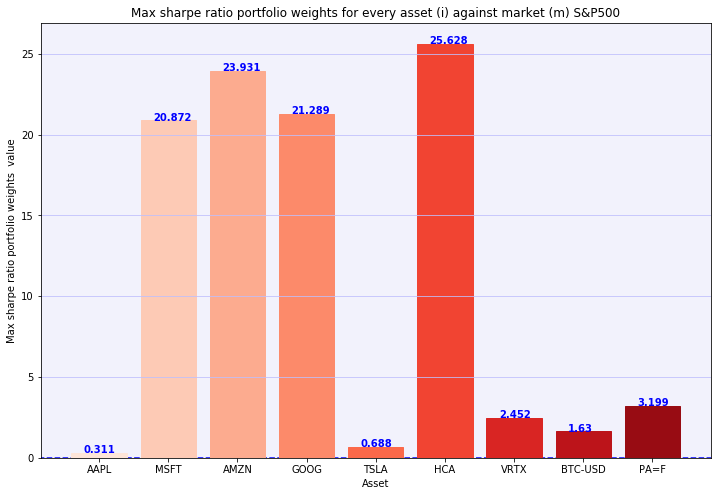

In [177]:
visualize_statistic(np.array(max_sr_weights).flatten()*100, "Max sharpe ratio portfolio weights ") 

In [96]:
min_risk_weights

,AAPL,MSFT,AMZN,GOOG,TSLA,HCA,VRTX,BTC-USD,PA=F
Optimal Weights #2 optimized min σ,0.074209,0.146252,0.086551,0.089696,0.007433,0.351351,0.148072,0.002389,0.094046


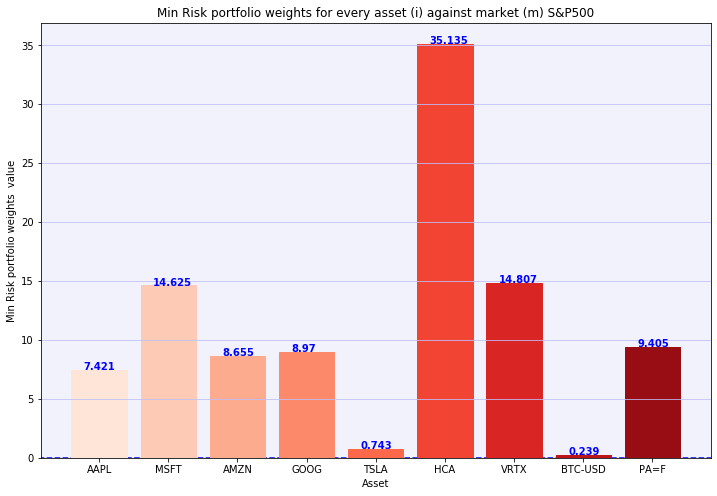

In [179]:
visualize_statistic(np.array(min_risk_weights).flatten()*100, "Min Risk portfolio weights ")

In [97]:
# RISKY PORTFOLIOS
portfolios["#2 optimized max sr (risky)"]["Return E[R]"]     = maximum_sr_portfolio[0]
portfolios["#2 optimized max sr (risky)"]["Risk σ"]          = maximum_sr_portfolio[1]
portfolios["#2 optimized max sr (risky)"]["Sharpe Ratio SR"] = (maximum_sr_portfolio[0] - risk_free) / maximum_sr_portfolio[1]
portfolios["#2 optimized min σ (risky)"]["Return E[R]"]      = minimum_risk_portfolio[0]
portfolios["#2 optimized min σ (risky)"]["Risk σ"]           = minimum_risk_portfolio[1]
portfolios["#2 optimized min σ (risky)"]["Sharpe Ratio SR"]  = (minimum_risk_portfolio[0] - risk_free) / minimum_risk_portfolio[1]

# TOTAL PORTFOLIOS
total_expected_return = 0.9 * maximum_sr_portfolio[0] + 0.1 * risk_free
total_expected_risk   = 0.9 * maximum_sr_portfolio[1]
portfolios["#2 optimized max sr (total)"]["Return E[R]"]     = total_expected_return
portfolios["#2 optimized max sr (total)"]["Risk σ"]          = total_expected_risk
portfolios["#2 optimized max sr (total)"]["Sharpe Ratio SR"] = (total_expected_return - risk_free) / total_expected_risk
total_expected_return = 0.9 * minimum_risk_portfolio[0] + 0.1 * risk_free
total_expected_risk   = 0.9 * minimum_risk_portfolio[1]
portfolios["#2 optimized min σ (total)"]["Return E[R]"]      = total_expected_return
portfolios["#2 optimized min σ (total)"]["Risk σ"]           = total_expected_risk
portfolios["#2 optimized min σ (total)"]["Sharpe Ratio SR"]  = (total_expected_return - risk_free) / total_expected_risk

In [98]:
portfolios_df = pd.DataFrame(portfolios).T
portfolios_df

,Return E[R],Risk σ,Sharpe Ratio SR
#1 dummy (risky),0.246422,0.223764,1.065507
#1 dummy (total),0.222580,0.201387,1.065507
#2 optimized max sr (risky),0.251602,0.156203,1.559525
#2 optimized max sr (total),0.227242,0.140582,1.559525
#2 optimized min σ (risky),0.217133,0.145563,1.436724
#2 optimized min σ (total),0.196220,0.131006,1.436724


## Portfolio Simulation Visualization

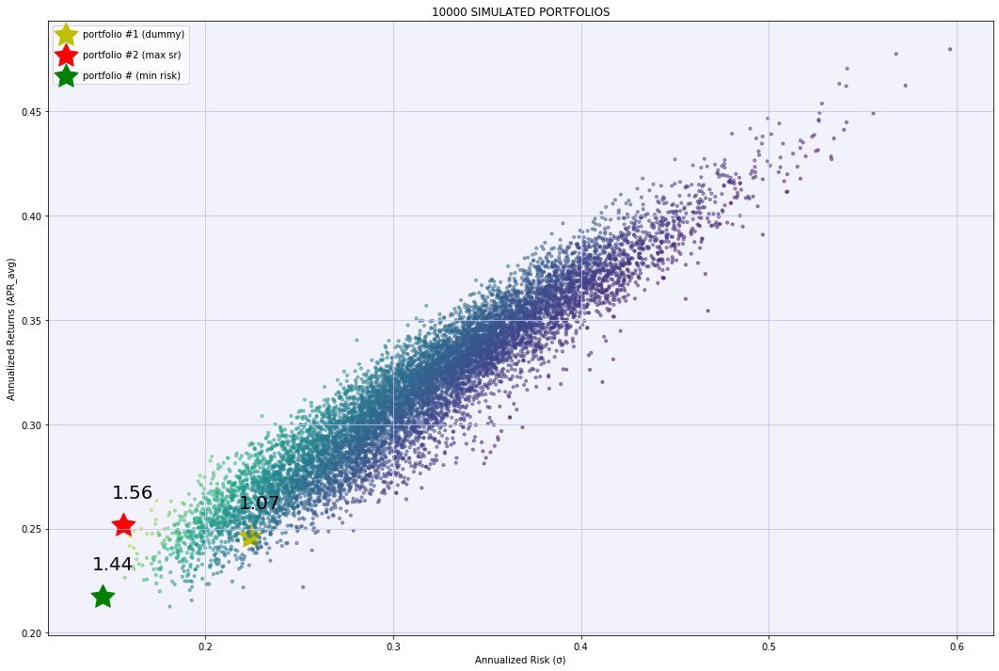

In [99]:
# plot the 2 optimized portfolios along with the rest 9998
def plot_simulation(CAL = None, INSTRUMENTS = None) :
    fig, ax = plt.subplots(figsize = (18,12))
    ax.set_facecolor((0.95, 0.95, 0.99))
    ax.grid(c = (0.75, 0.75, 0.99))
    # portfolio #1
    ret  = portfolios["#1 dummy (risky)"]["Return E[R]"]
    risk = portfolios["#1 dummy (risky)"]["Risk σ"]
    sr   = (ret - risk_free) / risk
    ax.scatter(risk, ret, marker = (5,1,0),color = 'y',s = 700, label = 'portfolio #1 (dummy)')
    ax.annotate(round(sr, 2), (risk - 0.006,ret + 0.013),  fontsize = 20, color = 'black')
 
    # portfolio #2
    ret, risk, sr = [x[0] for x in generated_portfolios], [x[1] for x in generated_portfolios], [x[2] for x in generated_portfolios]
    ax.scatter(risk, ret, c = sr, cmap = 'viridis', marker = 'o', s = 10, alpha = 0.5)
    ax.scatter(maximum_sr_portfolio[1], maximum_sr_portfolio[0],marker = (5,1,0),color = 'r',s = 700, label = 'portfolio #2 (max sr)')
    ax.annotate(round(maximum_sr_portfolio[2], 2), (maximum_sr_portfolio[1]  - 0.006,maximum_sr_portfolio[0] + 0.013), fontsize = 20, color = 'black')
    ax.scatter(minimum_risk_portfolio[1], minimum_risk_portfolio[0], marker = (5,1,0), color = 'g',s = 700,  label = 'portfolio # (min risk)')
    ax.annotate(round(minimum_risk_portfolio[2], 2), (minimum_risk_portfolio[1]  - 0.006,minimum_risk_portfolio[0] + 0.013), fontsize = 20, color = 'black')
    # CAL? EFFICIENT FRONTIER?
    if CAL : 
        for cal in CAL:
            ax.plot(cal[0], cal[1], linestyle = '-', color = 'red', label = 'CAL')

    if INSTRUMENTS : 
        ax.scatter(STD_avg, APR_avg, s = s , c = c , cmap = "Blues", alpha = 0.4, edgecolors = "grey", linewidth = 2)
        for idx, instr in enumerate(list(STD.columns)):
            sr = round((APR_avg[idx] - risk_free) / STD_avg[idx] , 2)
            ax.annotate(instr, (STD_avg[idx] + 0.01, APR_avg[idx]))
            ax.annotate(sr, (STD_avg[idx] - 0.005 , APR_avg[idx] + 0.015))

    ax.set_title('10000 SIMULATED PORTFOLIOS')
    ax.set_xlabel('Annualized Risk (σ)')
    ax.set_ylabel('Annualized Returns (APR_avg)')
    ax.legend(labelspacing = 1.2)

plot_simulation()

# Capital Allocation Line (CAL)

One Capital Allocation line per portfolio. It is the frontier when taking into account the risk free instrument in the portfolio.

In [100]:
cal_x  = np.linspace(0.0, 0.3, 50)
cal_y = risk_free + cal_x * max_sr

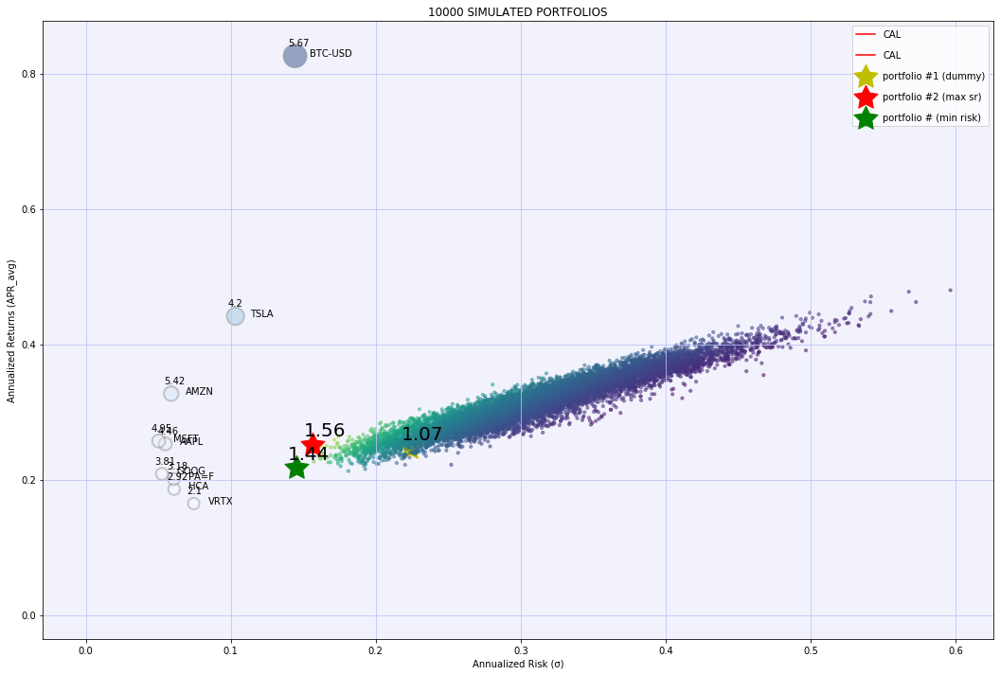

In [101]:
plot_simulation(CAL = [cal_x, cal_y] , INSTRUMENTS = 'yes')

In [102]:
data_df

,AAPL,MSFT,AMZN,GOOG,TSLA,HCA,VRTX,BTC-USD,PA=F
Date,,,,,,,,,
2014-09-16,22.836317,41.183929,327.760010,578.362122,52.147999,69.421944,93.860001,457.334015,844.200012
2014-09-17,22.999332,40.972549,324.000000,583.168884,52.276001,69.208954,94.500000,424.440002,838.799988
2014-09-18,23.046888,41.113487,325.000000,587.656616,52.764000,70.060974,97.349998,394.795990,831.400024
2014-09-19,22.858961,41.853306,331.320007,594.447937,51.863998,71.145401,103.750000,408.903992,812.349976
2014-09-22,22.881599,41.448158,324.500000,585.761780,50.006001,70.322403,104.709999,435.790985,802.900024
...,...,...,...,...,...,...,...,...,...
2021-04-28,133.580002,254.559998,3458.500000,2379.909912,694.400024,198.490005,213.479996,53555.109375,2924.899902
2021-05-03,132.539993,251.860001,3386.489990,2395.169922,684.900024,204.509995,217.949997,53333.539062,2985.399902
2021-05-04,127.849998,247.789993,3311.870117,2354.250000,673.599976,206.339996,214.850006,57424.007812,2981.600098


In [103]:
import scipy.optimize as sco
from sklearn.decomposition import PCA
from statsmodels import regression
from keras.layers import Input, Dense
from keras.models import Model
from keras import regularizers
from keras.models import load_model
import statsmodels.api as sm
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
from scipy.cluster.hierarchy import dendrogram, linkage        
from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import pdist
import pylab
from keras.layers import Input, Dense, Flatten, Dropout
from keras.models import Model
from keras.regularizers import l2
import random
from collections import deque
import matplotlib.pylab as plt

# Reinforcement learning

In [104]:
class Environment:
    
    def __init__(self, prices = data_df, capital = 1000000):       
        self.prices = prices  
        self.capital = capital  
        self.data = self.load_data()

    def load_data(self):
        data =  self.prices       
        return data
    
    def preprocess_state(self, state):
        return state
    
    def get_state(self, t, lookback, is_cov_matrix = True, is_raw_time_series = False):
        
        assert lookback <= t
        
        decision_making_state = self.data.iloc[t-lookback:t]
        decision_making_state = decision_making_state.pct_change().dropna()

        if is_cov_matrix:
            x = decision_making_state.cov()
            return x
        else:
            if is_raw_time_series:
                decision_making_state = self.data.iloc[t-lookback:t]
            return self.preprocess_state(decision_making_state)

    def get_reward(self, action, action_t, reward_t, alpha = 0.01):
        
        def local_portfolio(returns, weights):
            weights = np.array(weights)
            rets = returns.mean() # * 252
            covs = returns.cov() # * 252
            P_ret = np.sum(rets * weights)
            P_vol = np.sqrt(np.dot(weights.T, np.dot(covs, weights)))
            P_sharpe = P_ret / P_vol
            return np.array([P_ret, P_vol, P_sharpe])

        data_period = self.data[action_t:reward_t]
        weights = action
        returns = data_period.pct_change().dropna()
      
        sharpe = local_portfolio(returns, weights)[-1]
        sharpe = np.array([sharpe] * len(self.data.columns))          
        rew = (data_period.values[-1] - data_period.values[0]) / data_period.values[0]
        
        return np.dot(returns, weights), rew

In [105]:
current_cmap = matplotlib.cm.get_cmap()
current_cmap.set_bad(color='red')

def plot_results(benchmark_series, 
                 target_series, 
                 target_balances, 
                 n_assets,
                 columns,
                 name2plot = '',
                 path2save = './',
                 base_name_series = 'series'):
    
#     N = len(np.array(benchmark_series).cumsum())
    N = len(np.array([item for sublist in benchmark_series for item in sublist]).cumsum()) 
    
    if not os.path.exists(path2save):
        os.makedirs(path2save)

    for i in range(0, len(target_balances)):

        current_range = np.arange(0, N)
        current_ts = np.zeros(N)
        current_ts2 = np.zeros(N)

        ts_benchmark = np.array([item for sublist in benchmark_series[:i+1] for item in sublist]).cumsum()
        ts_target = np.array([item for sublist in target_series[:i+1] for item in sublist]).cumsum()

        t = len(ts_benchmark)
        current_ts[:t] = ts_benchmark
        current_ts2[:t] = ts_target

        current_ts[current_ts == 0] = ts_benchmark[-1]
        current_ts2[current_ts2 == 0] = ts_target[-1]

        plt.figure(figsize = (12, 10))
        
        plt.subplot(2, 1, 1)
        plt.bar(np.arange(n_assets), target_balances[i], color = 'grey')
        plt.xticks(np.arange(n_assets), columns, rotation='vertical')

        plt.subplot(2, 1, 2)
        plt.colormaps = current_cmap
        plt.plot(current_range[:t], current_ts[:t], color = 'black', label = 'Benchmark')
        plt.plot(current_range[:t], current_ts2[:t], color = 'red', label = name2plot)
        plt.plot(current_range[t:], current_ts[t:], ls = '--', lw = .1, color = 'black')
        plt.autoscale(False)
        plt.ylim([-1, 4])
        plt.legend()
        plt.savefig(path2save + base_name_series + str(i) + '.jpg')


def portfolio(returns, weights):
    weights = np.array(weights)
    rets = returns.mean() * 252
    covs = returns.cov() * 252
    P_ret = np.sum(rets * weights)
    P_vol = np.sqrt(np.dot(weights.T, np.dot(covs, weights)))
    P_sharpe = P_ret / P_vol
    return np.array([P_ret, P_vol, P_sharpe])

def sharpe(R):
    r = np.diff(R)
    sr = r.mean()/r.std() * np.sqrt(252)
    return sr


def print_stats(result, benchmark):

    sharpe_ratio = sharpe(np.array(result).cumsum())
    returns = np.mean(np.array(result))
    volatility = np.std(np.array(result))
    
    X = benchmark
    y = result
    x = sm.add_constant(X)
    model = regression.linear_model.OLS(y, x).fit()    
    alpha = model.params[0]
    beta = model.params[1]
    
    return np.round(np.array([returns, volatility, sharpe_ratio, alpha, beta]), 4).tolist()

In [106]:
def getIVP(cov, **kargs):
    # Compute the inverse-variance portfolio
    ivp = 1. / np.diag(cov)
    ivp /= ivp.sum()
    return ivp


def getClusterVar(cov,cItems):
    # Compute variance per cluster
    cov_=cov.loc[cItems,cItems] # matrix slice
    w_=getIVP(cov_).reshape(-1,1)
    cVar=np.dot(np.dot(w_.T,cov_),w_)[0,0]
    return cVar


def getQuasiDiag(link):
    # Sort clustered items by distance
    link = link.astype(int)
    sortIx = pd.Series([link[-1, 0], link[-1, 1]])
    numItems = link[-1, 3]  # number of original items
    while sortIx.max() >= numItems:
        sortIx.index = range(0, sortIx.shape[0] * 2, 2)  # make space
        df0 = sortIx[sortIx >= numItems]  # find clusters
        i = df0.index
        j = df0.values - numItems
        sortIx[i] = link[j, 0]  # item 1
        df0 = pd.Series(link[j, 1], index=i + 1)
        sortIx = sortIx.append(df0)  # item 2
        sortIx = sortIx.sort_index()  # re-sort
        sortIx.index = range(sortIx.shape[0])  # re-index
    return sortIx.tolist()


def getRecBipart(cov, sortIx):
    # Compute HRP alloc
    w = pd.Series(1, index=sortIx)
    cItems = [sortIx]  # initialize all items in one cluster
    while len(cItems) > 0:
        cItems = [i[j:k] for i in cItems for j, k in ((0, len(i) // 2), (len(i) // 2, len(i))) if len(i) > 1]  # bi-section
        for i in range(0, len(cItems), 2):  # parse in pairs
            cItems0 = cItems[i]  # cluster 1
            cItems1 = cItems[i + 1]  # cluster 2
            cVar0 = getClusterVar(cov, cItems0)
            cVar1 = getClusterVar(cov, cItems1)
            alpha = 1 - cVar0 / (cVar0 + cVar1)
            w[cItems0] *= alpha  # weight 1
            w[cItems1] *= 1 - alpha  # weight 2
    return w


def correlDist(corr):
    # A distance matrix based on correlation, where 0<=d[i,j]<=1
    # This is a proper distance metric
    dist = ((1 - corr) / 2.)**.5  # distance matrix
    return dist


def getHRP(cov, corr):
    # Construct a hierarchical portfolio
    dist = correlDist(corr)
    link = linkage(dist, 'single')
    #dn = sch.dendrogram(link, labels=cov.index.values, label_rotation=90)
    #plt.show()
    sortIx = getQuasiDiag(link)
    sortIx = corr.index[sortIx].tolist()
    hrp = getRecBipart(cov, sortIx)
    return hrp.sort_index()


In [107]:
class HRPAgent:

    def __init__(
                     self, 
                     portfolio_size,
                     allow_short = True,
                 ):
        
        self.portfolio_size = portfolio_size
        self.allow_short = allow_short
        self.input_shape = (portfolio_size, portfolio_size, )

    def act(self, returns):
        
        corr = returns.corr()
        cov = returns.cov()
        optimal_weights = getHRP(cov, corr)

        if self.allow_short:
            optimal_weights /= sum(np.abs(optimal_weights))
        else:
            optimal_weights += np.abs(np.min(optimal_weights))
            optimal_weights /= sum(optimal_weights)
            
        return optimal_weights

class AutoencoderAgent:

    def __init__(
                     self, 
                     portfolio_size,
                     allow_short = True,
                     encoding_dim = 25
                 ):
        
        self.portfolio_size = portfolio_size
        self.allow_short = allow_short
        self.encoding_dim = encoding_dim
        
        
    def model(self):
        input_img = Input(shape=(self.portfolio_size, ))
        encoded = Dense(self.encoding_dim, activation='relu', kernel_regularizer=regularizers.l2(1e-6))(input_img)
        decoded = Dense(self.portfolio_size, activation= 'linear', kernel_regularizer=regularizers.l2(1e-6))(encoded)
        autoencoder = Model(input_img, decoded)
        autoencoder.compile(optimizer='adam', loss='mse')
        return autoencoder
        

    def act(self, returns):
        data = returns
        autoencoder = self.model()
        autoencoder.fit(data, data, shuffle=False, epochs=25, batch_size=32, verbose=False)
        reconstruct = autoencoder.predict(data)

        communal_information = []

        for i in range(0, len(returns.columns)):
            diff = np.linalg.norm((returns.iloc[:,i] - reconstruct[:,i])) # 2 norm difference
            communal_information.append(float(diff))

        optimal_weights = np.array(communal_information) / sum(communal_information)

        if self.allow_short:
            optimal_weights /= sum(np.abs(optimal_weights))
        else:
            optimal_weights += np.abs(np.min(optimal_weights))
            optimal_weights /= sum(optimal_weights)
            
        return optimal_weights

class SmoothingAgent:

    def __init__(
                     self, 
                     portfolio_size,
                     allow_short = True,
                     forecast_horizon = 252,
                 ):
        
        self.portfolio_size = portfolio_size
        self.allow_short = allow_short
        self.forecast_horizon = forecast_horizon

    def act(self, timeseries):

        optimal_weights = []
        
        for asset in timeseries.columns:
            ts = timeseries[asset]
            fit1 = Holt(ts).fit()
            forecast = fit1.forecast(self.forecast_horizon)
            prediction = forecast.values[-1] - forecast.values[0]
            optimal_weights.append(prediction)

        if self.allow_short:
            optimal_weights /= sum(np.abs(optimal_weights))
        else:
            optimal_weights += np.abs(np.min(optimal_weights))
            optimal_weights /= sum(optimal_weights)
            
        return optimal_weights

class PCAAgent:
    
    
    def __init__(
                     self, 
                     portfolio_size,
                     pc_id = 0,
                     pca_max = 9,
                     allow_short = False,
                 ):
        
        self.portfolio_size = portfolio_size
        self.allow_short = allow_short
        self.input_shape = (portfolio_size, portfolio_size, )
        self.pc_id = pc_id
        self.pc_max = pca_max
  
    def act(self, returns):
        C = self.pc_max
        pca = PCA(C)
        returns_pca = pca.fit_transform(returns)
        pcs = pca.components_
        
        pc1 = pcs[self.pc_id, :]
        
        if self.allow_short:
            optimal_weights = pc1 / sum(np.abs(pc1))
        else:
            optimal_weights += np.abs(np.min(optimal_weights))
            optimal_weights /= sum(optimal_weights)
            
        return optimal_weights

class MaxReturnsAgent:
    
    def __init__(
                     self, 
                     portfolio_size,
                     allow_short = False,
                 ):
        
        self.portfolio_size = portfolio_size
        self.allow_short = allow_short
        self.input_shape = (portfolio_size, portfolio_size, )

    
    def act(self, returns):
        
        def loss(weights):
            return -portfolio(returns, weights)[0]  
        
        n_assets = len(returns.columns)
        
        if self.allow_short:
            bnds = tuple((-1.0, 1.0) for x in range(n_assets))
            cons =({'type': 'eq', 'fun': lambda x : 1.0 - np.sum(np.abs(x))})
        else:
            bnds = tuple((0.0, 1.0) for x in range(n_assets))
            cons =({'type': 'eq', 'fun': lambda x : 1.0 - np.sum(x)})
        

        opt_S = sco.minimize(
            loss, 
            n_assets * [1.0 / n_assets],
            method = 'SLSQP', bounds = bnds,
            constraints = cons)

        optimal_weights = opt_S['x']
        
        # sometimes optimization fails with constraints, need to be fixed by hands
        if self.allow_short:
            optimal_weights /= sum(np.abs(optimal_weights))
        else:
            optimal_weights += np.abs(np.min(optimal_weights))
            optimal_weights /= sum(optimal_weights)
        
        return optimal_weights

class MinVarianceAgent:
    
    def __init__(
                     self, 
                     portfolio_size,
                     allow_short = False,
                 ):
        
        self.portfolio_size = portfolio_size
        self.allow_short = allow_short
        self.input_shape = (portfolio_size, portfolio_size, )

    
    def act(self, returns):
        
        def loss(weights):
            return portfolio(returns, weights)[1]**2    
        
        n_assets = len(returns.columns)
        
        if self.allow_short:
            bnds = tuple((-1.0, 1.0) for x in range(n_assets))
            cons =({'type': 'eq', 'fun': lambda x : 1.0 - np.sum(np.abs(x))})
        else:
            bnds = tuple((0.0, 1.0) for x in range(n_assets))
            cons =({'type': 'eq', 'fun': lambda x : 1.0 - np.sum(x)})
        

        opt_S = sco.minimize(
            loss, 
            n_assets * [1.0 / n_assets],
            method = 'SLSQP', bounds = bnds,
            constraints = cons)

        optimal_weights = opt_S['x']
        
        # sometimes optimization fails with constraints, need to be fixed by hands
        if self.allow_short:
            optimal_weights /= sum(np.abs(optimal_weights))
        else:
            optimal_weights += np.abs(np.min(optimal_weights))
            optimal_weights /= sum(optimal_weights)
        
        return optimal_weights
    
    
class MaxSharpeAgent:
    
    def __init__(
                     self, 
                     portfolio_size,
                     allow_short = False,
                 ):
        
        self.portfolio_size = portfolio_size
        self.allow_short = allow_short
        self.input_shape = (portfolio_size, portfolio_size, )

    
    def act(self, returns):
        
        def loss(weights):
            return -portfolio(returns, weights)[2]
        
        n_assets = len(returns.columns)
        
        if self.allow_short:
            bnds = tuple((-1.0, 1.0) for x in range(n_assets))
            cons =({'type': 'eq', 'fun': lambda x : 1.0 - np.sum(np.abs(x))})
        else:
            bnds = tuple((0.0, 1.0) for x in range(n_assets))
            cons =({'type': 'eq', 'fun': lambda x : 1.0 - np.sum(x)})
        

        opt_S = sco.minimize(
            loss, 
            n_assets * [1.0 / n_assets],
            method = 'SLSQP', bounds = bnds,
            constraints = cons)

        optimal_weights = opt_S['x']
        
        # sometimes optimization fails with constraints, need to be fixed by hands
        if self.allow_short:
            optimal_weights /= sum(np.abs(optimal_weights))
        else:
            optimal_weights += np.abs(np.min(optimal_weights))
            optimal_weights /= sum(optimal_weights)
        
        return optimal_weights
    
    
class MaxDecorrelationAgent:
    
    def __init__(
                     self, 
                     portfolio_size,
                     allow_short = False,
                 ):
        
        self.portfolio_size = portfolio_size
        self.allow_short = allow_short
        self.input_shape = (portfolio_size, portfolio_size, )

    
    def act(self, returns):
        
        def loss(weights):
            weights = np.array(weights)
            return np.sqrt(np.dot(weights.T, np.dot(returns.corr(), weights)))
        
        n_assets = len(returns.columns)
        
        if self.allow_short:
            bnds = tuple((-1.0, 1.0) for x in range(n_assets))
            cons =({'type': 'eq', 'fun': lambda x : 1.0 - np.sum(np.abs(x))})
        else:
            bnds = tuple((0.0, 1.0) for x in range(n_assets))
            cons =({'type': 'eq', 'fun': lambda x : 1.0 - np.sum(x)})
        

        opt_S = sco.minimize(
            loss, 
            n_assets * [1.0 / n_assets],
            method = 'SLSQP', bounds = bnds,
            constraints = cons)

        optimal_weights = opt_S['x']
        
        # sometimes optimization fails with constraints, need to be fixed by hands
        if self.allow_short:
            optimal_weights /= sum(np.abs(optimal_weights))
        else:
            optimal_weights += np.abs(np.min(optimal_weights))
            optimal_weights /= sum(optimal_weights)
        
        return optimal_weights

In [108]:
class Agent:
    
    def __init__(
                     self, 
                     portfolio_size,
                     is_eval = False, 
                     allow_short = True,
                 ):
        
        self.portfolio_size = portfolio_size
        self.allow_short = allow_short
        self.input_shape = (portfolio_size, portfolio_size, )
        self.action_size = 3 # sit, buy, sell
        
        self.memory4replay = []
        self.is_eval = is_eval

        self.alpha = 0.5
        self.gamma = 0.95
        self.epsilon = 1.0
        self.epsilon_min = 0.01
        self.epsilon_decay = 0.99
        
        self.model = self._model()

    def _model(self):
        
        inputs = Input(shape=self.input_shape)        
        x = Flatten()(inputs)
        x = Dense(100, activation='elu')(x)
        x = Dropout(0.5)(x)
        x = Dense(50, activation='elu')(x)
        x = Dropout(0.5)(x)
        
        predictions = []
        for i in range(self.portfolio_size):
            asset_dense = Dense(self.action_size, activation='linear')(x)   
            predictions.append(asset_dense)
        
        model = Model(inputs=inputs, outputs=predictions)
        model.compile(optimizer='adam', loss='mse')
        return model

    def nn_pred_to_weights(self, pred, allow_short = False):

        weights = np.zeros(len(pred))
        raw_weights = np.argmax(pred, axis=-1)

        saved_min = None
        
        for e, r in enumerate(raw_weights):
            if r == 0: # sit
                weights[e] = 0
            elif r == 1: # buy
                weights[e] = np.abs(pred[e][0][r])
            else:
                weights[e] = -np.abs(pred[e][0][r])

        if not allow_short:
            weights += np.abs(np.min(weights))
            saved_min = np.abs(np.min(weights))
            saved_sum = np.sum(weights)
        else:
            saved_sum = np.sum(np.abs(weights))
            
        weights /= saved_sum
        return weights, saved_min, saved_sum
    
    def act(self, state):
        
        if not self.is_eval and random.random() <= self.epsilon:
            w = np.random.normal(0, 1, size = (self.portfolio_size, ))  
              
            saved_min = None
            
            if not self.allow_short:
                w += np.abs(np.min(w))
                saved_min = np.abs(np.min(w))
                
            saved_sum = np.sum(w)
            w /= saved_sum
            return w , saved_min, saved_sum

        pred = self.model.predict(np.expand_dims(state.values, 0))
        return self.nn_pred_to_weights(pred, self.allow_short)

    def expReplay(self, batch_size):

        def weights_to_nn_preds_with_reward(action_weights, 
                                            reward, 
                                            Q_star = np.zeros((self.portfolio_size, self.action_size))): 
            
            Q = np.zeros((self.portfolio_size, self.action_size))           
            for i in range(self.portfolio_size):
                if action_weights[i] == 0:
                    Q[i][0] = reward[i] + self.gamma * np.max(Q_star[i][0])
                elif action_weights[i] > 0:
                    Q[i][1] = reward[i] + self.gamma * np.max(Q_star[i][1])
                else:
                    Q[i][2] = reward[i] + self.gamma * np.max(Q_star[i][2])            
            return Q  
        
        def restore_Q_from_weights_and_stats(action):            
            action_weights, action_min, action_sum = action[0], action[1], action[2]
            action_weights = action_weights * action_sum          
            if action_min != None:
                action_weights = action_weights - action_min   
            return action_weights
        
        for (s, s_, action, reward, done) in self.memory4replay:
            
            action_weights = restore_Q_from_weights_and_stats(action) 
            Q_learned_value = weights_to_nn_preds_with_reward(action_weights, reward)
            s, s_ = s.values, s_.values    

            if not done:
                # reward + gamma * Q^*(s_, a_)
                Q_star = self.model.predict(np.expand_dims(s_, 0))
                Q_learned_value = weights_to_nn_preds_with_reward(action_weights, reward, np.squeeze(Q_star))  

            Q_learned_value = [xi.reshape(1, -1) for xi in Q_learned_value]
            Q_current_value = self.model.predict(np.expand_dims(s, 0))
            Q = [np.add(a * (1-self.alpha), q * self.alpha) for a, q in zip(Q_current_value, Q_learned_value)]
            
            # update current Q function with new optimal value
            self.model.fit(np.expand_dims(s, 0), Q, epochs=1, verbose=0)            
        
        if self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay

In [109]:
N_ASSETS = 9 
agent = Agent(N_ASSETS)
env = Environment()

In [110]:
window_size = 180
episode_count = 150
batch_size = 32
rebalance_period = 90

Episode 0/150 epsilon 1.0


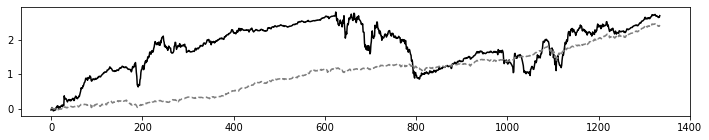

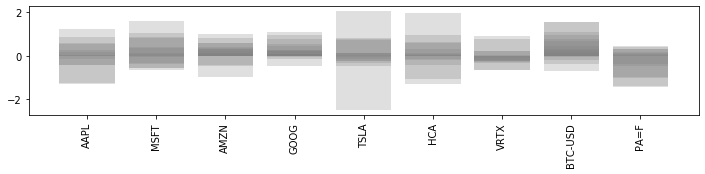

Episode 1/150 epsilon 1.0


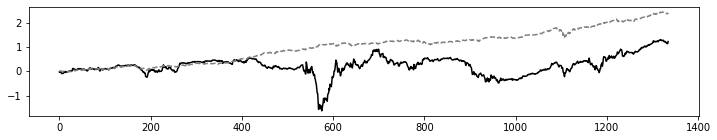

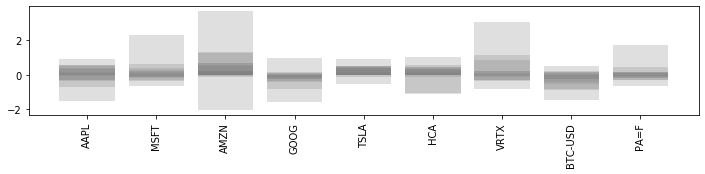

Episode 2/150 epsilon 1.0


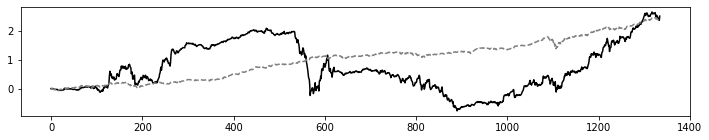

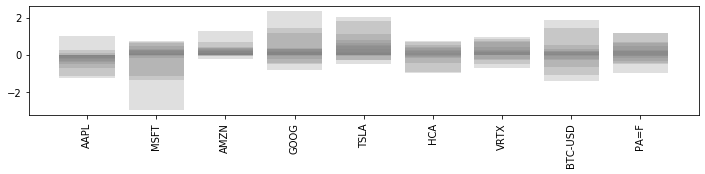

Episode 3/150 epsilon 0.99


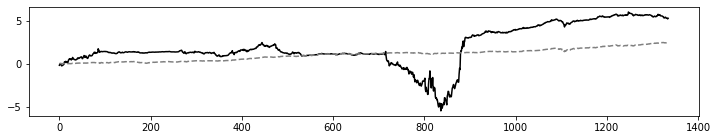

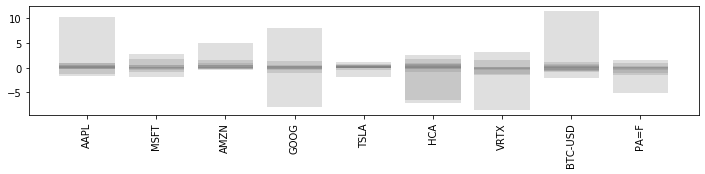

Episode 4/150 epsilon 0.99


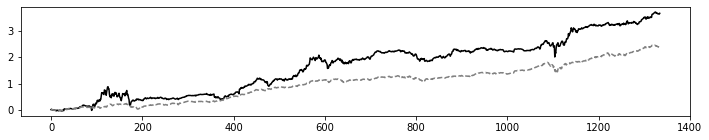

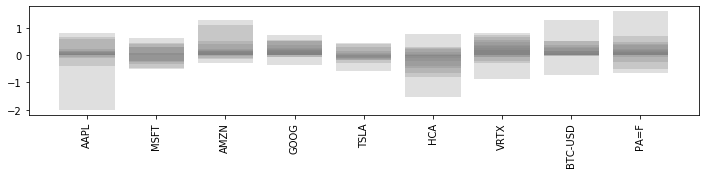

Episode 5/150 epsilon 0.9801


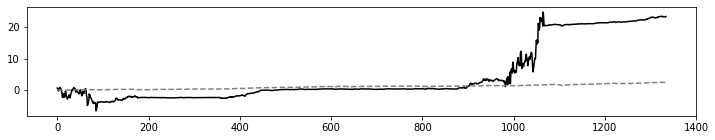

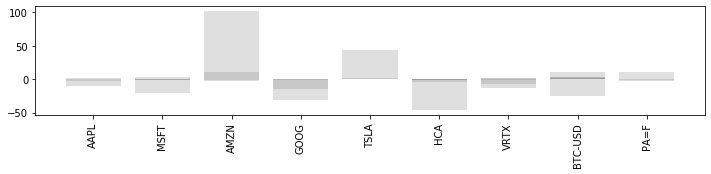

Episode 6/150 epsilon 0.9801


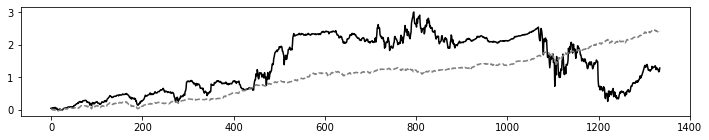

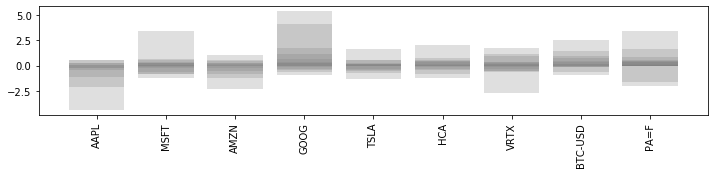

Episode 7/150 epsilon 0.9702989999999999


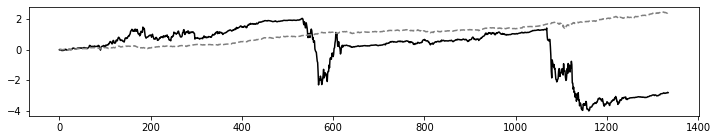

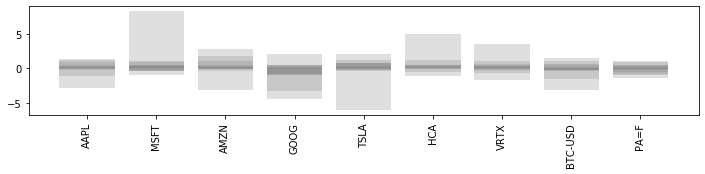

Episode 8/150 epsilon 0.9702989999999999


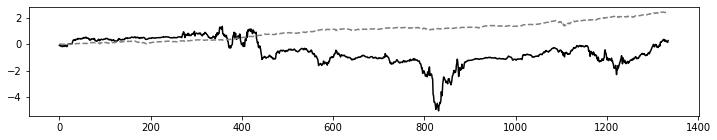

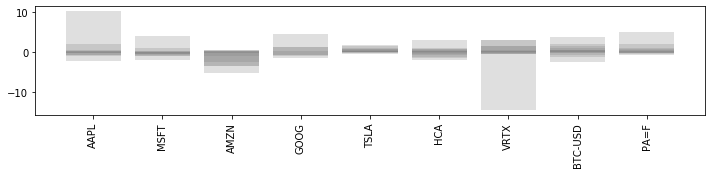

Episode 9/150 epsilon 0.96059601


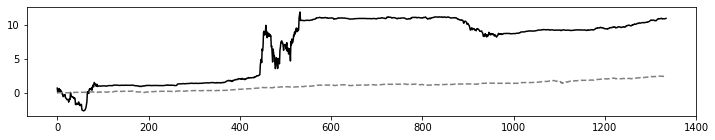

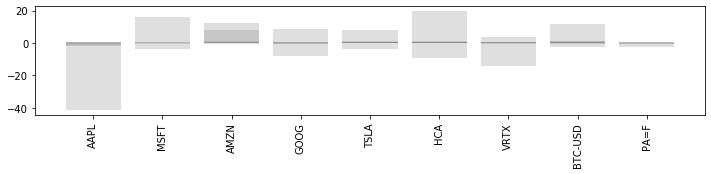

Episode 10/150 epsilon 0.96059601


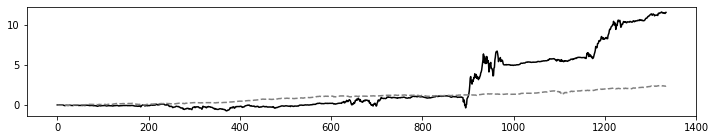

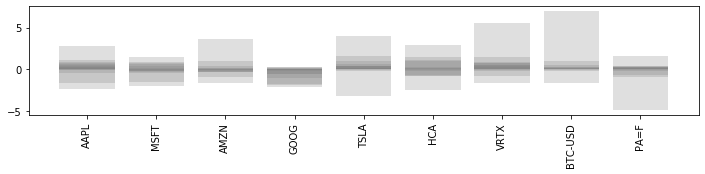

Episode 11/150 epsilon 0.9509900498999999


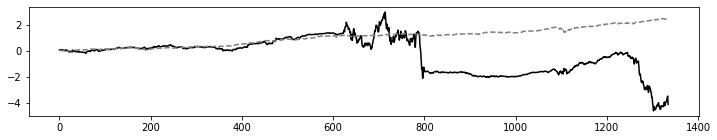

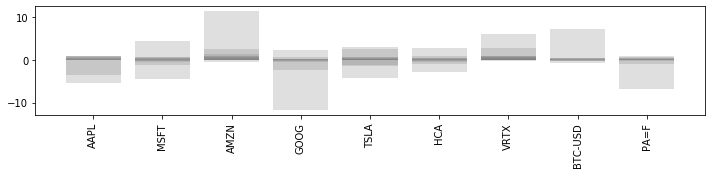

Episode 12/150 epsilon 0.9509900498999999


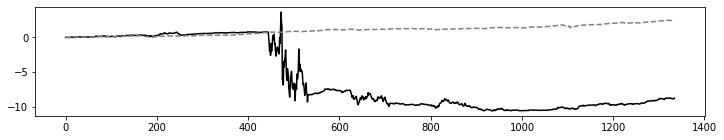

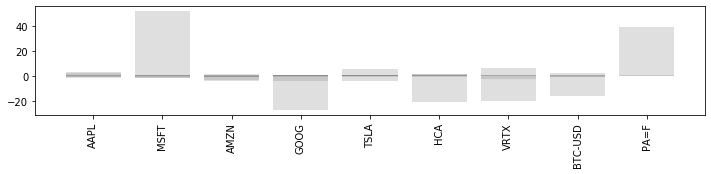

Episode 13/150 epsilon 0.9414801494009999


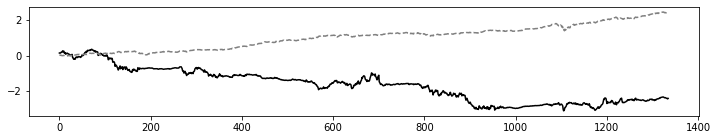

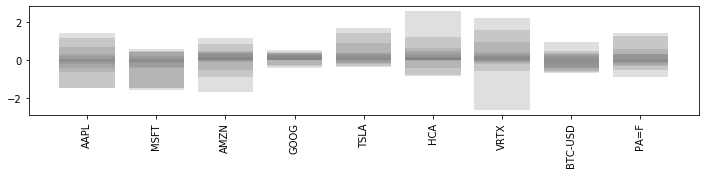

Episode 14/150 epsilon 0.9414801494009999


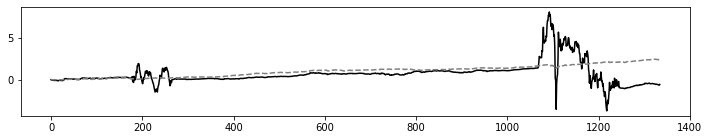

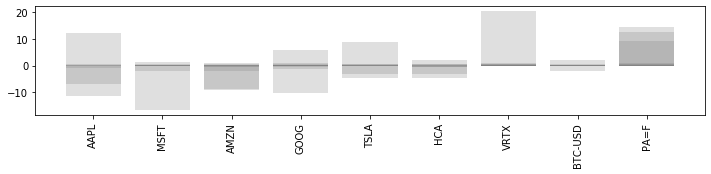

Episode 15/150 epsilon 0.9320653479069899


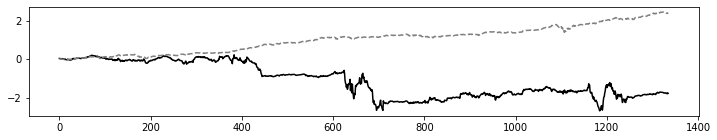

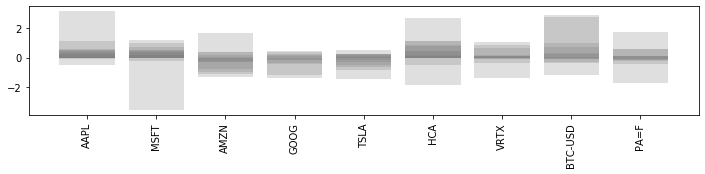

Episode 16/150 epsilon 0.9320653479069899


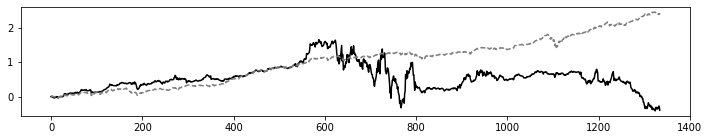

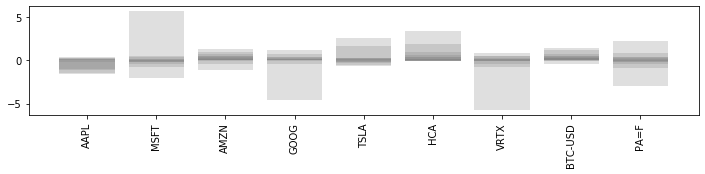

Episode 17/150 epsilon 0.9320653479069899


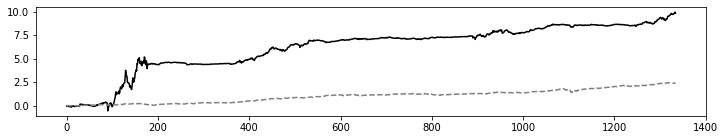

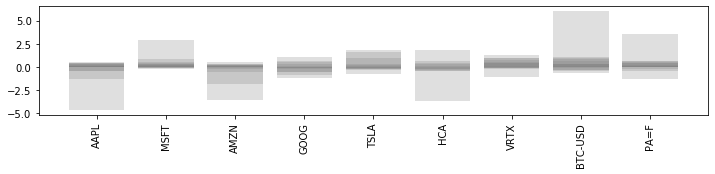

Episode 18/150 epsilon 0.92274469442792


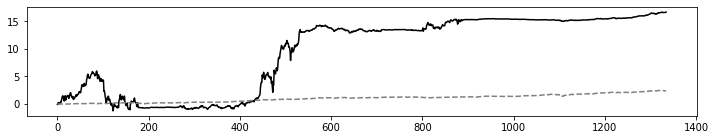

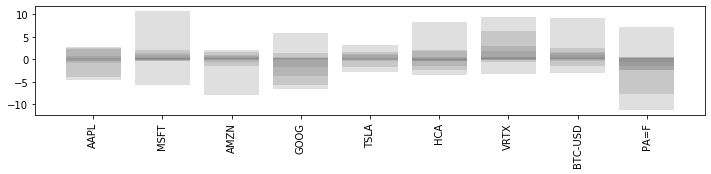

Episode 19/150 epsilon 0.92274469442792


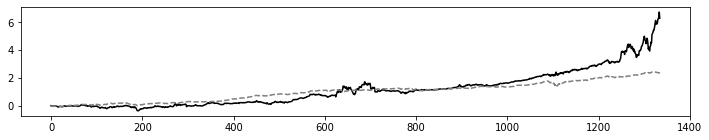

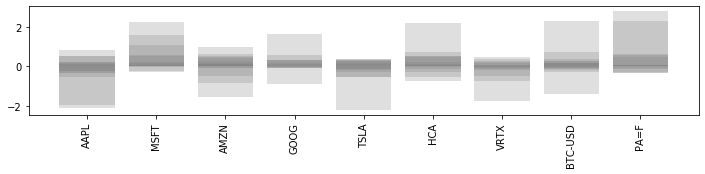

Episode 20/150 epsilon 0.9135172474836407


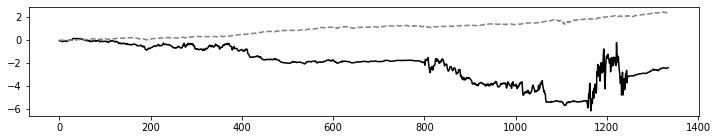

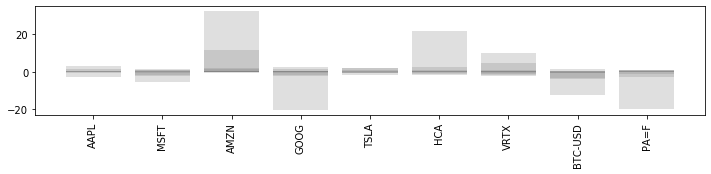

Episode 21/150 epsilon 0.9135172474836407


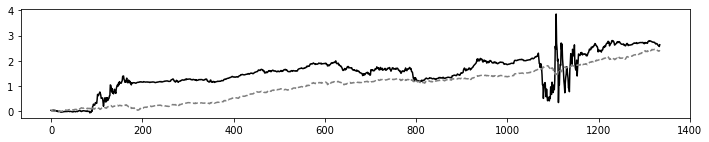

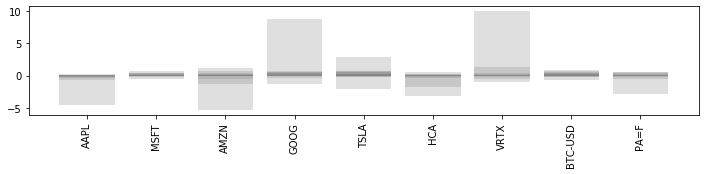

Episode 22/150 epsilon 0.9043820750088043


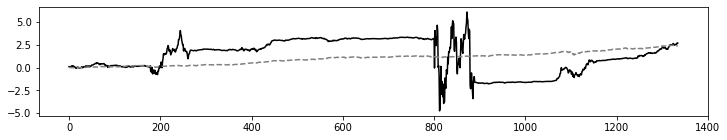

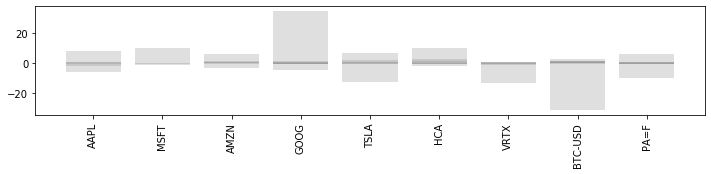

Episode 23/150 epsilon 0.9043820750088043


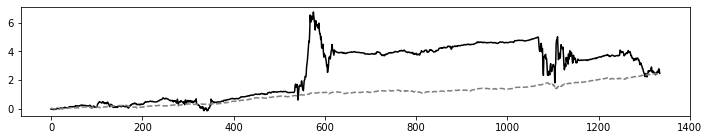

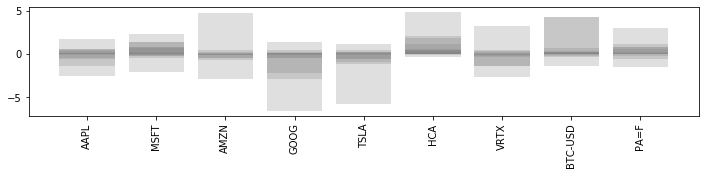

Episode 24/150 epsilon 0.8953382542587163


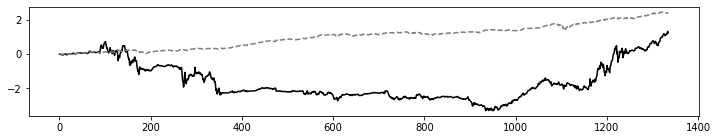

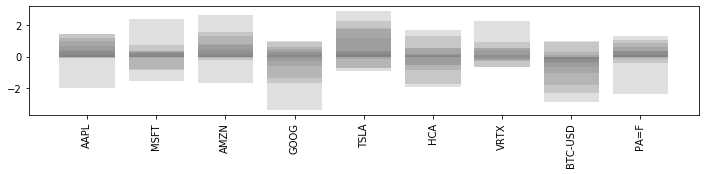

Episode 25/150 epsilon 0.8953382542587163


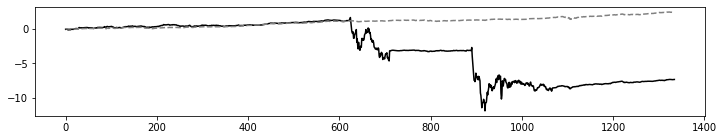

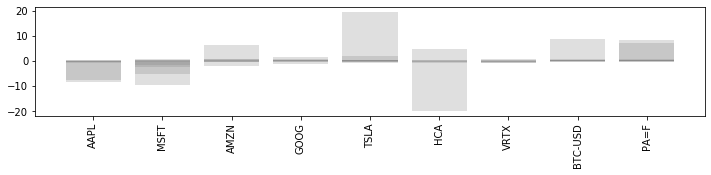

Episode 26/150 epsilon 0.8863848717161291


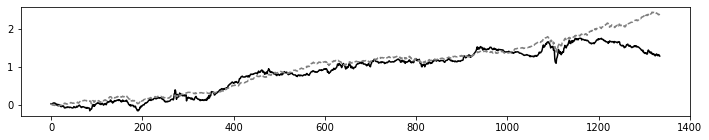

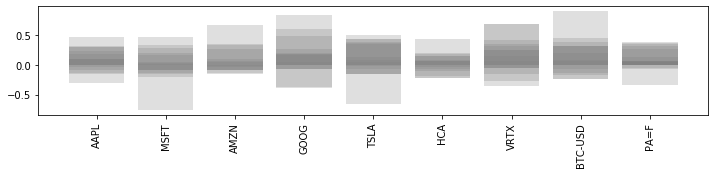

Episode 27/150 epsilon 0.8863848717161291


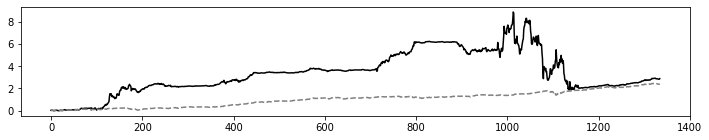

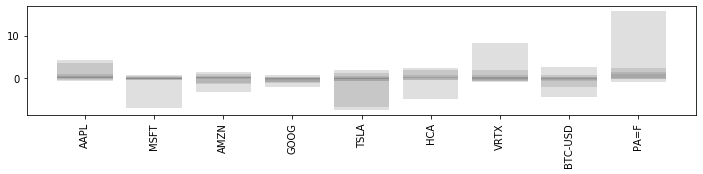

Episode 28/150 epsilon 0.8775210229989678


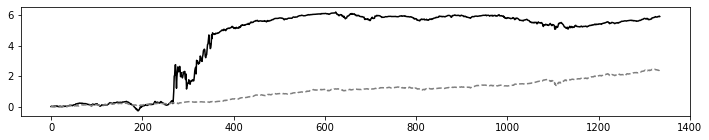

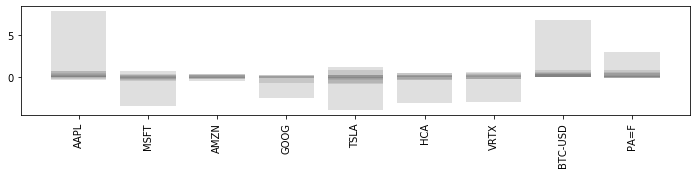

Episode 29/150 epsilon 0.8775210229989678


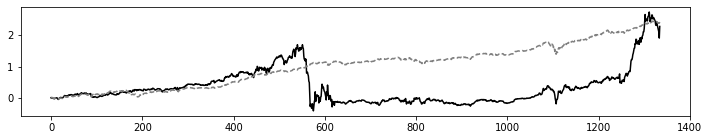

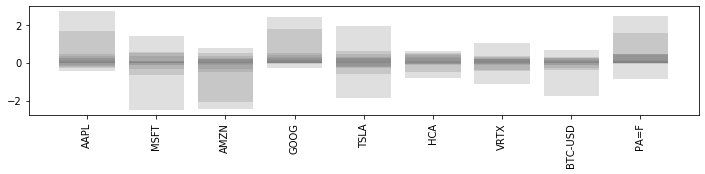

Episode 30/150 epsilon 0.8687458127689781


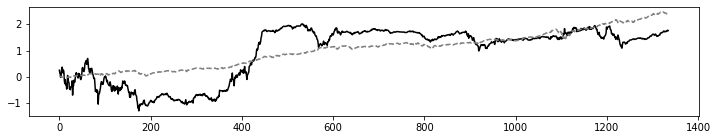

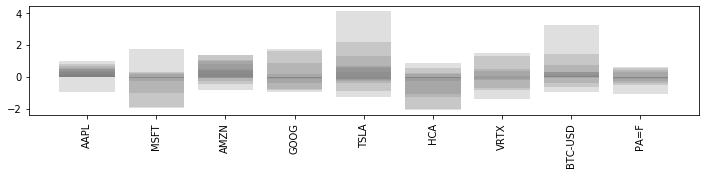

Episode 31/150 epsilon 0.8687458127689781


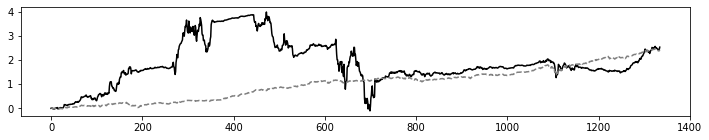

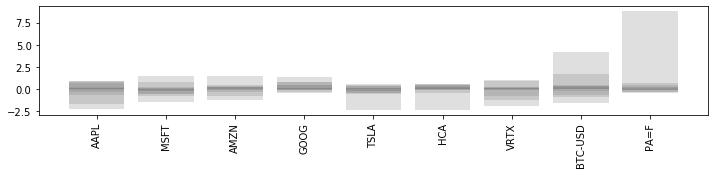

Episode 32/150 epsilon 0.8600583546412883


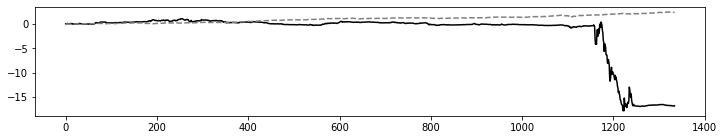

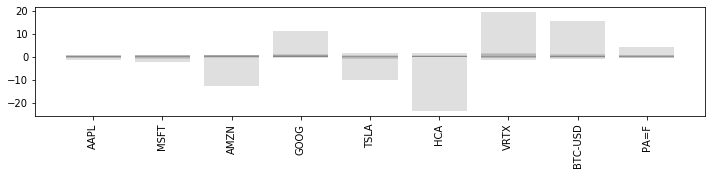

Episode 33/150 epsilon 0.8600583546412883


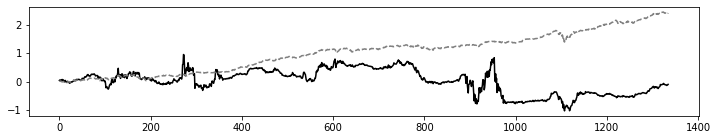

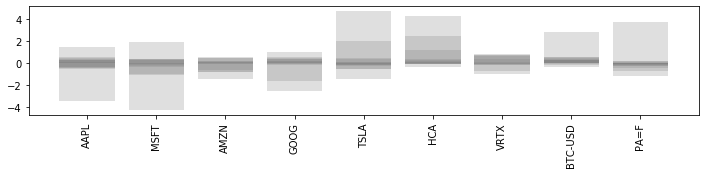

Episode 34/150 epsilon 0.8600583546412883


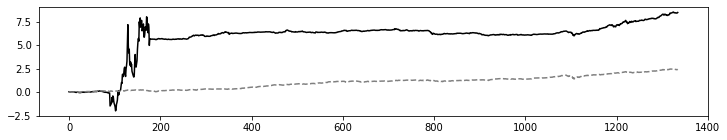

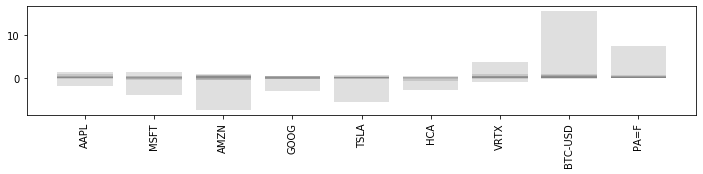

Episode 35/150 epsilon 0.8514577710948754


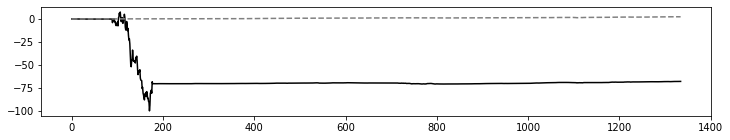

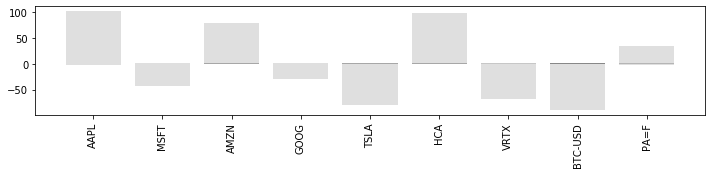

Episode 36/150 epsilon 0.8514577710948754


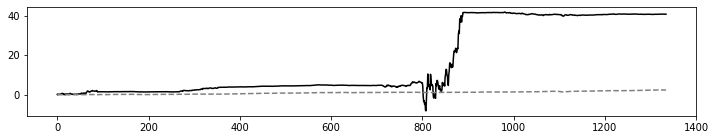

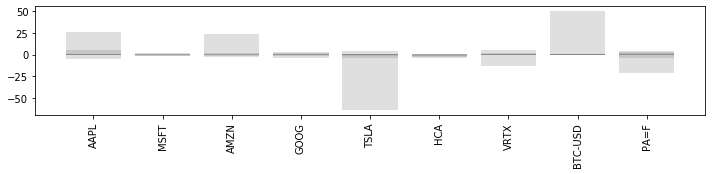

Episode 37/150 epsilon 0.8429431933839266


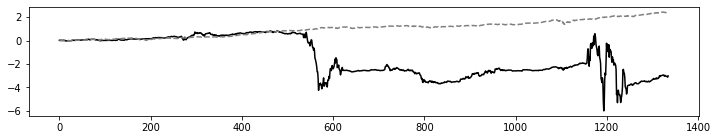

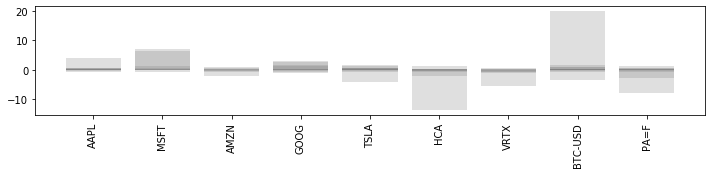

Episode 38/150 epsilon 0.8429431933839266


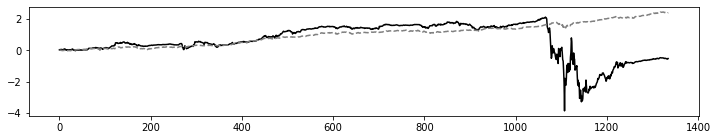

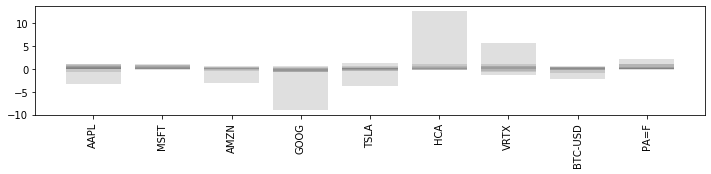

Episode 39/150 epsilon 0.8345137614500874


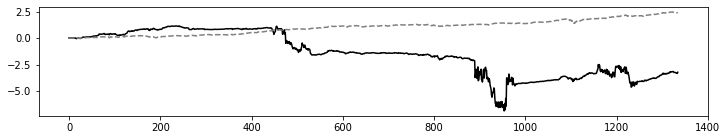

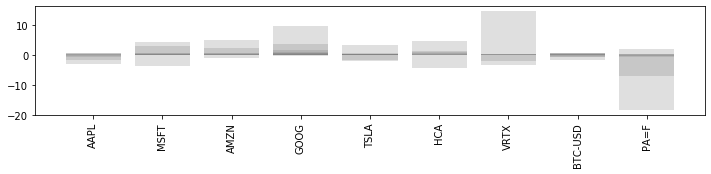

Episode 40/150 epsilon 0.8345137614500874


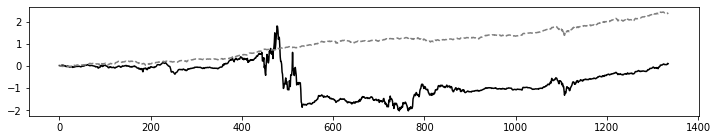

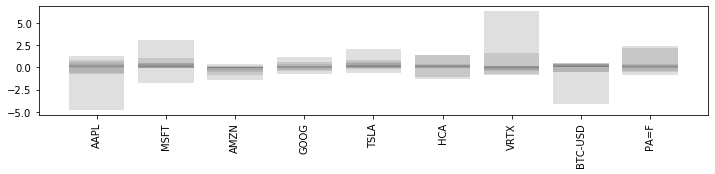

Episode 41/150 epsilon 0.8261686238355865


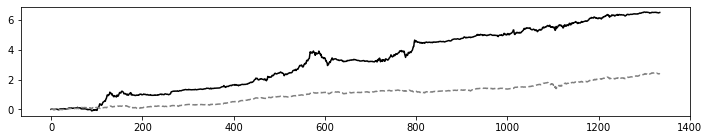

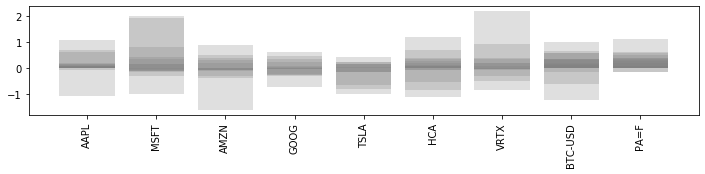

Episode 42/150 epsilon 0.8261686238355865


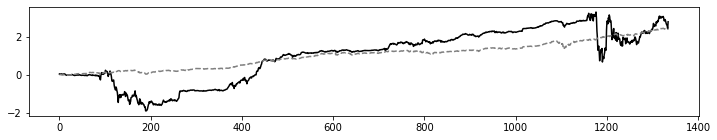

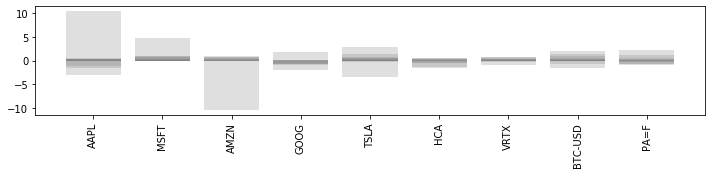

Episode 43/150 epsilon 0.8179069375972307


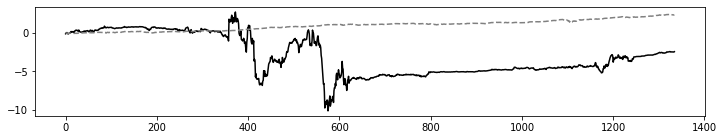

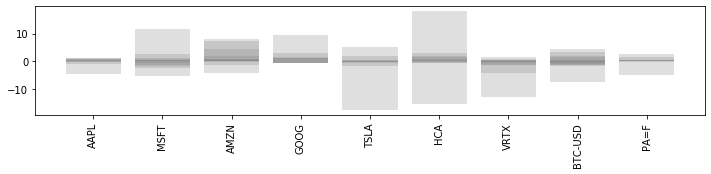

Episode 44/150 epsilon 0.8179069375972307


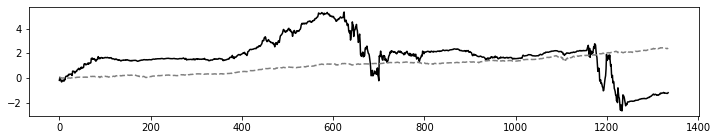

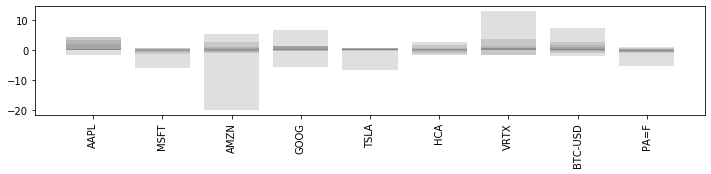

Episode 45/150 epsilon 0.8097278682212583


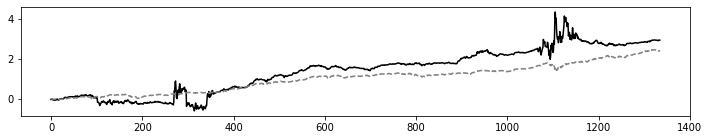

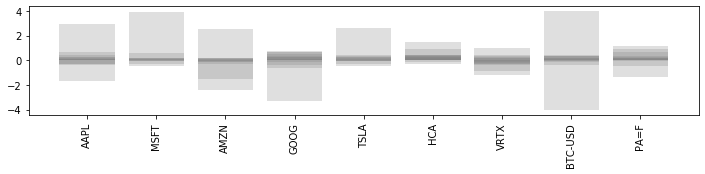

Episode 46/150 epsilon 0.8097278682212583


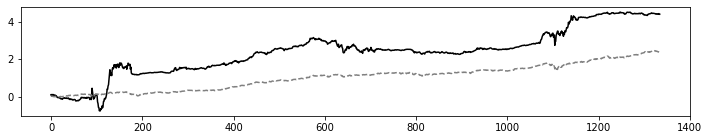

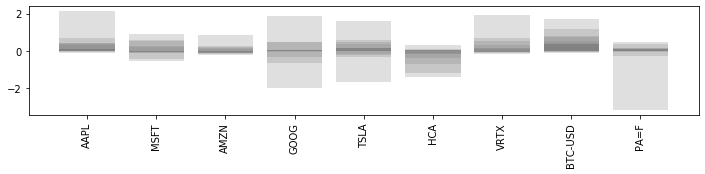

Episode 47/150 epsilon 0.8016305895390458


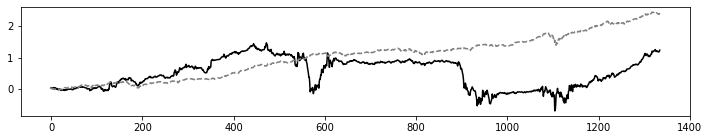

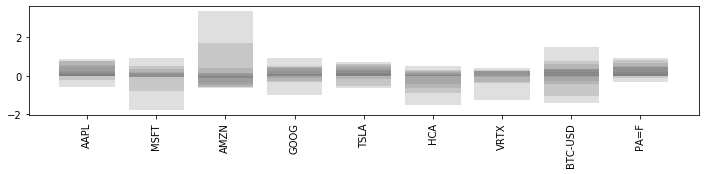

Episode 48/150 epsilon 0.8016305895390458


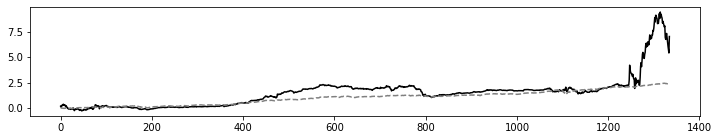

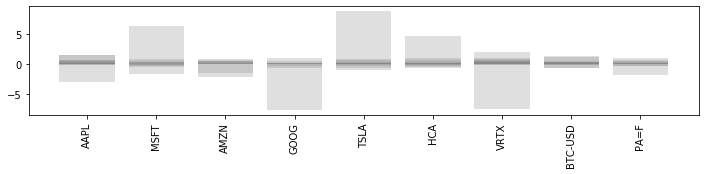

Episode 49/150 epsilon 0.8016305895390458


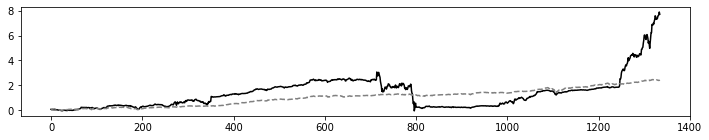

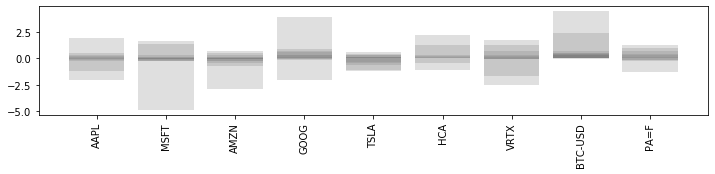

Episode 50/150 epsilon 0.7936142836436553


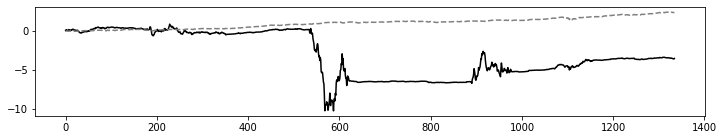

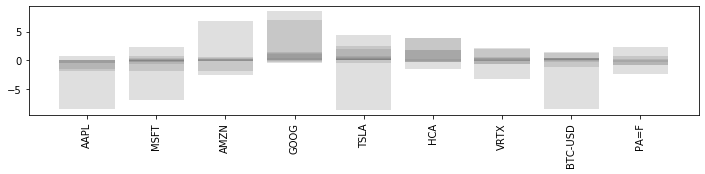

Episode 51/150 epsilon 0.7936142836436553


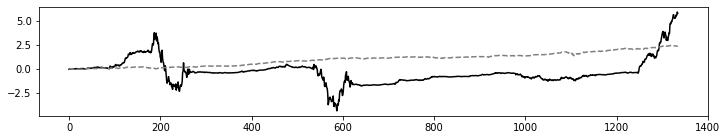

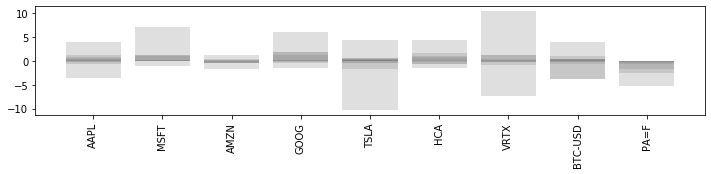

Episode 52/150 epsilon 0.7856781408072188


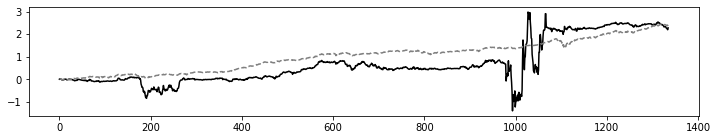

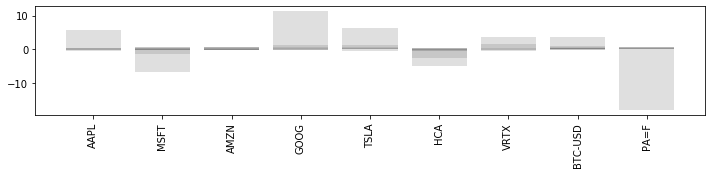

Episode 53/150 epsilon 0.7856781408072188


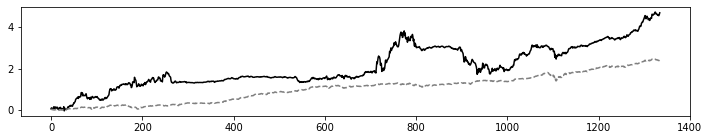

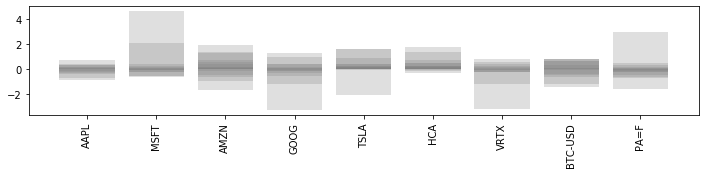

Episode 54/150 epsilon 0.7778213593991465


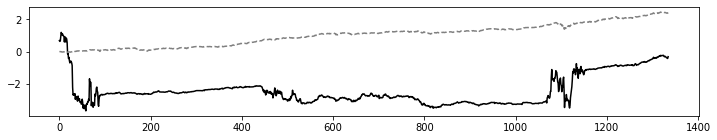

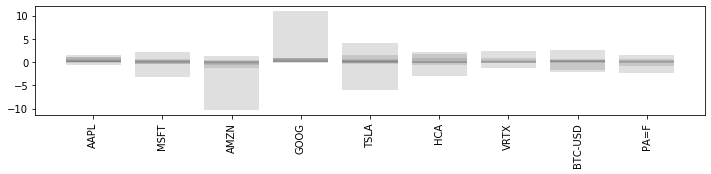

Episode 55/150 epsilon 0.7778213593991465


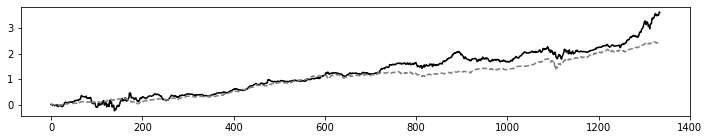

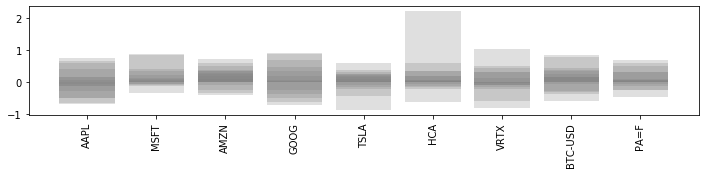

Episode 56/150 epsilon 0.7700431458051551


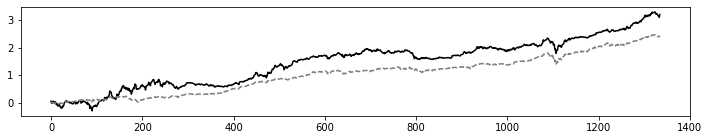

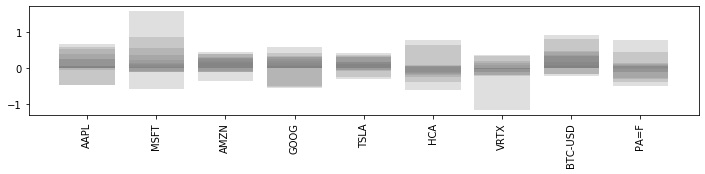

Episode 57/150 epsilon 0.7700431458051551


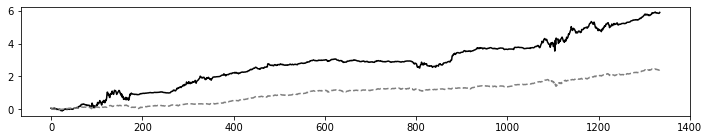

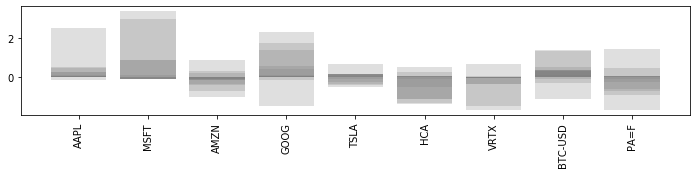

Episode 58/150 epsilon 0.7623427143471035


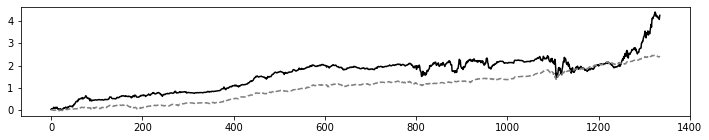

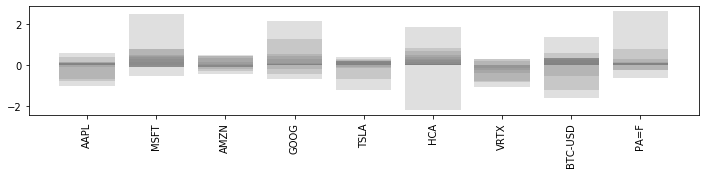

Episode 59/150 epsilon 0.7623427143471035


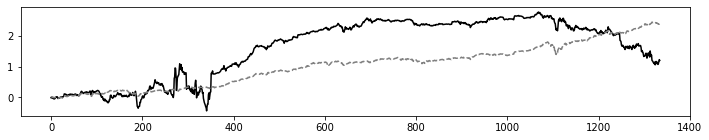

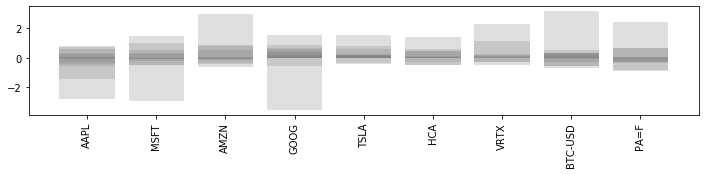

Episode 60/150 epsilon 0.7547192872036325


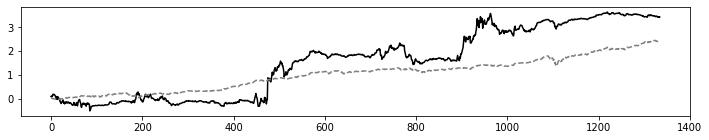

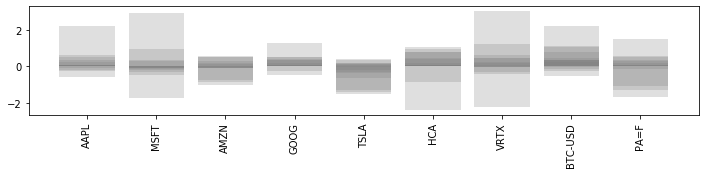

Episode 61/150 epsilon 0.7547192872036325


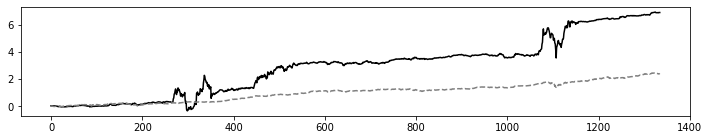

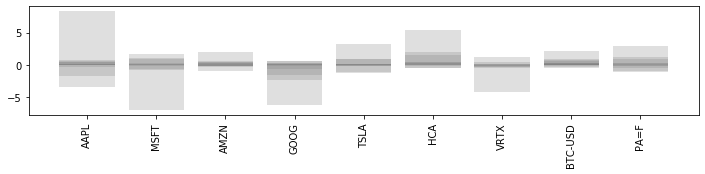

Episode 62/150 epsilon 0.7471720943315961


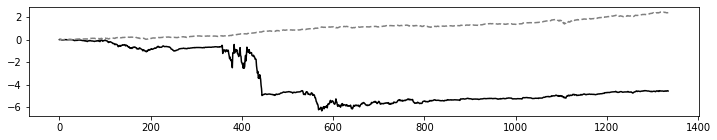

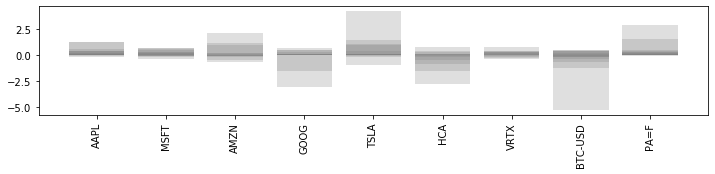

Episode 63/150 epsilon 0.7471720943315961


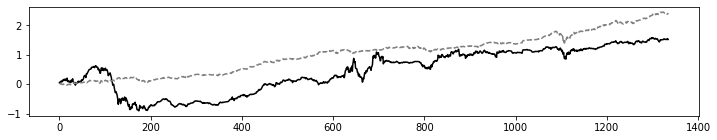

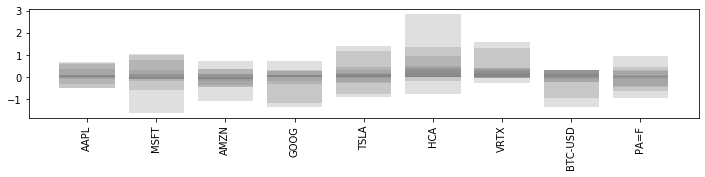

Episode 64/150 epsilon 0.7397003733882802


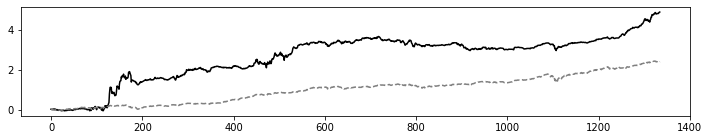

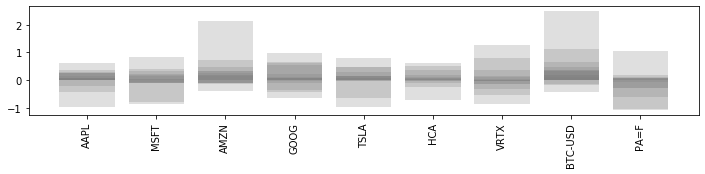

Episode 65/150 epsilon 0.7397003733882802


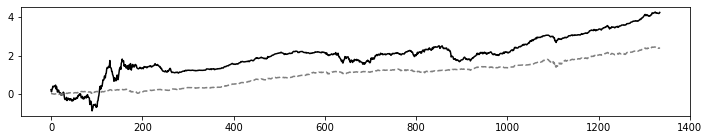

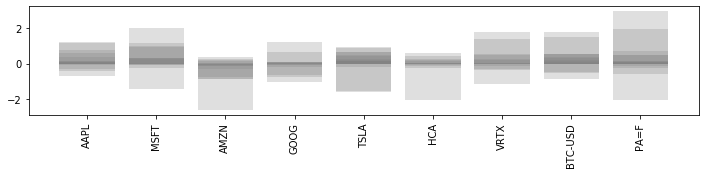

Episode 66/150 epsilon 0.7397003733882802


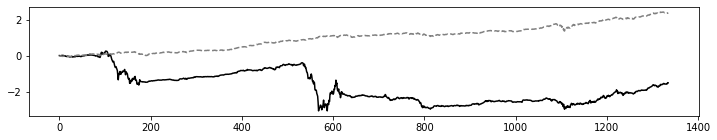

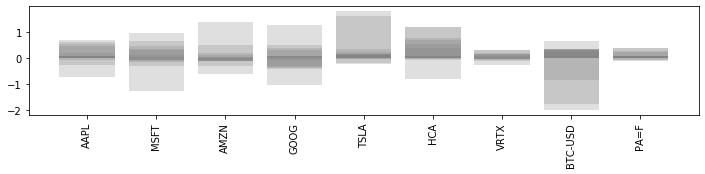

Episode 67/150 epsilon 0.7323033696543974


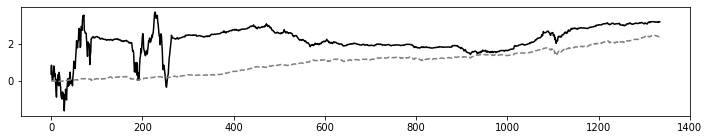

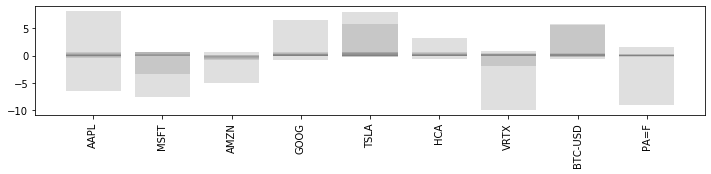

Episode 68/150 epsilon 0.7323033696543974


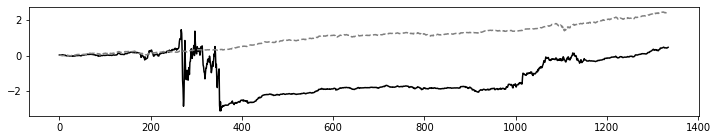

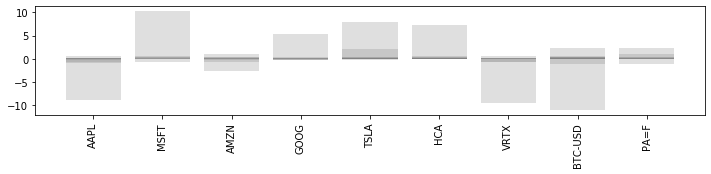

Episode 69/150 epsilon 0.7249803359578534


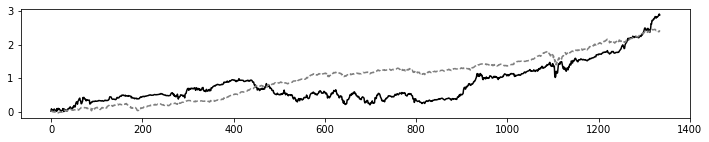

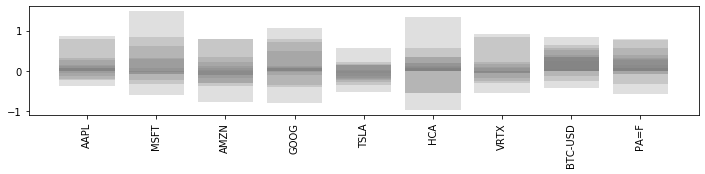

Episode 70/150 epsilon 0.7249803359578534


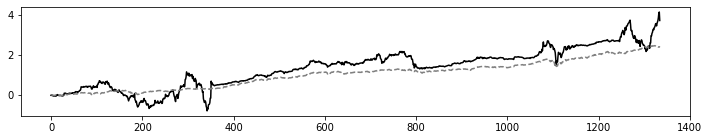

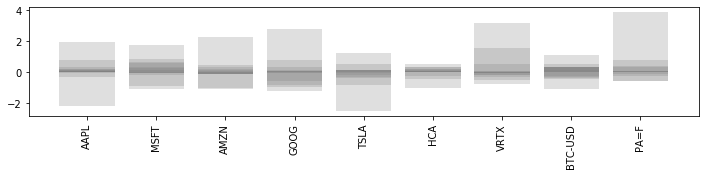

Episode 71/150 epsilon 0.7177305325982748


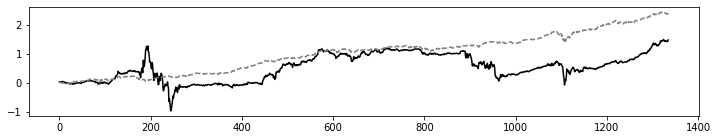

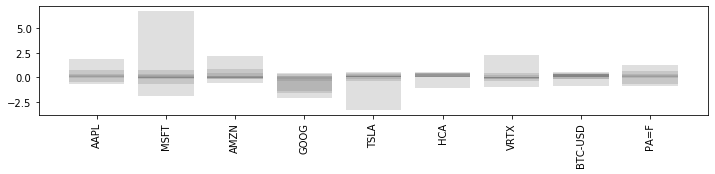

Episode 72/150 epsilon 0.7177305325982748


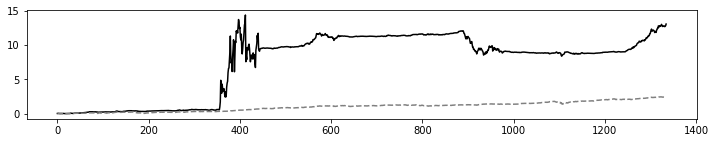

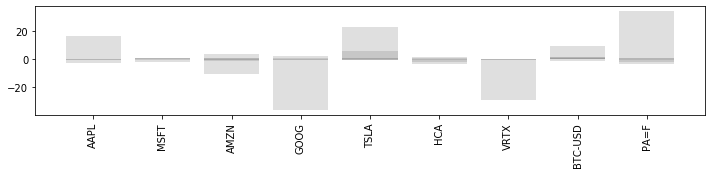

Episode 73/150 epsilon 0.7105532272722921


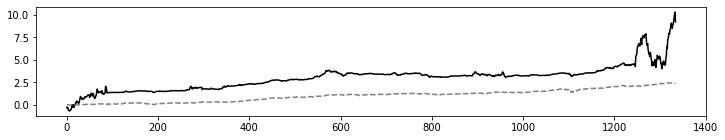

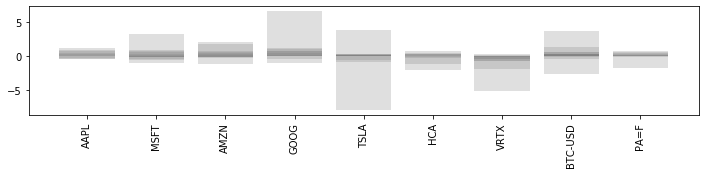

Episode 74/150 epsilon 0.7105532272722921


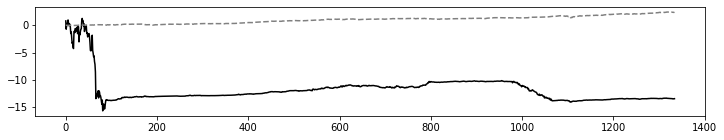

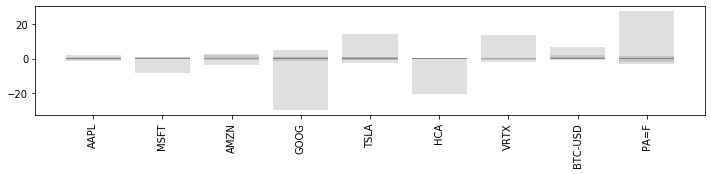

Episode 75/150 epsilon 0.7034476949995692


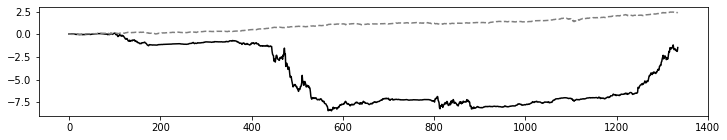

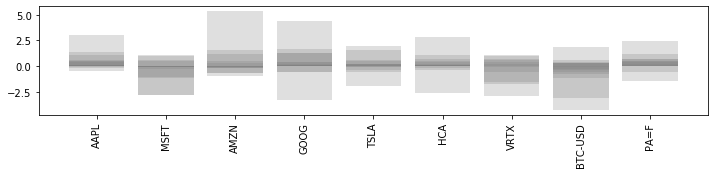

Episode 76/150 epsilon 0.7034476949995692


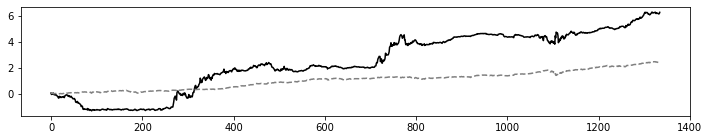

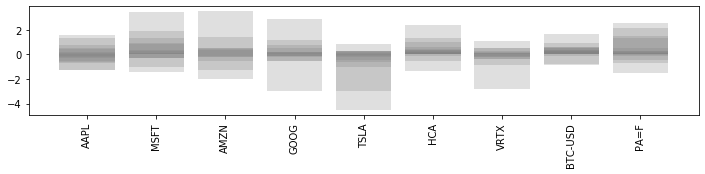

Episode 77/150 epsilon 0.6964132180495735


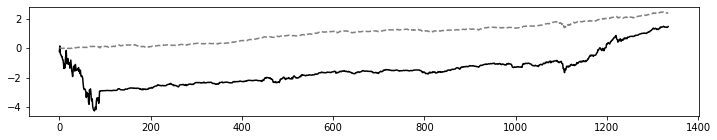

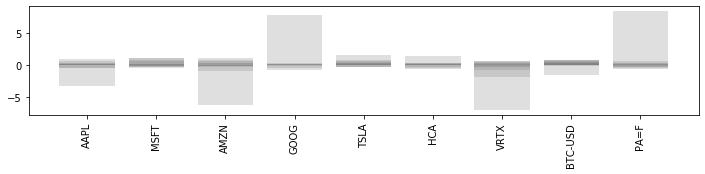

Episode 78/150 epsilon 0.6964132180495735


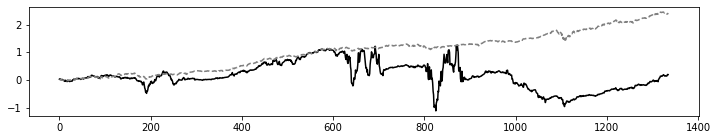

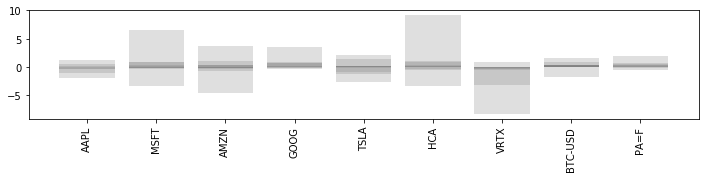

Episode 79/150 epsilon 0.6894490858690777


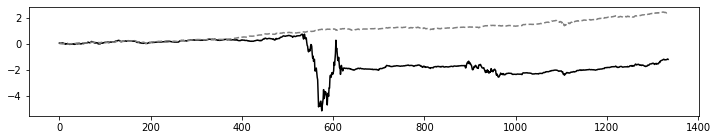

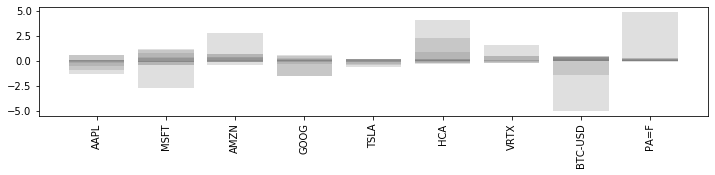

Episode 80/150 epsilon 0.6894490858690777


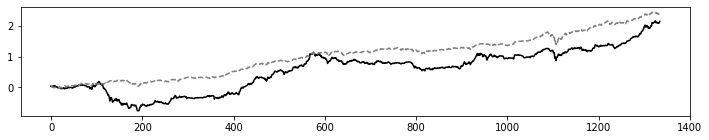

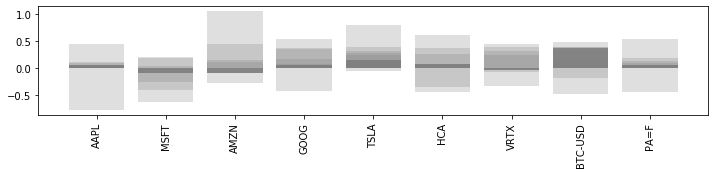

Episode 81/150 epsilon 0.6894490858690777


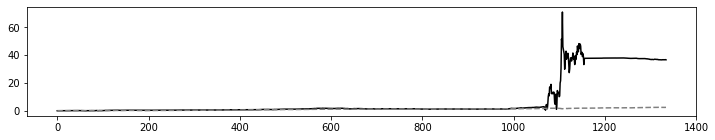

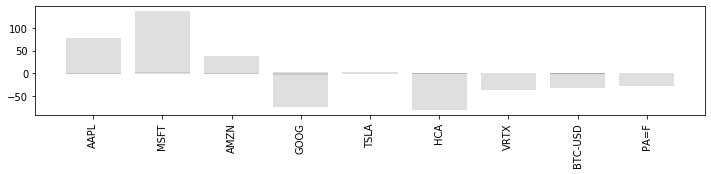

Episode 82/150 epsilon 0.682554595010387


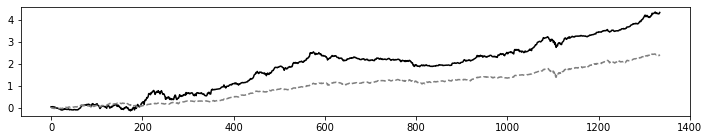

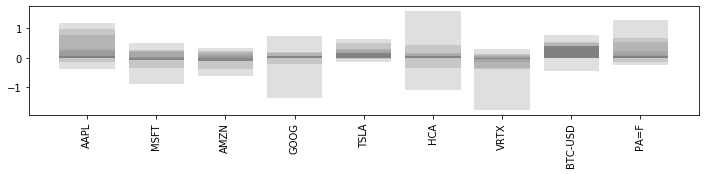

Episode 83/150 epsilon 0.682554595010387


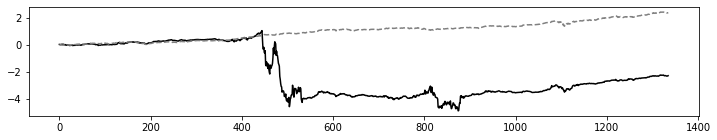

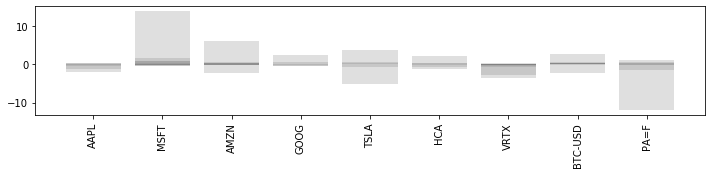

Episode 84/150 epsilon 0.6757290490602831


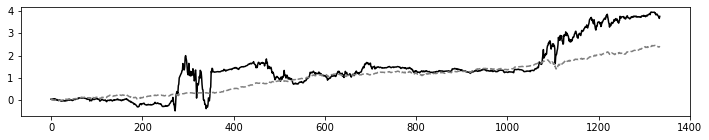

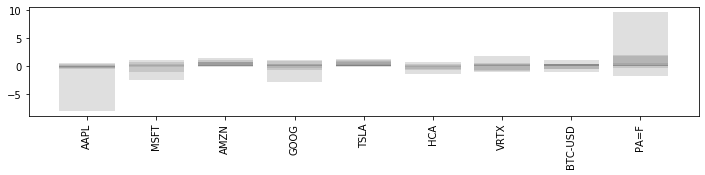

Episode 85/150 epsilon 0.6757290490602831


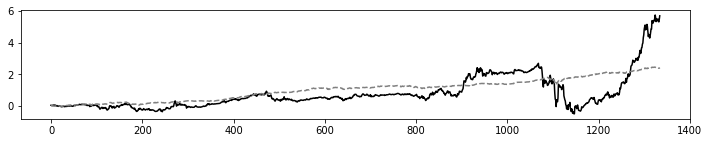

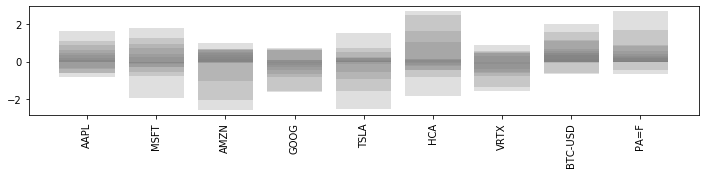

Episode 86/150 epsilon 0.6689717585696803


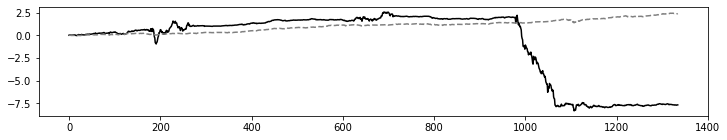

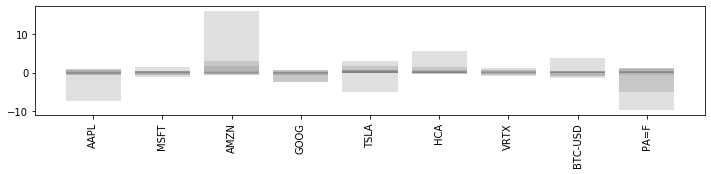

Episode 87/150 epsilon 0.6689717585696803


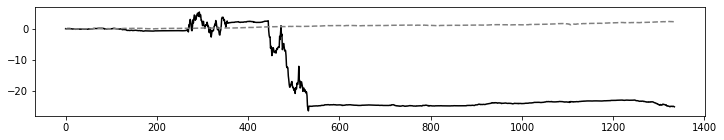

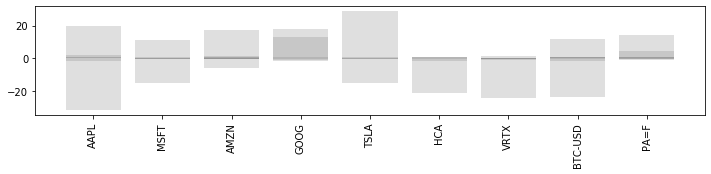

Episode 88/150 epsilon 0.6622820409839835


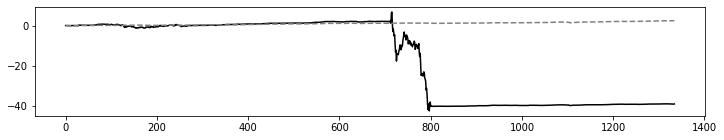

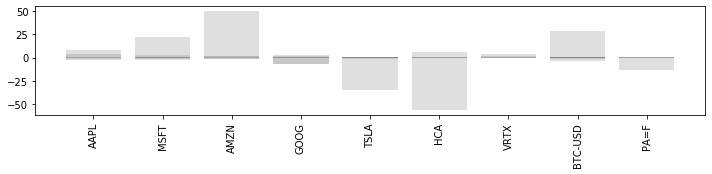

Episode 89/150 epsilon 0.6622820409839835


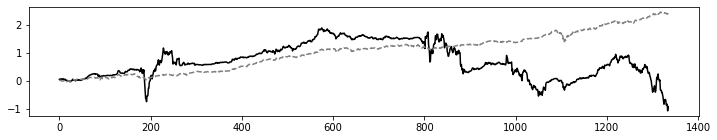

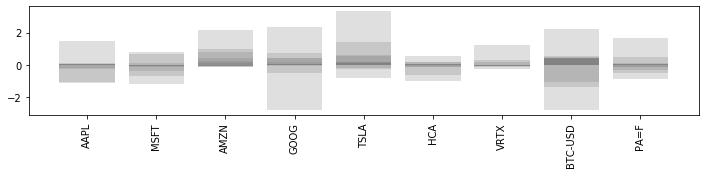

Episode 90/150 epsilon 0.6556592205741436


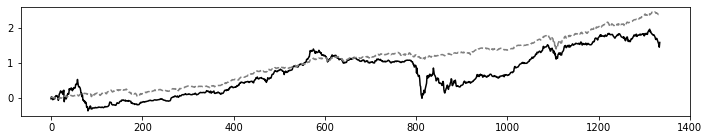

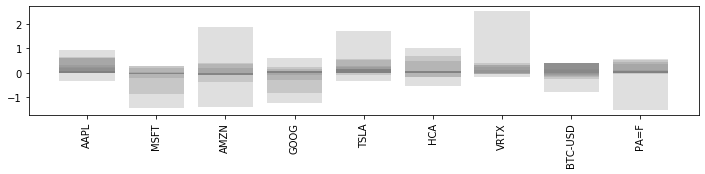

Episode 91/150 epsilon 0.6556592205741436


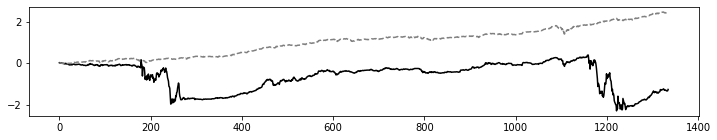

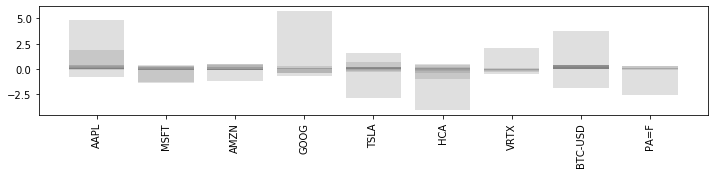

Episode 92/150 epsilon 0.6491026283684022


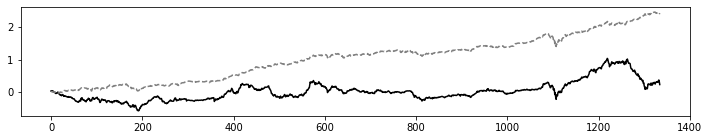

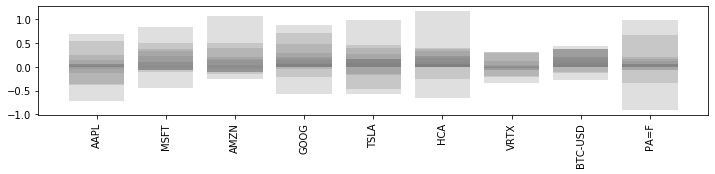

Episode 93/150 epsilon 0.6491026283684022


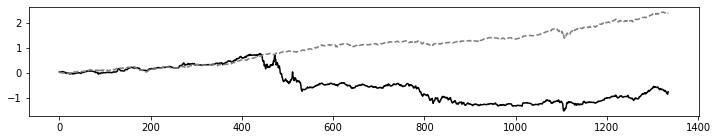

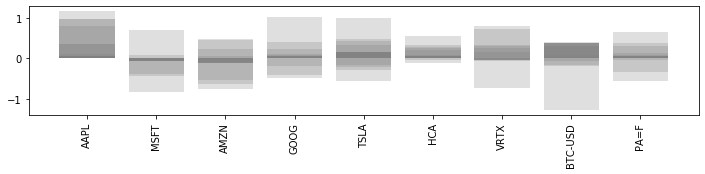

Episode 94/150 epsilon 0.6426116020847181


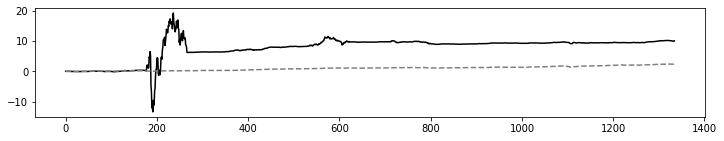

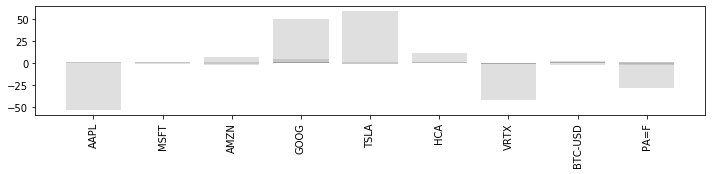

Episode 95/150 epsilon 0.6426116020847181


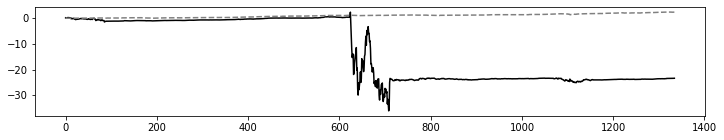

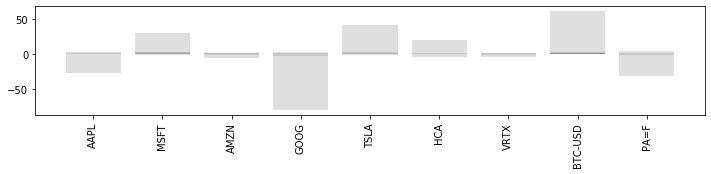

Episode 96/150 epsilon 0.6361854860638709


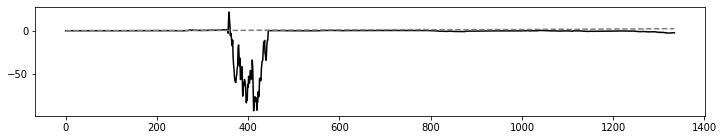

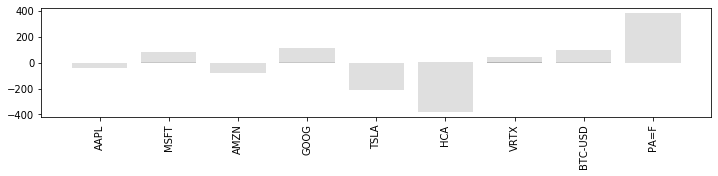

Episode 97/150 epsilon 0.6361854860638709


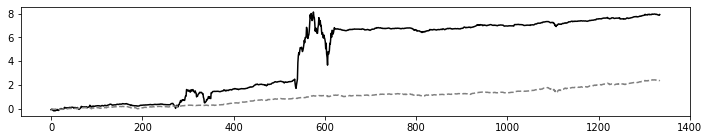

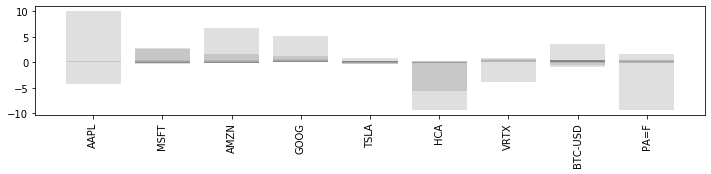

Episode 98/150 epsilon 0.6361854860638709


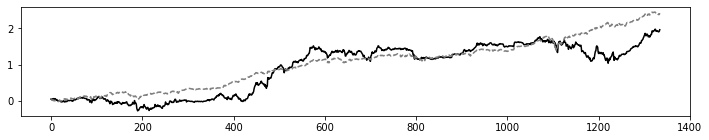

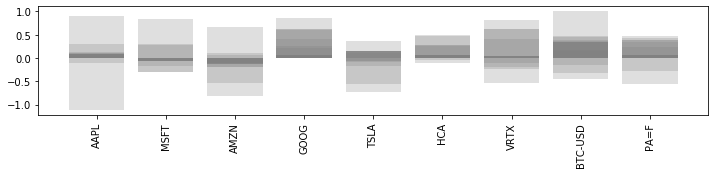

Episode 99/150 epsilon 0.6298236312032323


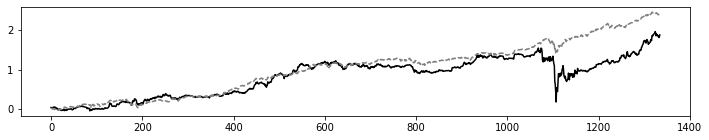

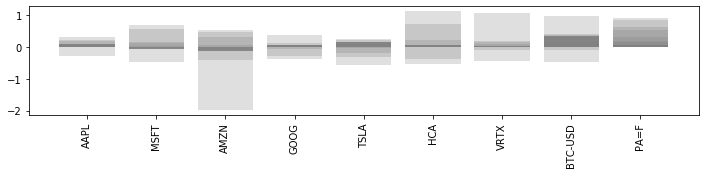

Episode 100/150 epsilon 0.6298236312032323


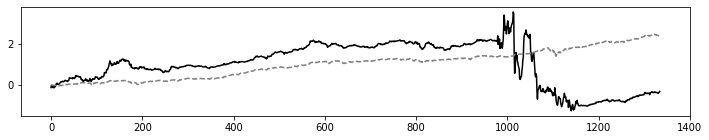

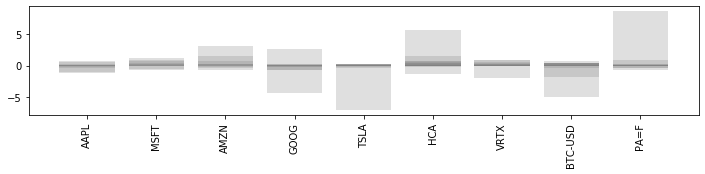

Episode 101/150 epsilon 0.6235253948912


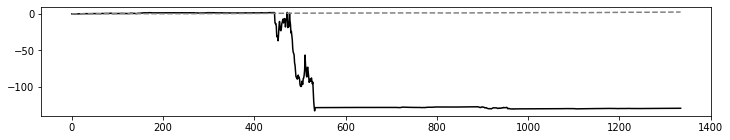

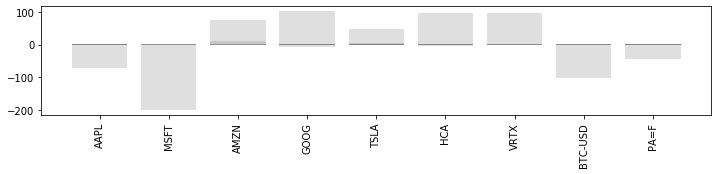

Episode 102/150 epsilon 0.6235253948912


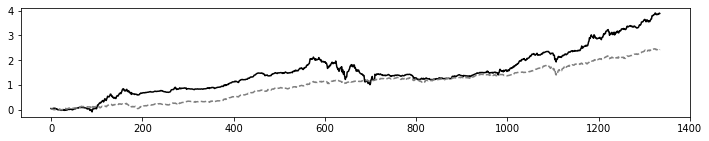

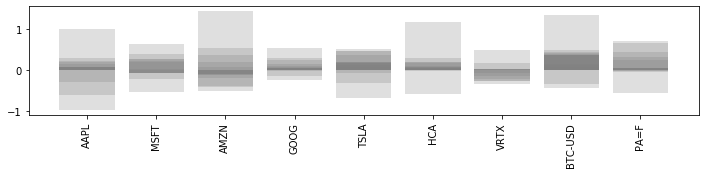

Episode 103/150 epsilon 0.617290140942288


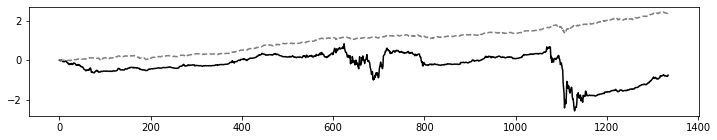

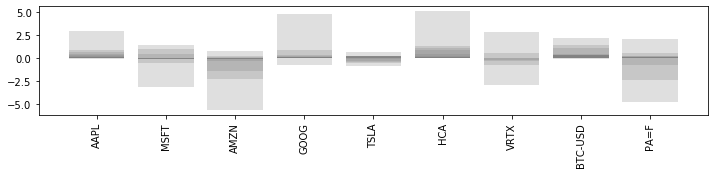

Episode 104/150 epsilon 0.617290140942288


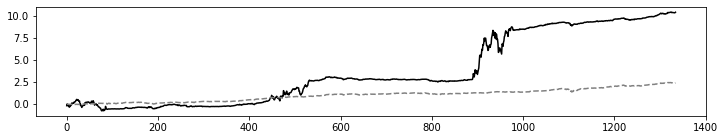

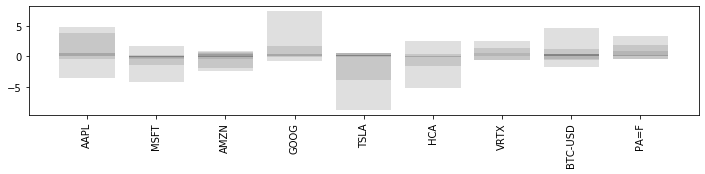

Episode 105/150 epsilon 0.6111172395328651


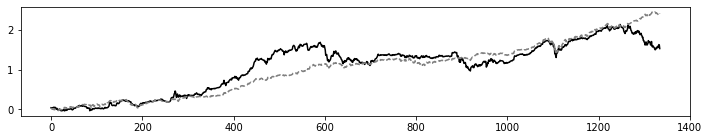

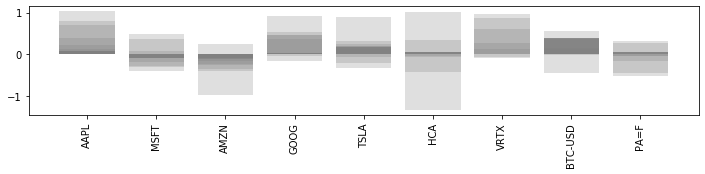

Episode 106/150 epsilon 0.6111172395328651


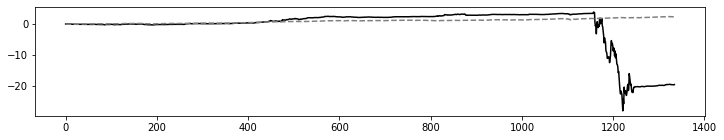

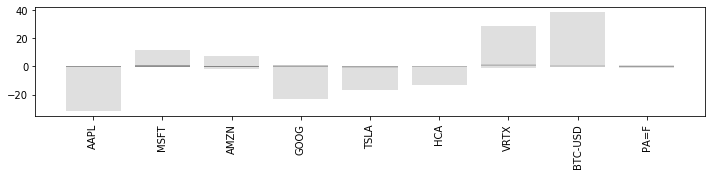

Episode 107/150 epsilon 0.6050060671375365


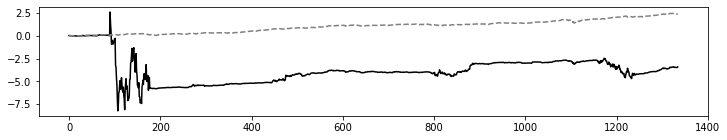

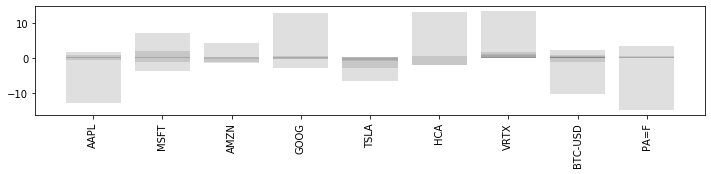

Episode 108/150 epsilon 0.6050060671375365


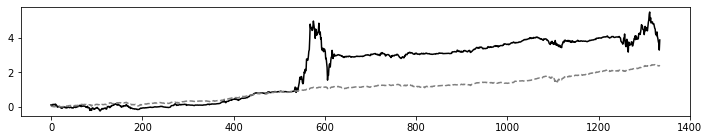

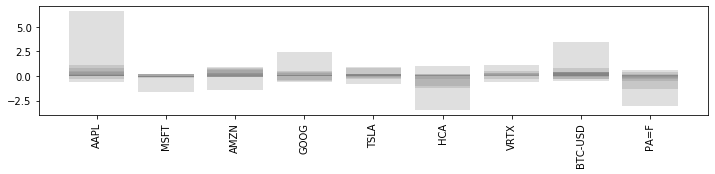

Episode 109/150 epsilon 0.5989560064661611


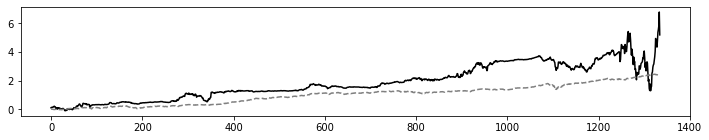

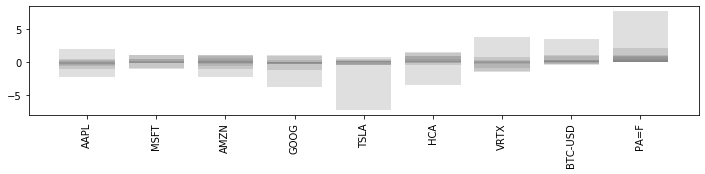

Episode 110/150 epsilon 0.5989560064661611


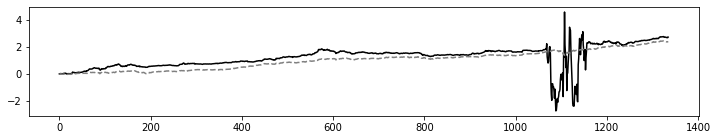

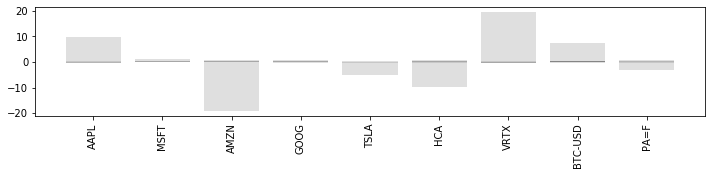

Episode 111/150 epsilon 0.5929664464014994


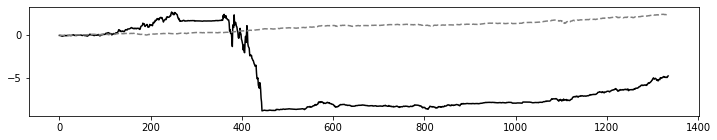

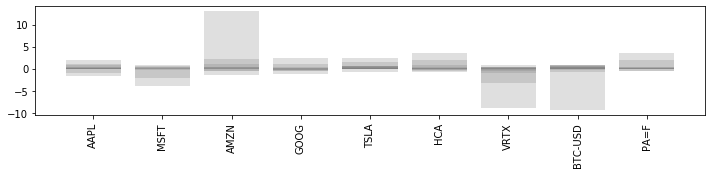

Episode 112/150 epsilon 0.5929664464014994


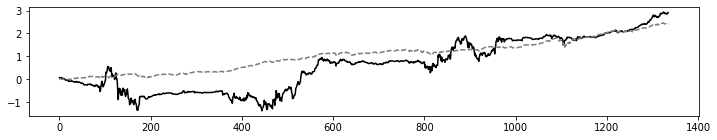

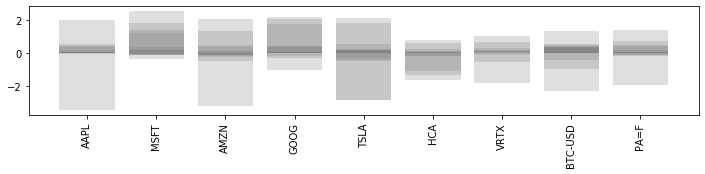

Episode 113/150 epsilon 0.5929664464014994


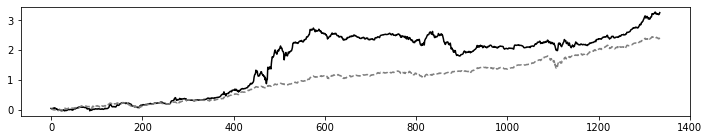

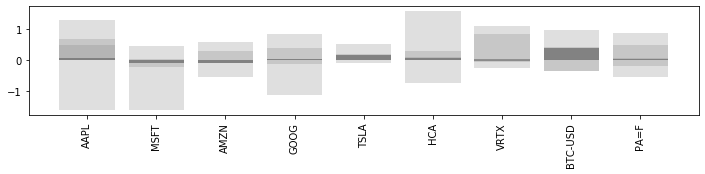

Episode 114/150 epsilon 0.5870367819374844


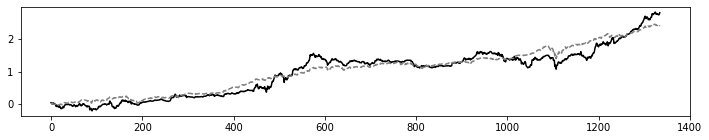

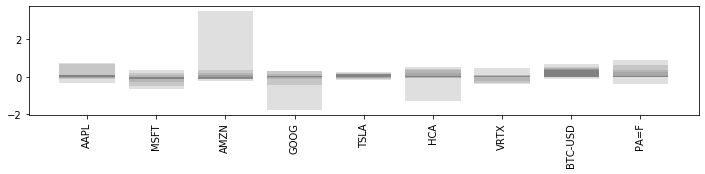

Episode 115/150 epsilon 0.5870367819374844


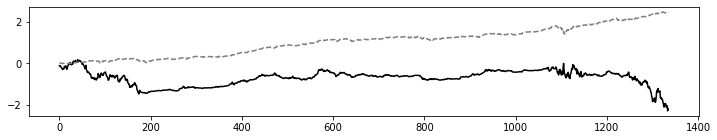

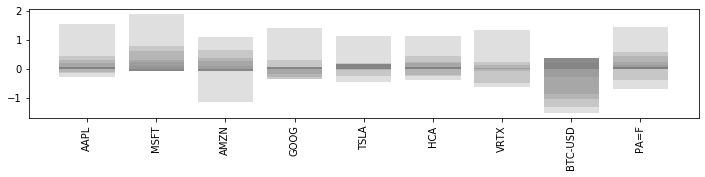

Episode 116/150 epsilon 0.5811664141181095


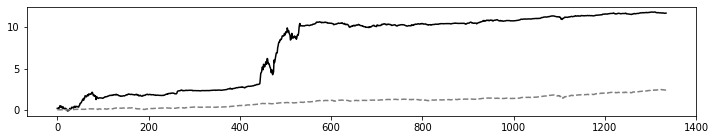

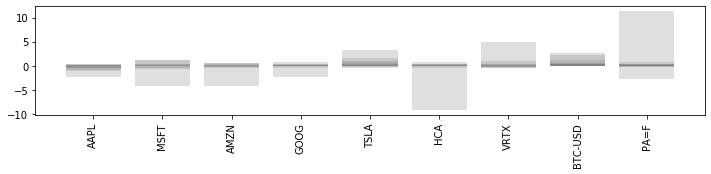

Episode 117/150 epsilon 0.5811664141181095


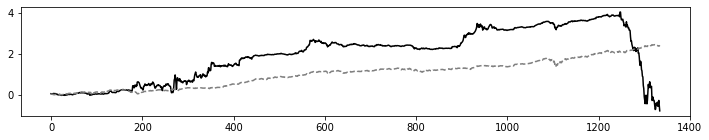

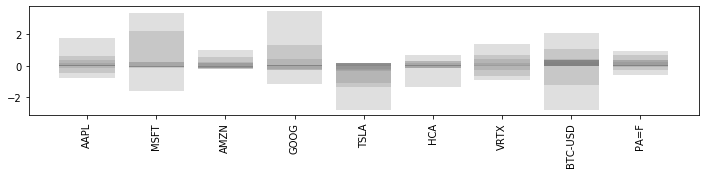

Episode 118/150 epsilon 0.5753547499769285


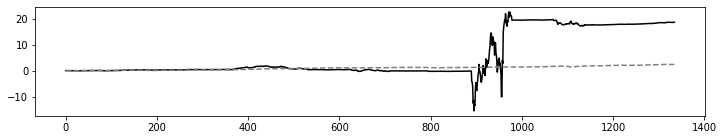

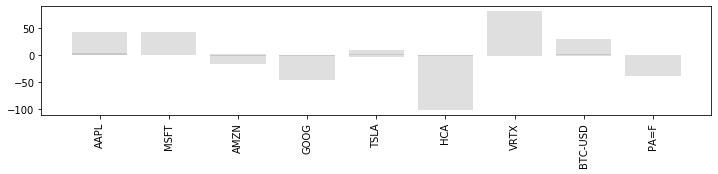

Episode 119/150 epsilon 0.5753547499769285


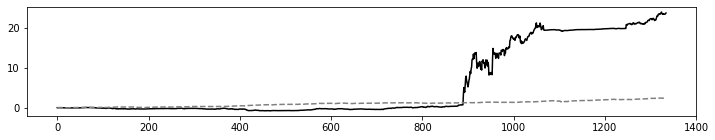

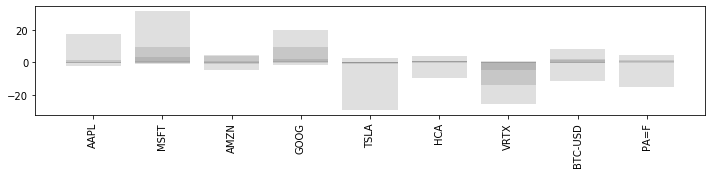

Episode 120/150 epsilon 0.5696012024771592


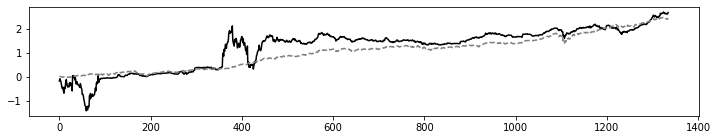

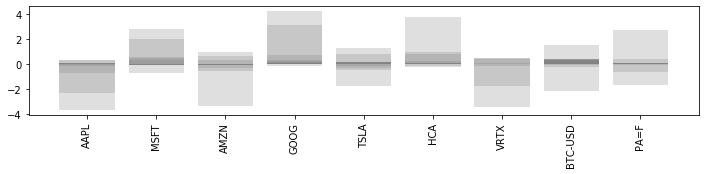

Episode 121/150 epsilon 0.5696012024771592


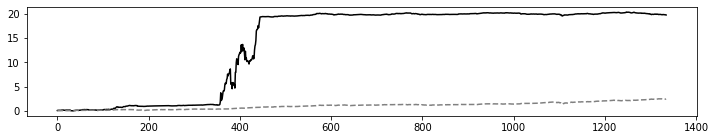

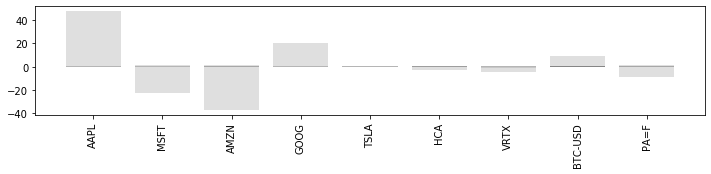

Episode 122/150 epsilon 0.5639051904523876


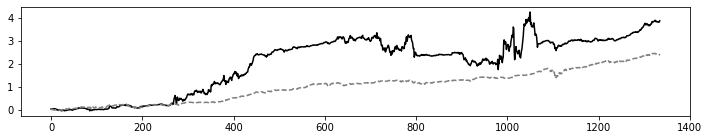

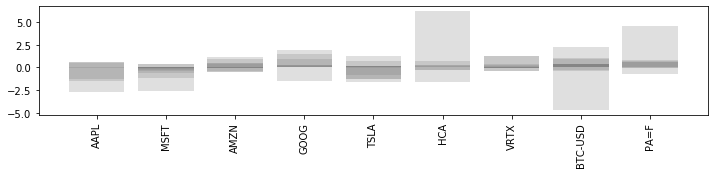

Episode 123/150 epsilon 0.5639051904523876


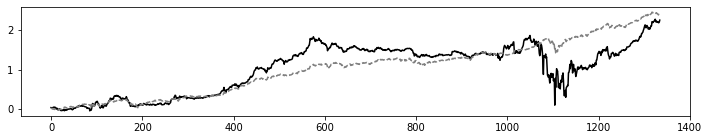

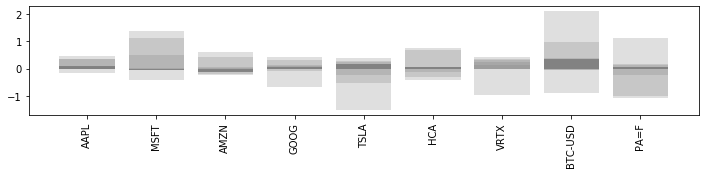

Episode 124/150 epsilon 0.5582661385478638


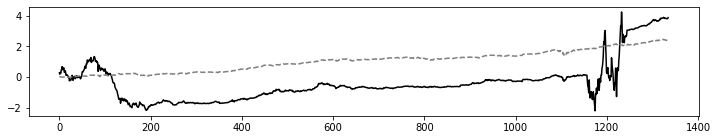

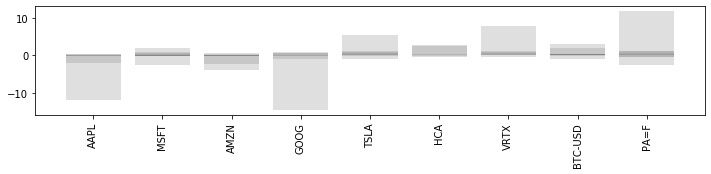

Episode 125/150 epsilon 0.5582661385478638


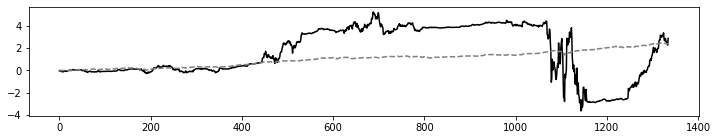

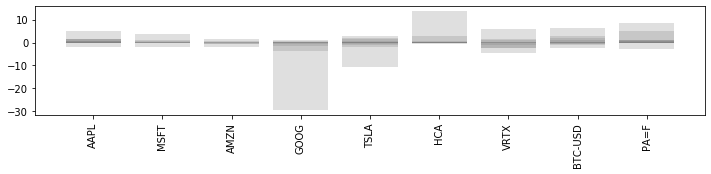

Episode 126/150 epsilon 0.5526834771623851


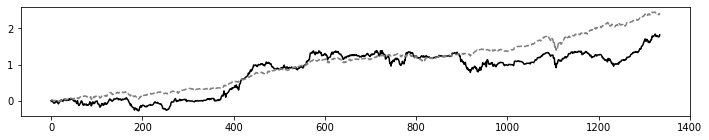

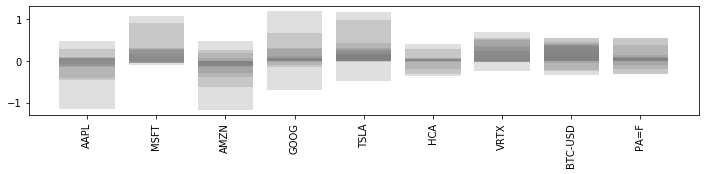

Episode 127/150 epsilon 0.5526834771623851


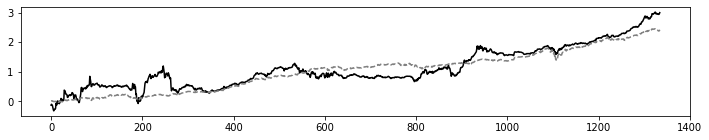

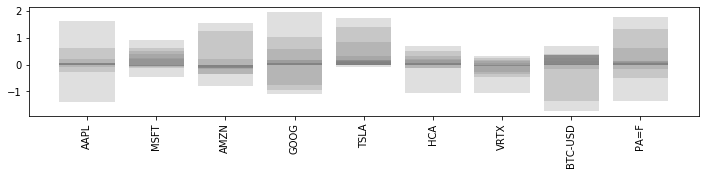

Episode 128/150 epsilon 0.5471566423907612


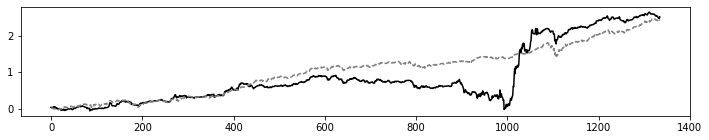

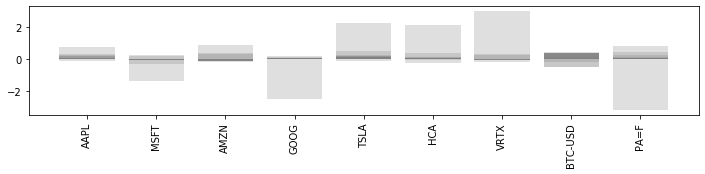

Episode 129/150 epsilon 0.5471566423907612


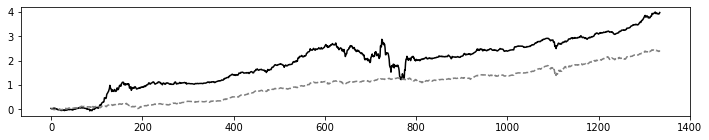

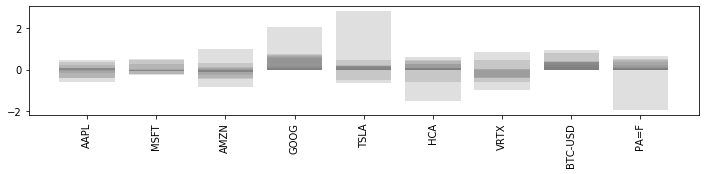

Episode 130/150 epsilon 0.5471566423907612


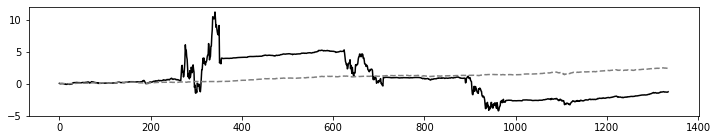

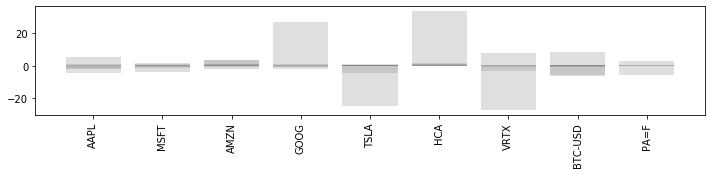

Episode 131/150 epsilon 0.5416850759668536


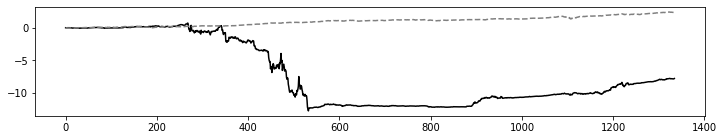

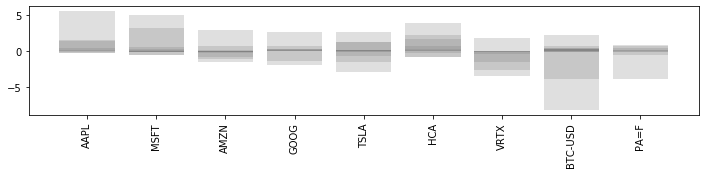

Episode 132/150 epsilon 0.5416850759668536


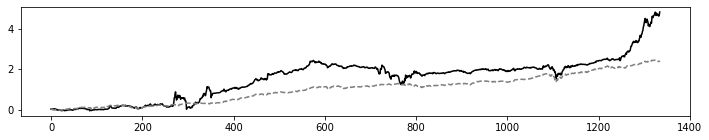

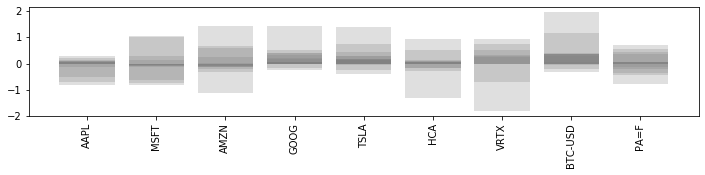

Episode 133/150 epsilon 0.536268225207185


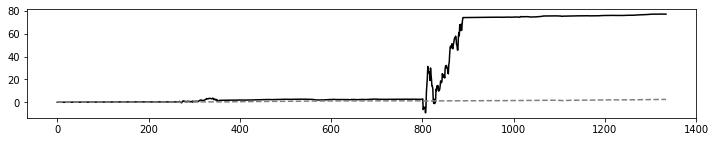

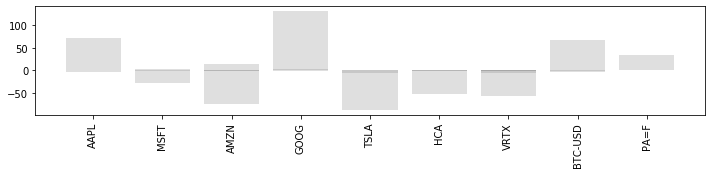

Episode 134/150 epsilon 0.536268225207185


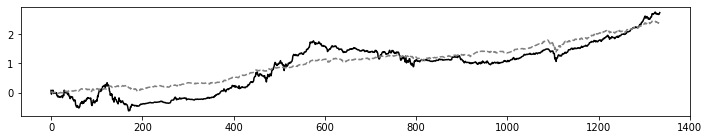

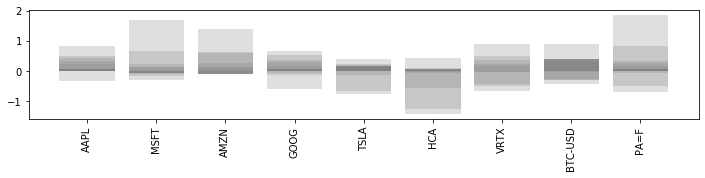

Episode 135/150 epsilon 0.5309055429551132


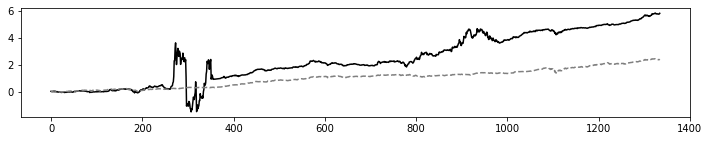

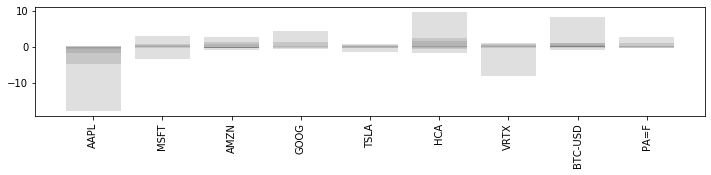

Episode 136/150 epsilon 0.5309055429551132


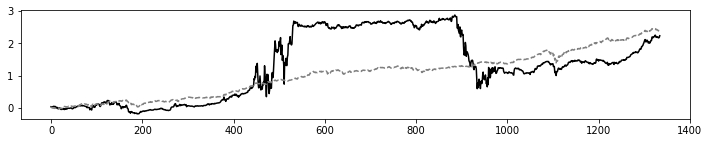

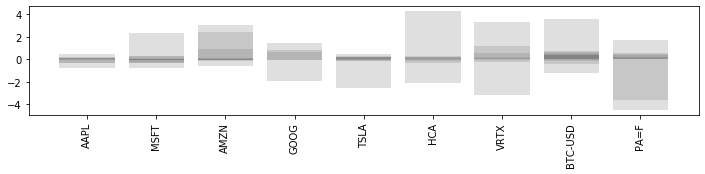

Episode 137/150 epsilon 0.525596487525562


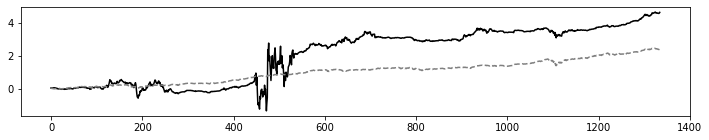

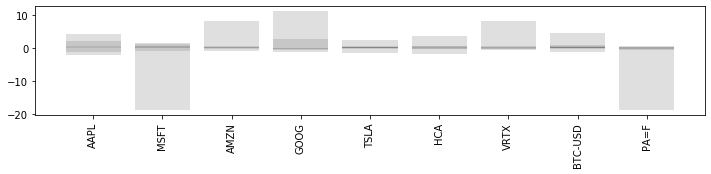

Episode 138/150 epsilon 0.525596487525562


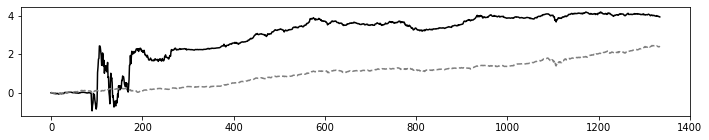

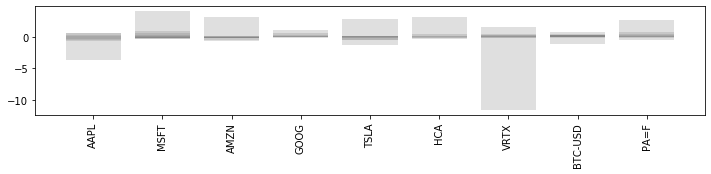

Episode 139/150 epsilon 0.5203405226503064


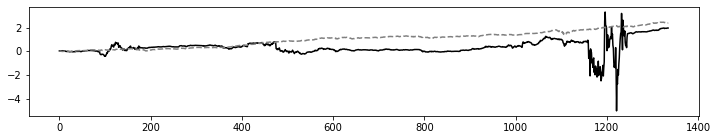

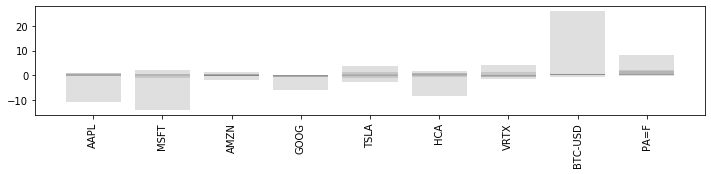

Episode 140/150 epsilon 0.5203405226503064


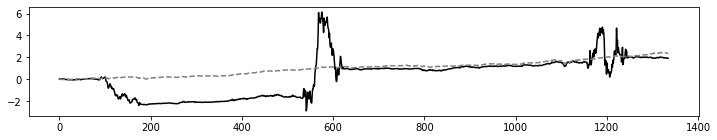

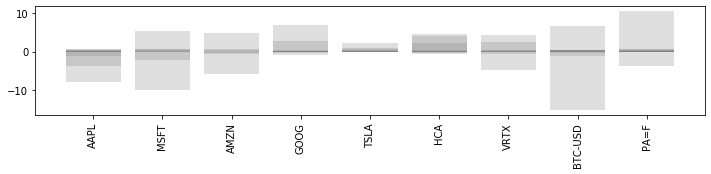

Episode 141/150 epsilon 0.5151371174238033


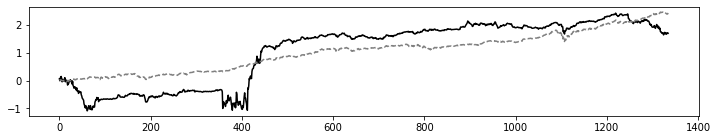

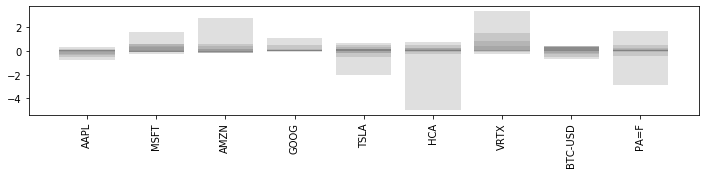

Episode 142/150 epsilon 0.5151371174238033


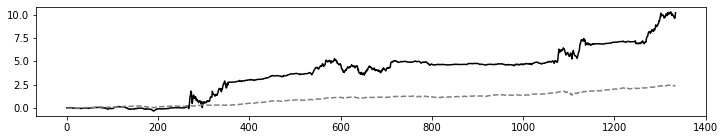

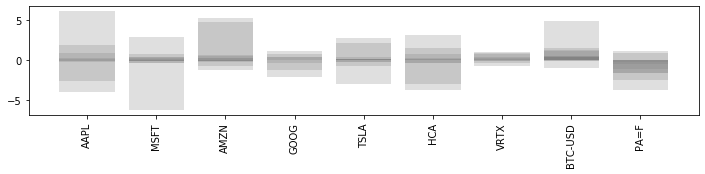

Episode 143/150 epsilon 0.5099857462495653


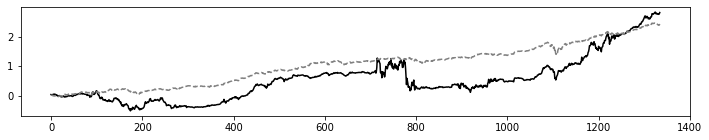

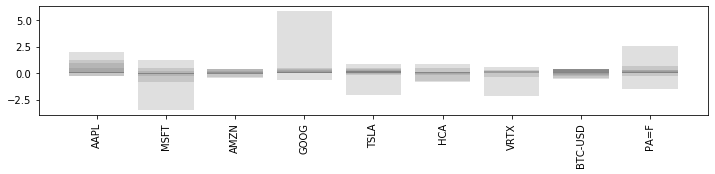

Episode 144/150 epsilon 0.5099857462495653


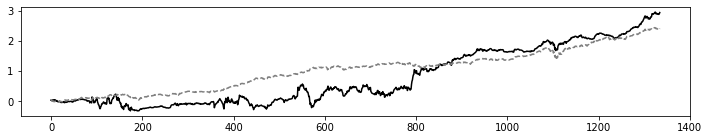

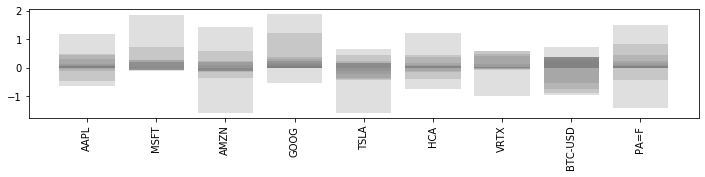

Episode 145/150 epsilon 0.5099857462495653


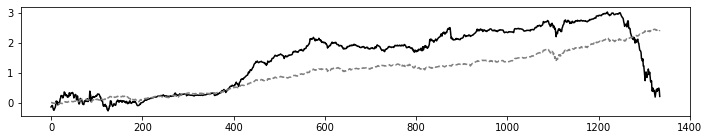

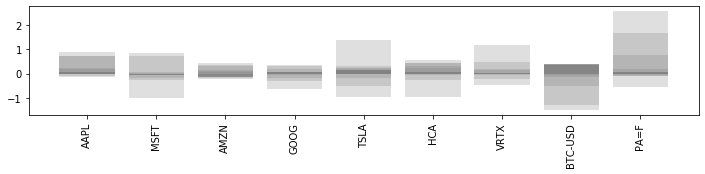

Episode 146/150 epsilon 0.5048858887870696


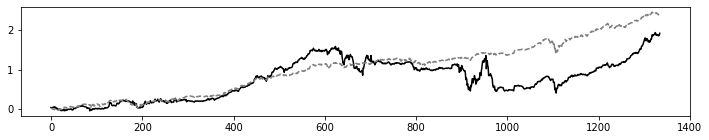

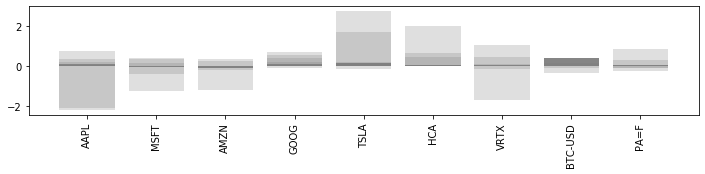

Episode 147/150 epsilon 0.5048858887870696


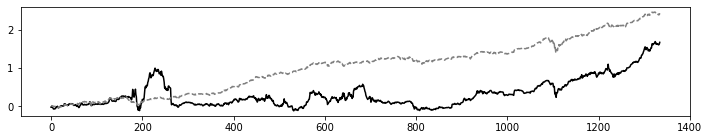

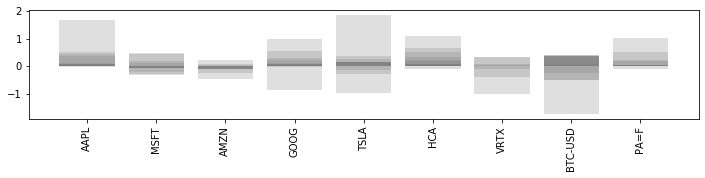

Episode 148/150 epsilon 0.4998370298991989


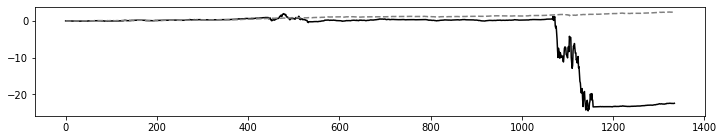

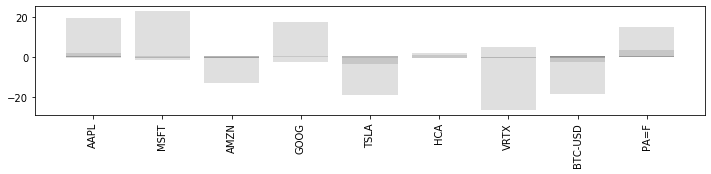

Episode 149/150 epsilon 0.4998370298991989


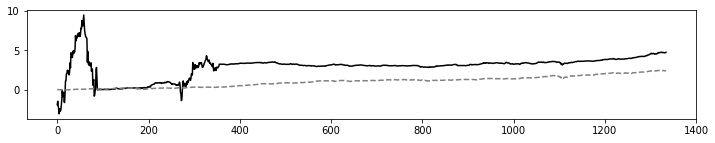

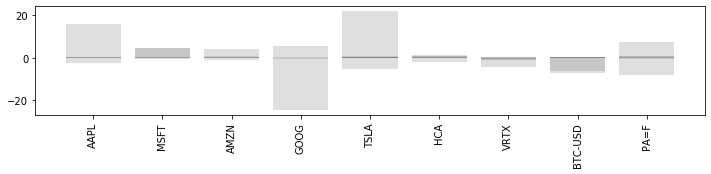

In [111]:
for e in range(episode_count):
    
    agent.is_eval = False
    data_length = len(env.data)
    
    returns_history = []
    returns_history_equal = []
    
    rewards_history = []
    equal_rewards = []
    
    actions_to_show = []
    
    print("Episode " + str(e) + "/" + str(episode_count), 'epsilon', agent.epsilon)

    s = env.get_state(np.random.randint(window_size+1, data_length-window_size-1), window_size)
    total_profit = 0 

    for t in range(window_size, data_length, rebalance_period):

        date1 = t-rebalance_period
        
        s_ = env.get_state(t, window_size)
        action = agent.act(s_)
        
        actions_to_show.append(action[0])

        weighted_returns, reward = env.get_reward(action[0], date1, t)
        weighted_returns_equal, reward_equal = env.get_reward(
            np.ones(agent.portfolio_size) / agent.portfolio_size, date1, t)

        rewards_history.append(reward)
        equal_rewards.append(reward_equal)
        returns_history.extend(weighted_returns)
        returns_history_equal.extend(weighted_returns_equal)

        done = True if t == data_length else False
        agent.memory4replay.append((s, s_, action, reward, done))
        
        if len(agent.memory4replay) >= batch_size:
            agent.expReplay(batch_size)
            agent.memory4replay = []
            
        s = s_

    rl_result = np.array(returns_history).cumsum()
    equal_result = np.array(returns_history_equal).cumsum()

    plt.figure(figsize = (12, 2))
    plt.plot(rl_result, color = 'black', ls = '-')
    plt.plot(equal_result, color = 'grey', ls = '--')
    plt.show()
    
    plt.figure(figsize = (12, 2))
    for a in actions_to_show:    
        plt.bar(np.arange(N_ASSETS), a, color = 'grey', alpha = 0.25)
        plt.xticks(np.arange(N_ASSETS), env.data.columns, rotation='vertical')
    plt.show()


In [112]:
agent.is_eval = True

actions_equal, actions_rl = [], []
result_equal, result_rl = [], []

for t in range(window_size, len(env.data), rebalance_period):

    date1 = t-rebalance_period
    s_ = env.get_state(t, window_size)
    action = agent.act(s_)

    weighted_returns, reward = env.get_reward(action[0], date1, t)
    weighted_returns_equal, reward_equal = env.get_reward(
        np.ones(agent.portfolio_size) / agent.portfolio_size, date1, t)

    result_equal.append(weighted_returns_equal.tolist())
    actions_equal.append(np.ones(agent.portfolio_size) / agent.portfolio_size)
    
    result_rl.append(weighted_returns.tolist())
    actions_rl.append(action[0])

In [113]:
result_equal_vis = [item for sublist in result_equal for item in sublist]
result_rl_vis = [item for sublist in result_rl for item in sublist]

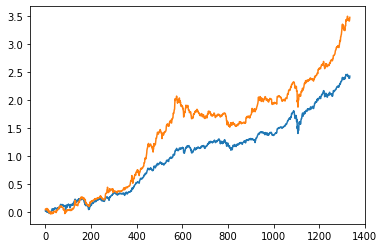

In [114]:
plt.figure()
plt.plot(np.array(result_equal_vis).cumsum())
plt.plot(np.array(result_rl_vis).cumsum())
plt.show()

In [115]:
print('EQUAL', print_stats(result_equal_vis, result_equal_vis))
print('RL AGENT', print_stats(result_rl_vis, result_equal_vis))

EQUAL [0.0018, 0.0148, 1.9357, -0.0, 1.0]
RL AGENT [0.0026, 0.0214, 1.9142, 0.0009, 0.9455]


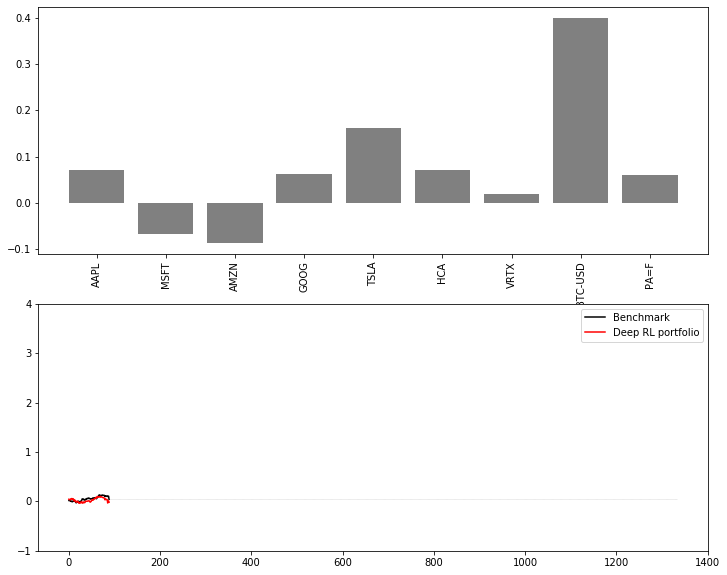

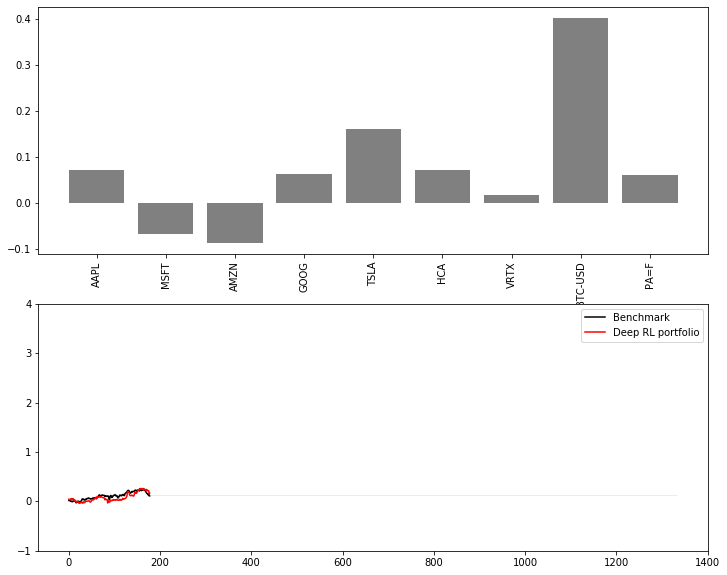

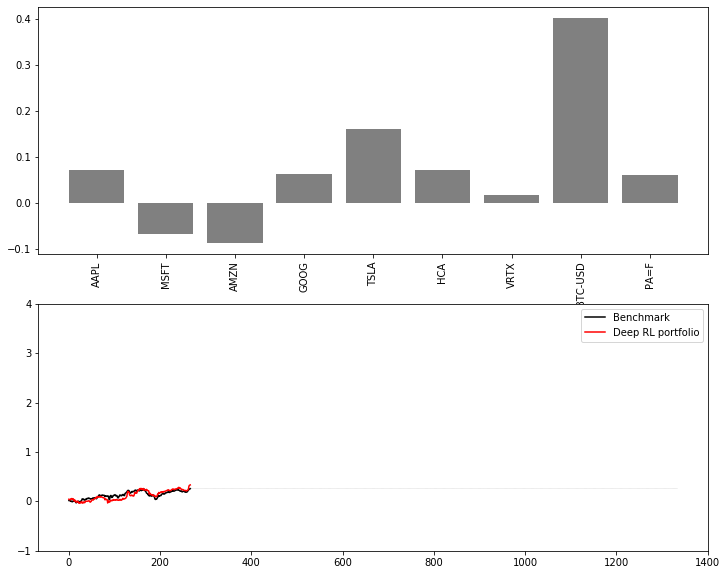

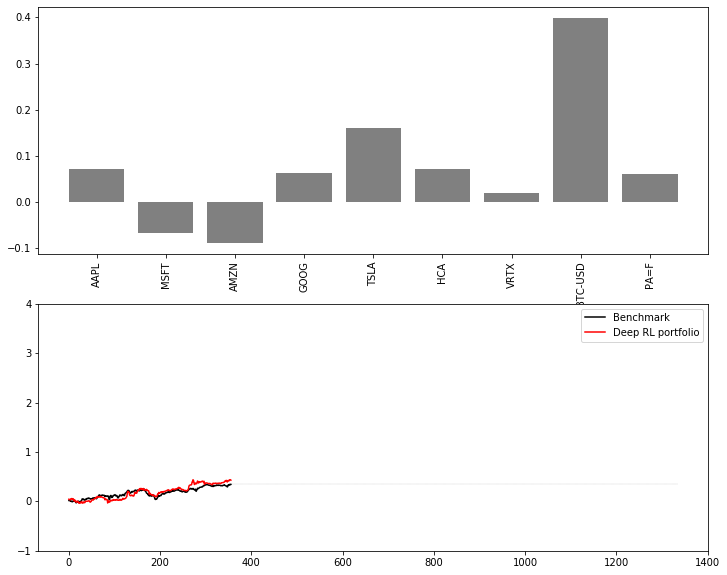

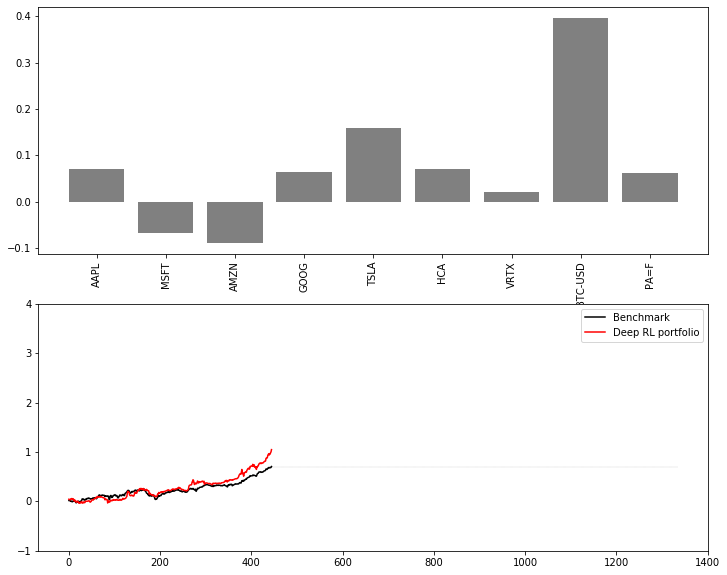

...

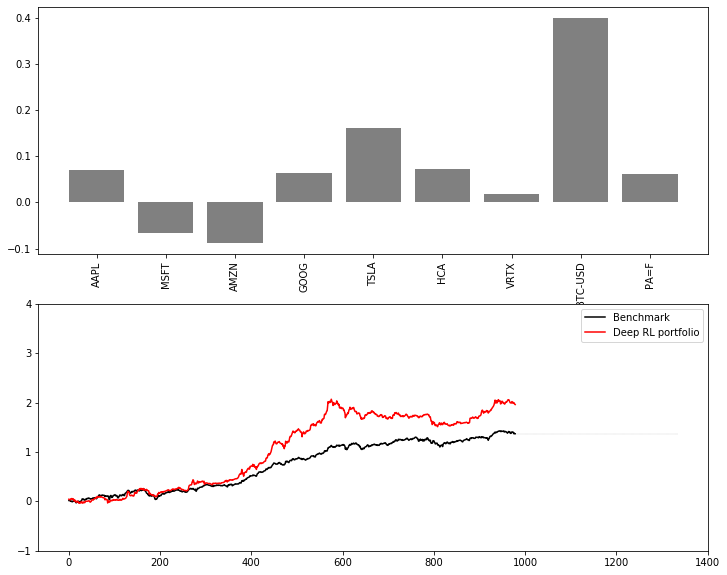

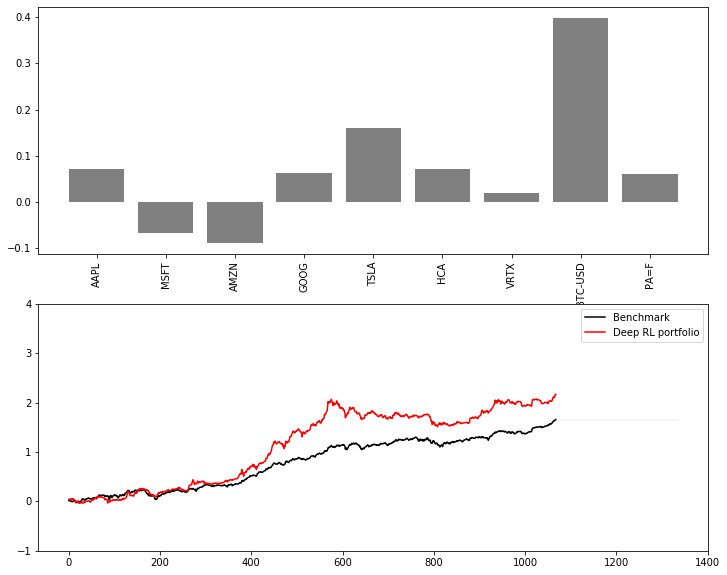

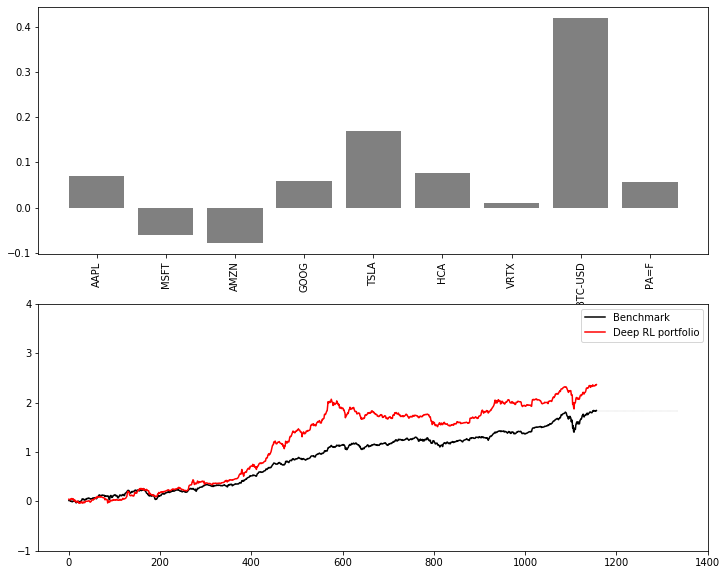

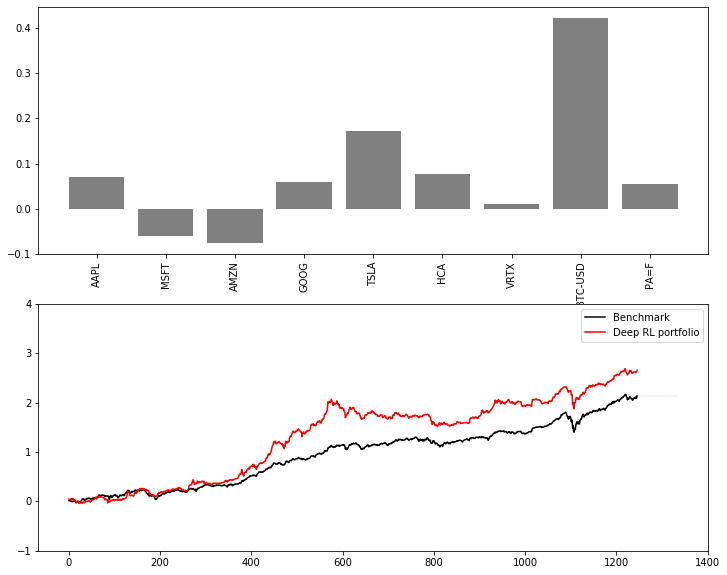

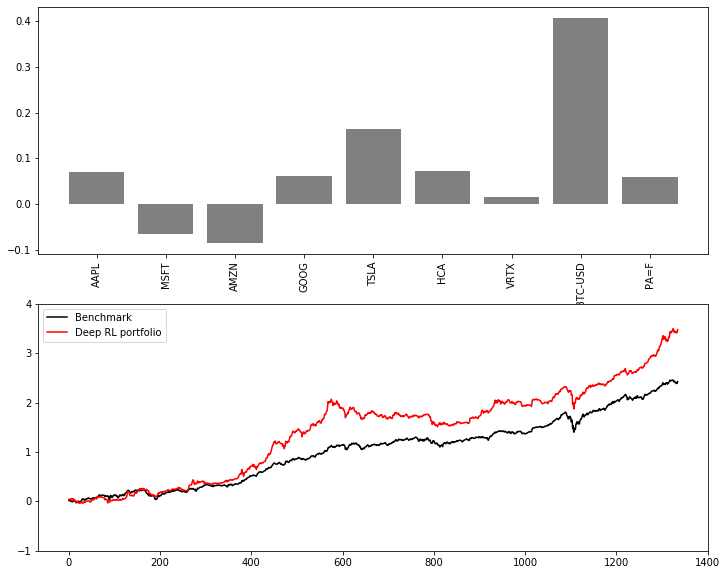

In [116]:
plot_results(result_equal, 
             result_rl, 
             actions_rl, 
             N_ASSETS,
             env.data.columns, 
             'Deep RL portfolio', './images_test1/rl/', 'series')

# Different types of portfolio

In [117]:
N_ASSETS = 9 
WINDOW_FIT = 180 # 252
WINDOW_HOLD = 90 # 252
env = Environment() 

In [118]:
agent_max_returns = MaxReturnsAgent(N_ASSETS, allow_short=True)
agent_minvar = MinVarianceAgent(N_ASSETS, allow_short=True)
agent_maxsharpe = MaxSharpeAgent(N_ASSETS, allow_short=True)
agent_maxdecorr = MaxDecorrelationAgent(N_ASSETS, allow_short=True)

In [119]:
actions_equal, actions_returns, actions_minvar, actions_maxsharpe, actions_maxdecorr = [], [], [], [], []
result_equal, result_returns, result_minvar, result_maxsharpe, result_maxdecorr = [], [], [], [], []

for i in range(WINDOW_FIT, len(env.data), WINDOW_HOLD):
    
    state = env.get_state(i, WINDOW_FIT, is_cov_matrix=False)
    
    action_equal = np.ones(N_ASSETS) / N_ASSETS
    action_minvar = agent_minvar.act(state)
    action_max_returns = agent_max_returns.act(state)
    action_maxsharpe = agent_maxsharpe.act(state)
    action_maxdecorr = agent_maxdecorr.act(state)
 
    state_action = env.get_state(i+WINDOW_HOLD, WINDOW_HOLD, is_cov_matrix=False)
    
    r = np.dot(state_action, action_equal)
    result_equal.append(r.tolist())
    actions_equal.append(action_equal)
    
    r = np.dot(state_action, action_minvar)
    result_minvar.append(r.tolist())
    actions_minvar.append(action_minvar)

    r = np.dot(state_action, action_max_returns)
    result_returns.append(r.tolist())
    actions_returns.append(action_max_returns)
    
    r = np.dot(state_action, action_maxsharpe)
    result_maxsharpe.append(r.tolist())
    actions_maxsharpe.append(action_maxsharpe)
    
    r = np.dot(state_action, action_maxdecorr)
    result_maxdecorr.append(r.tolist())
    actions_maxdecorr.append(action_maxdecorr)

In [120]:
result_equal_vis = [item for sublist in result_equal for item in sublist]
result_returns_vis = [item for sublist in result_returns for item in sublist]
result_minvar_vis = [item for sublist in result_minvar for item in sublist]
result_maxsharpe_vis = [item for sublist in result_maxsharpe for item in sublist]
result_maxdecorr_vis = [item for sublist in result_maxdecorr for item in sublist]

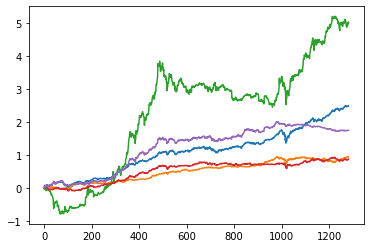

In [121]:
plt.figure()
plt.plot(np.array(result_equal_vis).cumsum())
plt.plot(np.array(result_minvar_vis).cumsum())
plt.plot(np.array(result_returns_vis).cumsum())
plt.plot(np.array(result_maxsharpe_vis).cumsum())
plt.plot(np.array(result_maxdecorr_vis).cumsum())
plt.show()

In [122]:
print('EQUAL', print_stats(result_equal_vis, result_equal_vis))
print('MINVAR', print_stats(result_minvar_vis, result_equal_vis))
print('MAXRET', print_stats(result_returns_vis, result_equal_vis))
print('MAXSHRAPE', print_stats(result_maxsharpe_vis, result_equal_vis))
print('MAXDECORR', print_stats(result_maxdecorr_vis, result_equal_vis))

EQUAL [0.0019, 0.0149, 2.0752, -0.0, 1.0]
MINVAR [0.0007, 0.0086, 1.383, 0.0002, 0.3003]
MAXRET [0.0039, 0.0481, 1.3004, 0.0008, 1.6181]
MAXSHRAPE [0.0007, 0.0089, 1.1914, 0.0, 0.3337]
MAXDECORR [0.0014, 0.0135, 1.6146, 0.0003, 0.5461]


In [123]:
current_cmap = matplotlib.cm.get_cmap()
current_cmap.set_bad(color='red')

In [124]:
def plot_results(benchmark_series, 
                 target_series, 
                 target_balances, 
                 n_assets = N_ASSETS,
                 columns = state.columns,
                 name2plot = '',
                 path2save = './',
                 base_name_series = 'series'):
    
#     N = len(np.array(benchmark_series).cumsum())
    N = len(np.array([item for sublist in benchmark_series for item in sublist]).cumsum()) 
    
    if not os.path.exists(path2save):
        os.makedirs(path2save)

    for i in range(0, len(target_balances)):

        current_range = np.arange(0, N)
        current_ts = np.zeros(N)
        current_ts2 = np.zeros(N)

        ts_benchmark = np.array([item for sublist in benchmark_series[:i+1] for item in sublist]).cumsum()
        ts_target = np.array([item for sublist in target_series[:i+1] for item in sublist]).cumsum()

        t = len(ts_benchmark)
        current_ts[:t] = ts_benchmark
        current_ts2[:t] = ts_target

        current_ts[current_ts == 0] = ts_benchmark[-1]
        current_ts2[current_ts2 == 0] = ts_target[-1]

        plt.figure(figsize = (12, 10))
        
        plt.subplot(2, 1, 1)
        plt.bar(np.arange(n_assets), target_balances[i], color = 'grey')
        plt.xticks(np.arange(n_assets), columns, rotation='vertical')

        plt.subplot(2, 1, 2)
        plt.colormaps = current_cmap
        plt.plot(current_range[:t], current_ts[:t], color = 'black', label = 'Benchmark')
        plt.plot(current_range[:t], current_ts2[:t], color = 'red', label = name2plot)
        plt.plot(current_range[t:], current_ts[t:], ls = '--', lw = .1, color = 'black')
        plt.autoscale(False)
        plt.ylim([-3, 4])
        plt.legend()
        plt.savefig(path2save + base_name_series + str(i) + '.jpg')

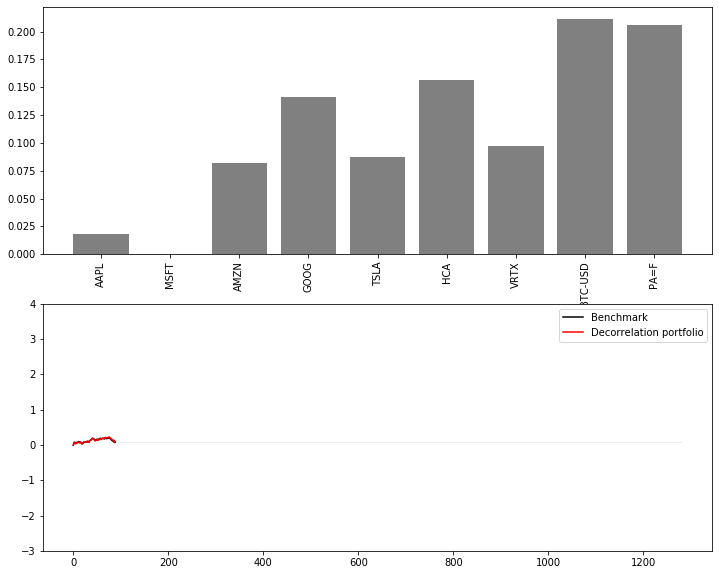

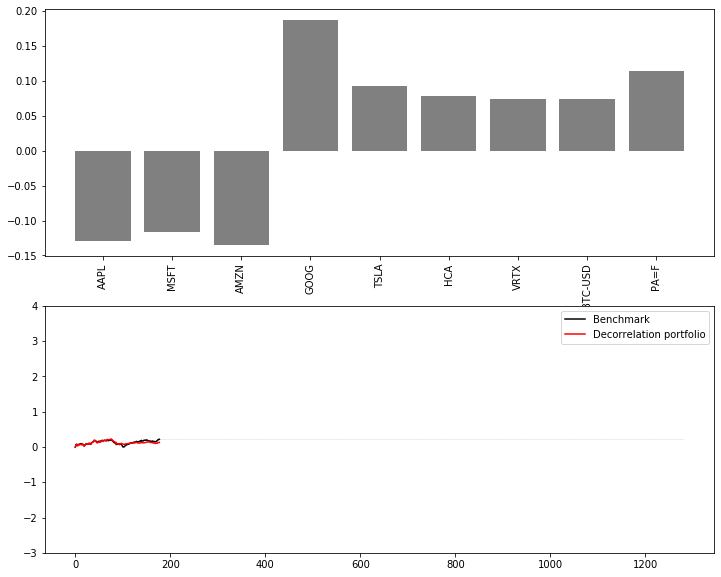

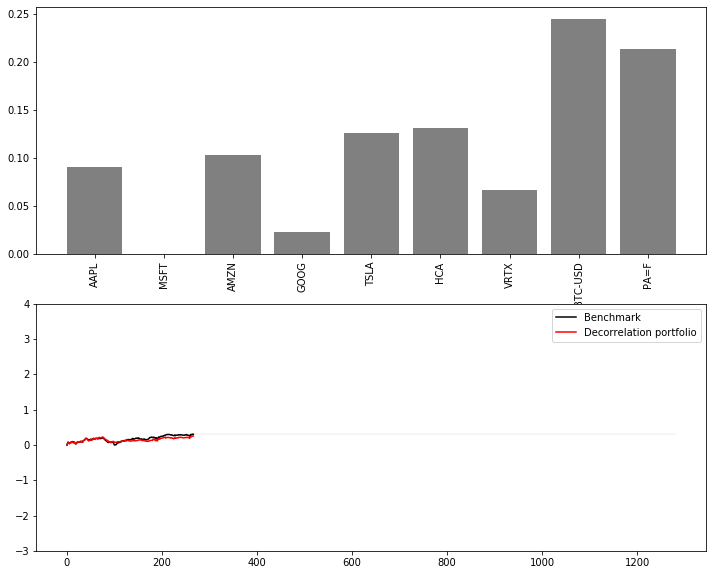

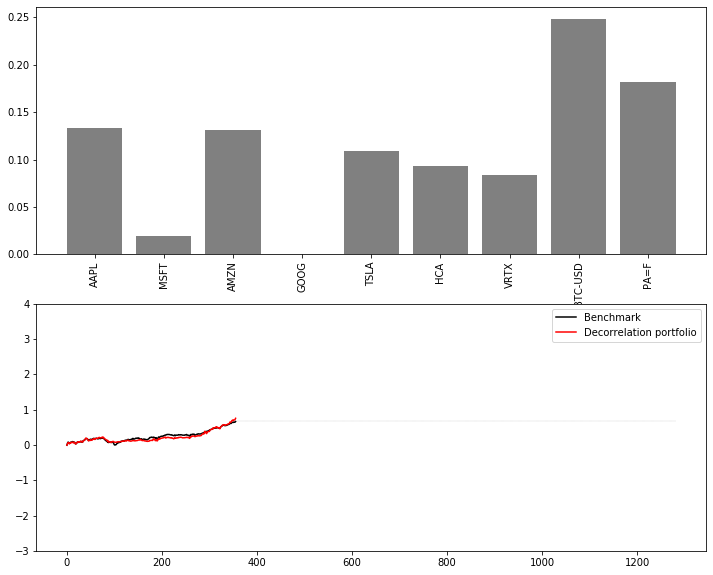

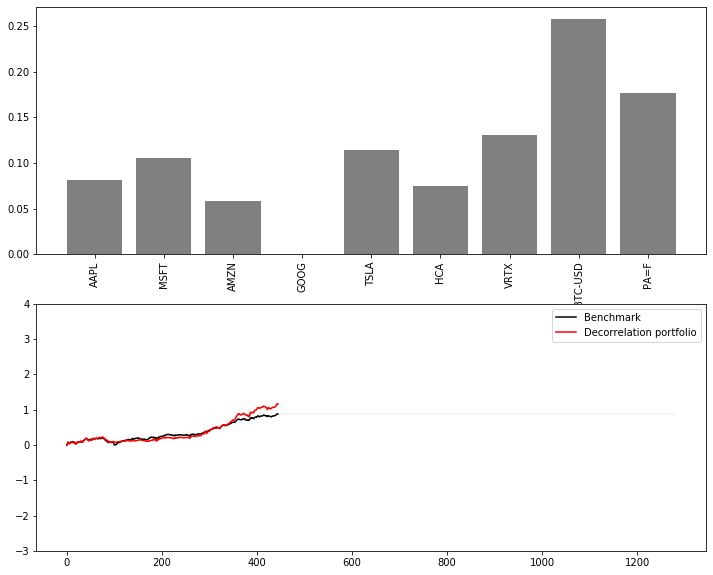

...

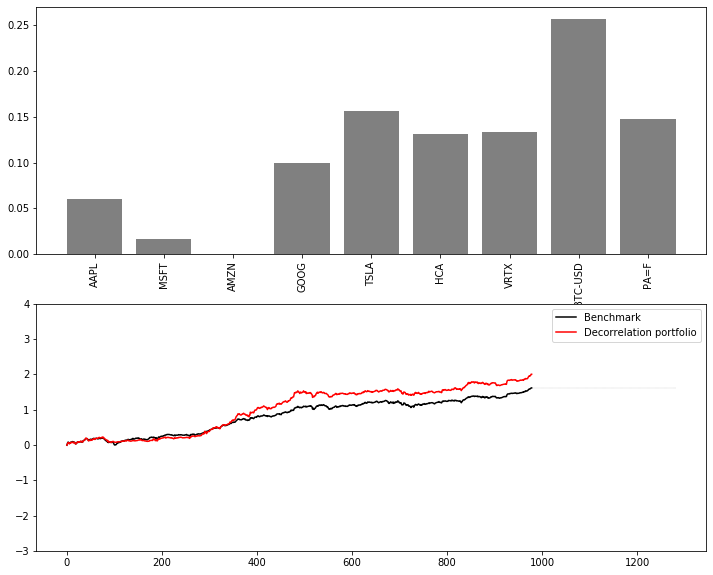

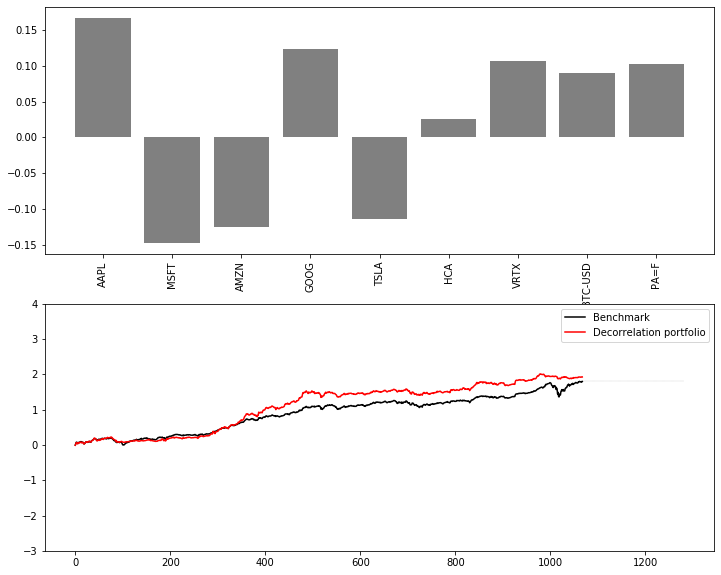

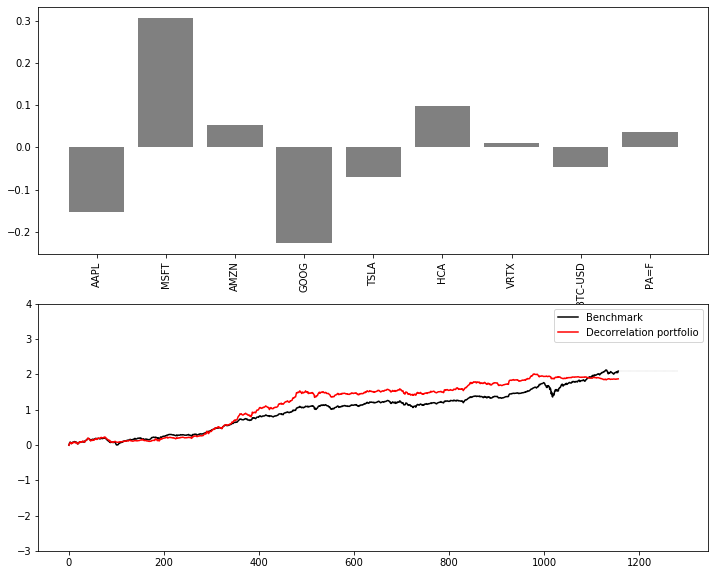

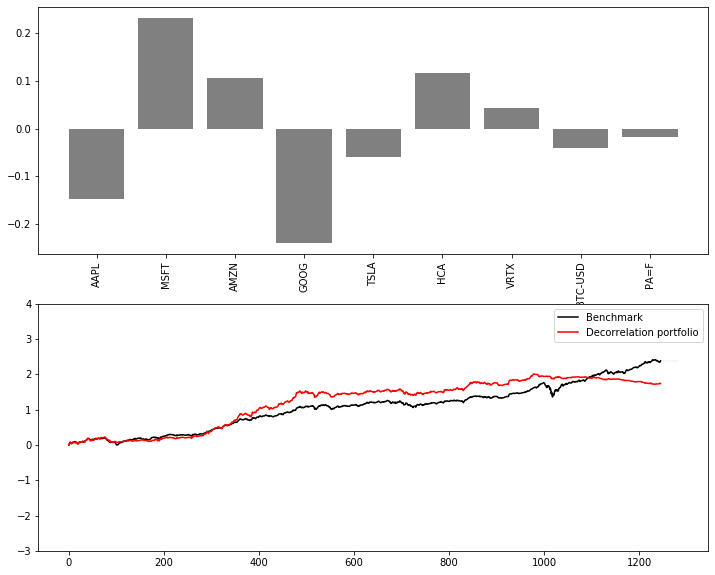

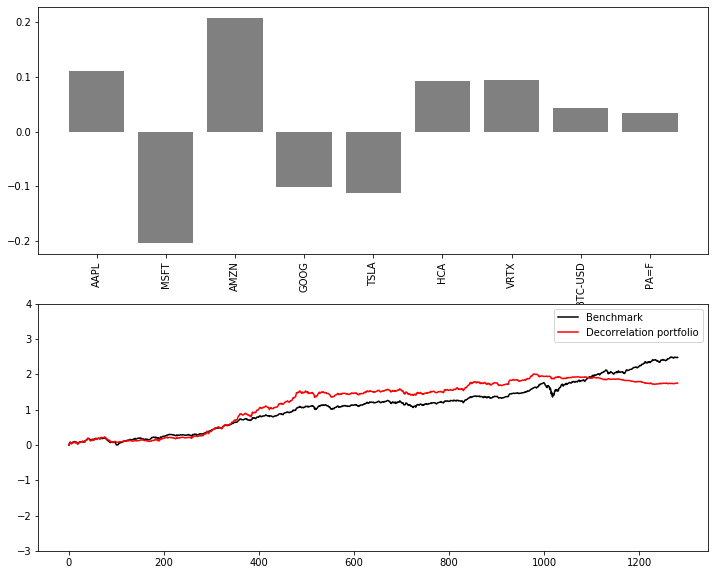

In [125]:
plot_results(result_equal, 
             result_maxdecorr, 
             actions_maxdecorr, 
             N_ASSETS,
             state.columns.tolist(), 
             'Decorrelation portfolio', './images/decorr/', 'series')

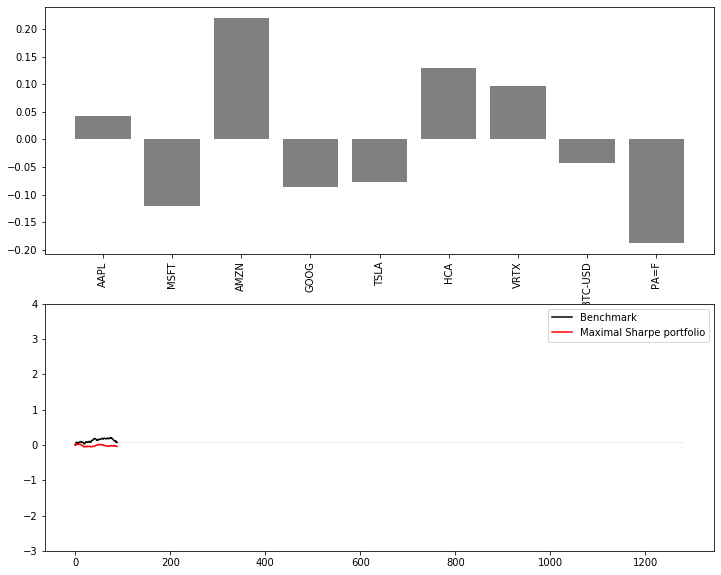

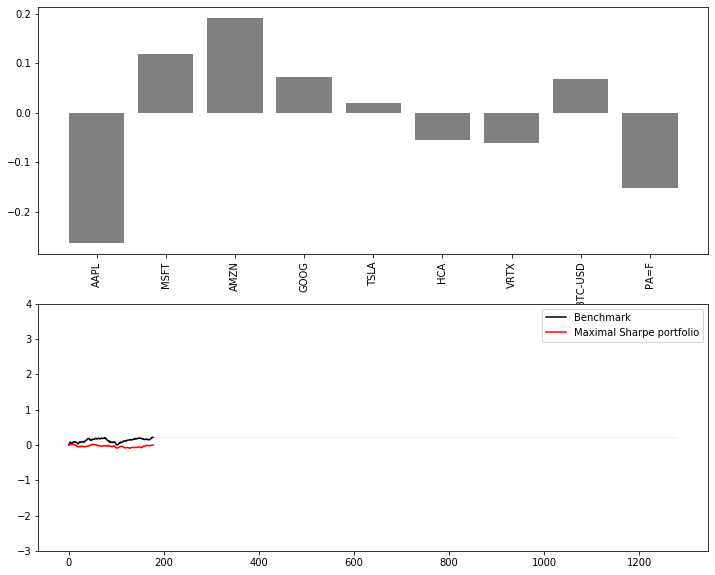

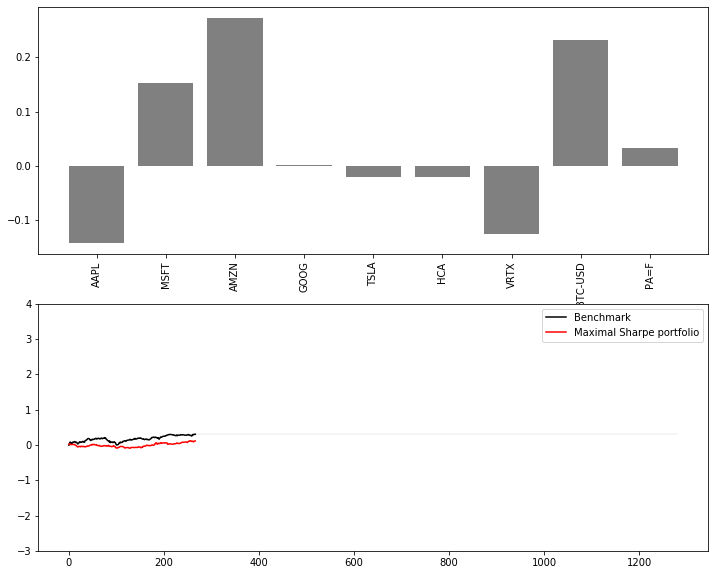

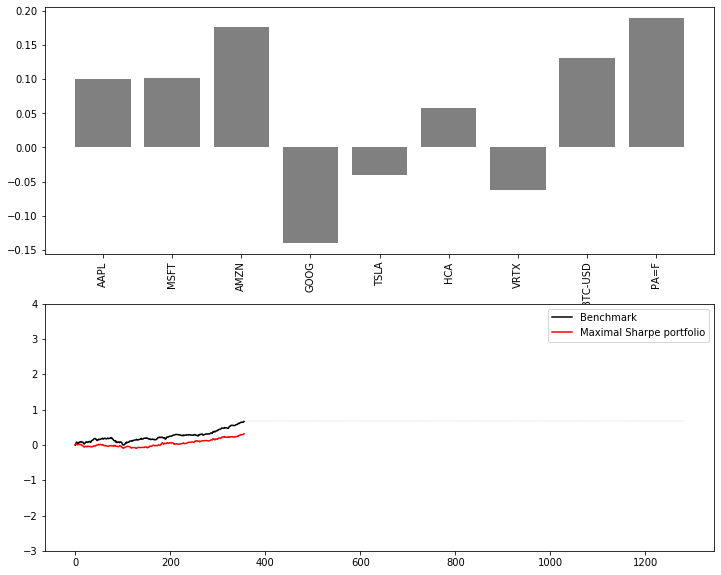

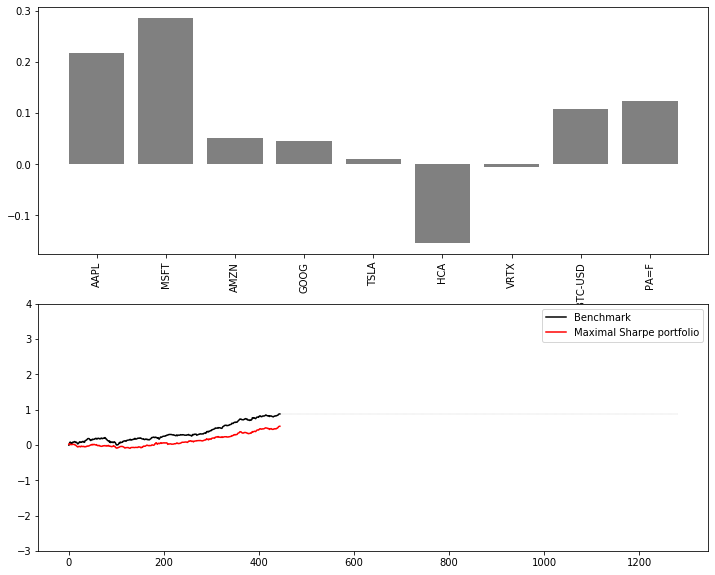

...

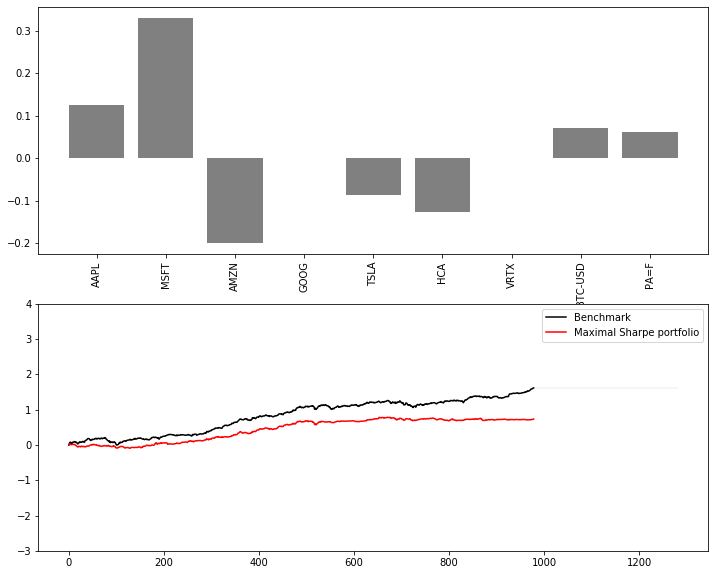

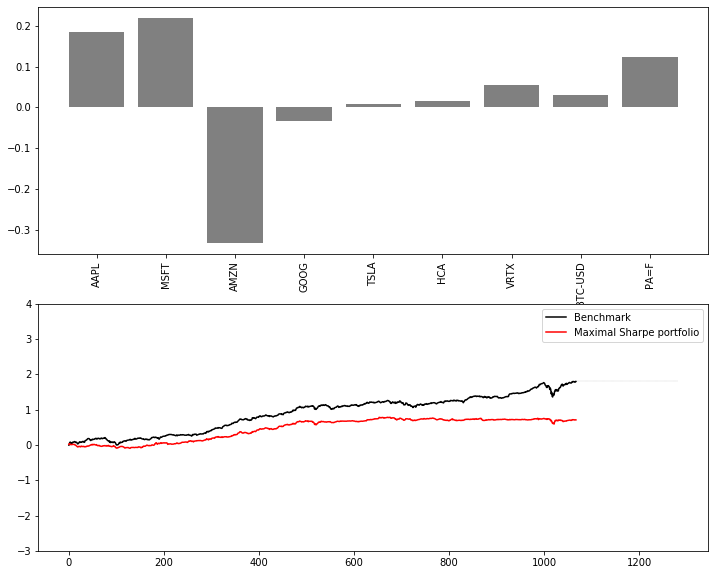

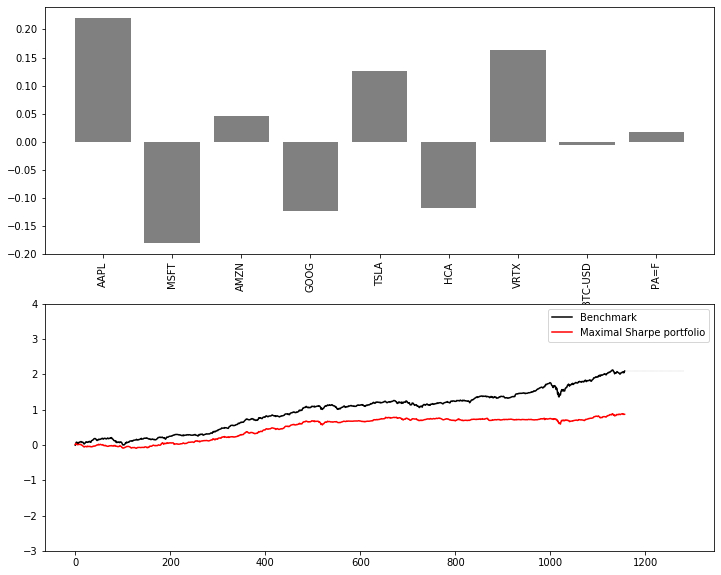

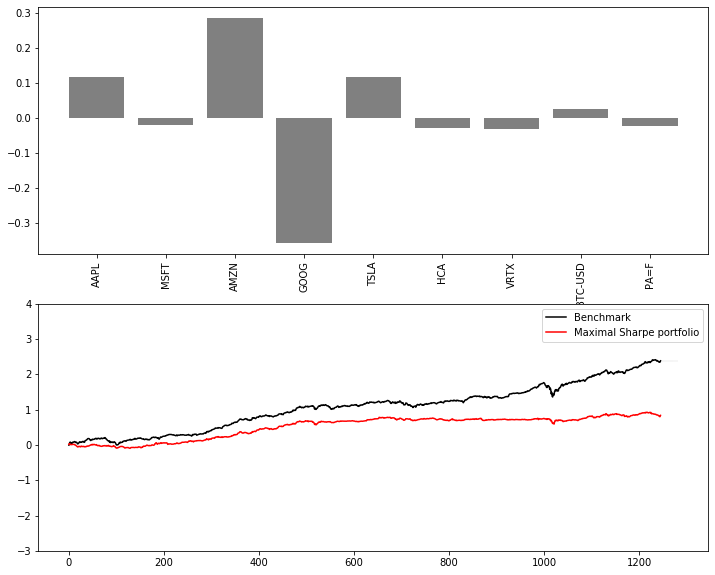

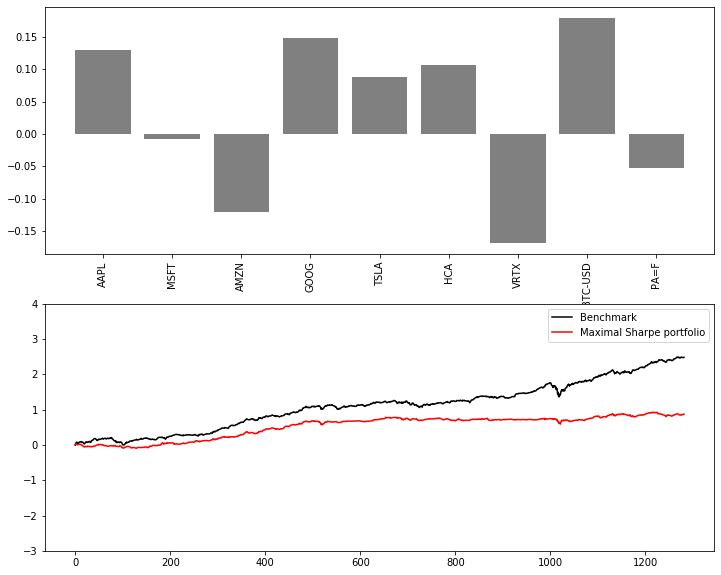

In [126]:
plot_results(result_equal, 
             result_maxsharpe, 
             actions_maxsharpe,  
             N_ASSETS,
             state.columns.tolist(), 
             'Maximal Sharpe portfolio', './images/sharpe/', 'series')

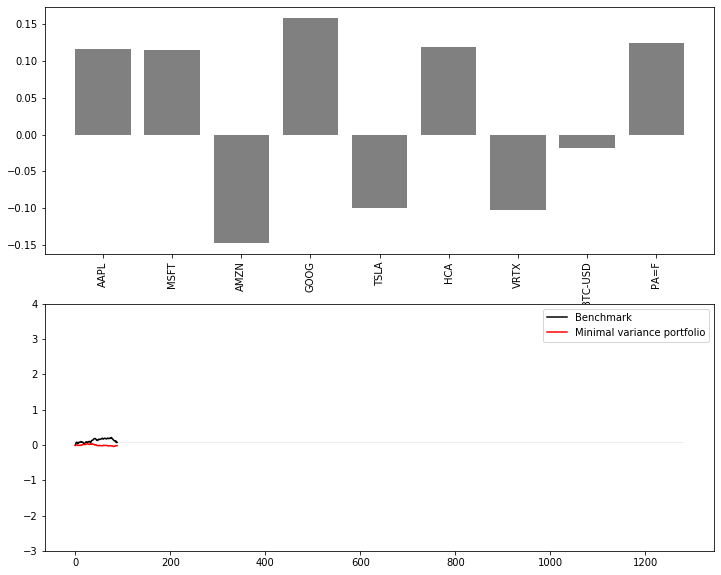

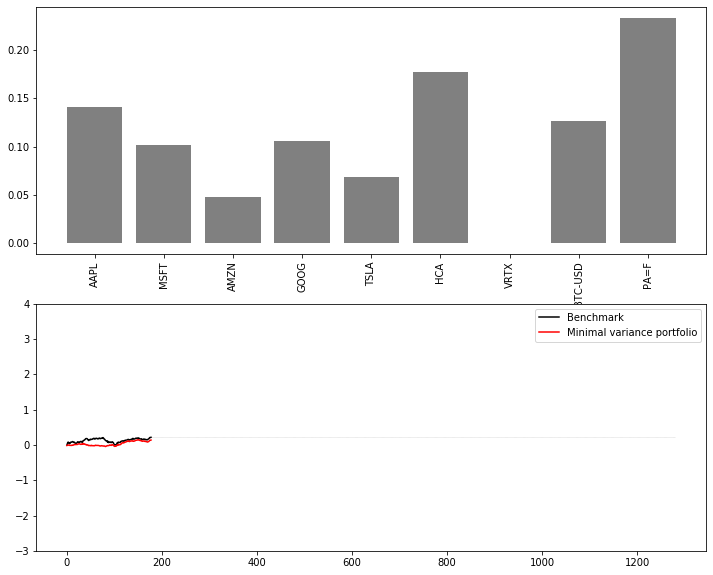

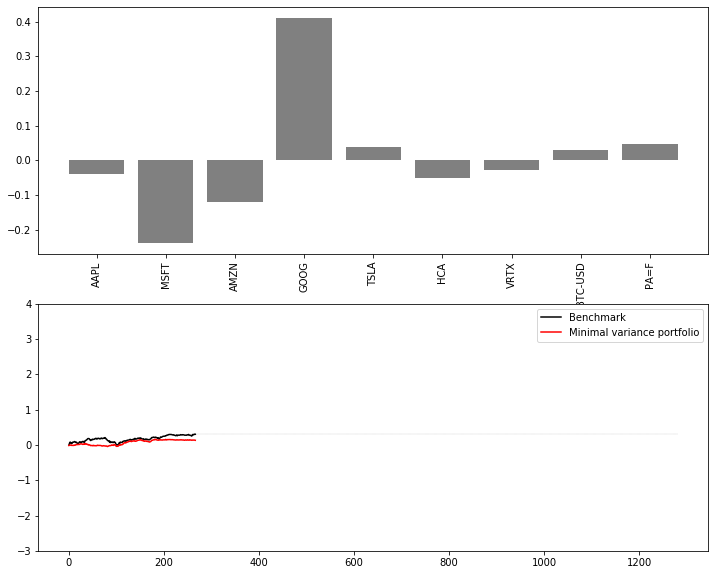

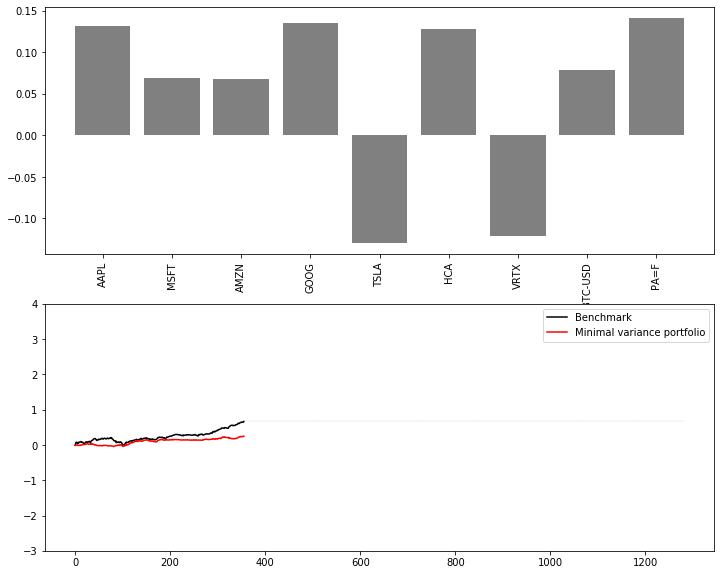

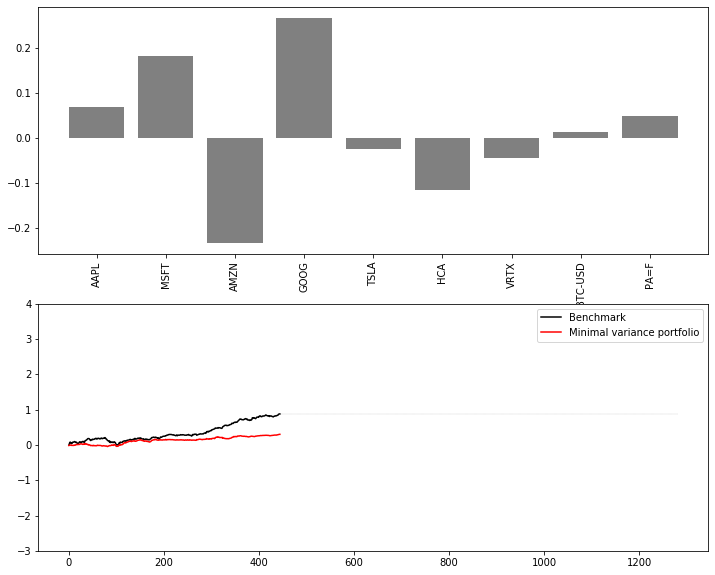

...

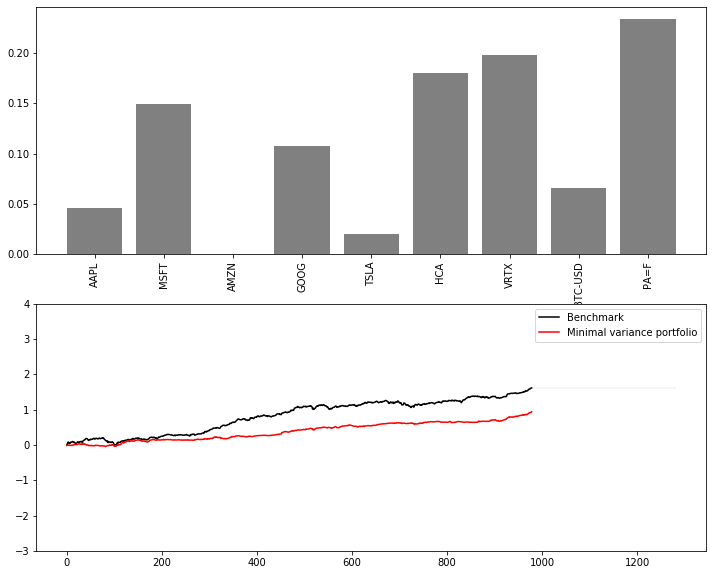

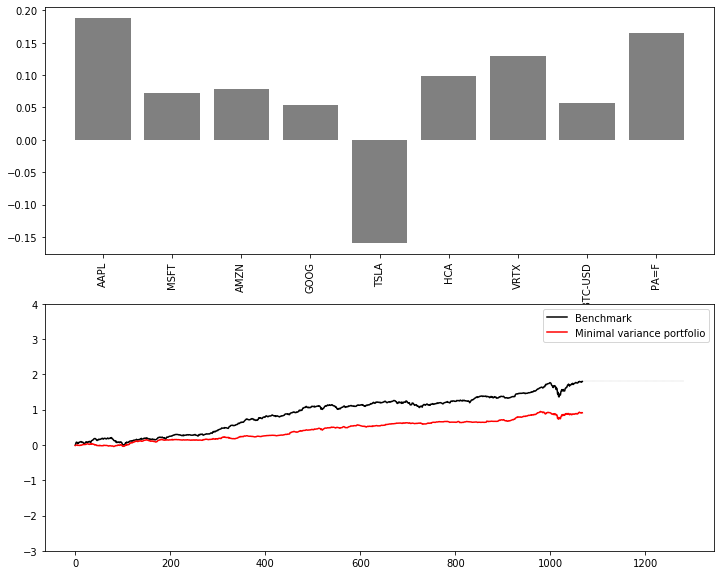

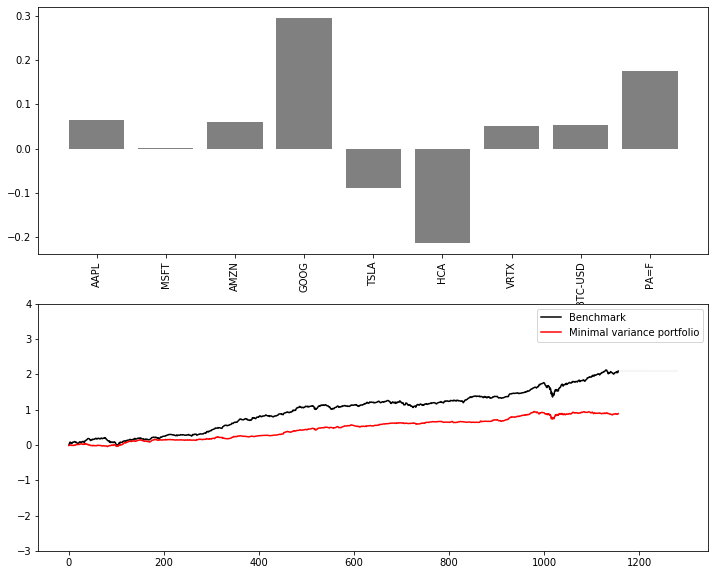

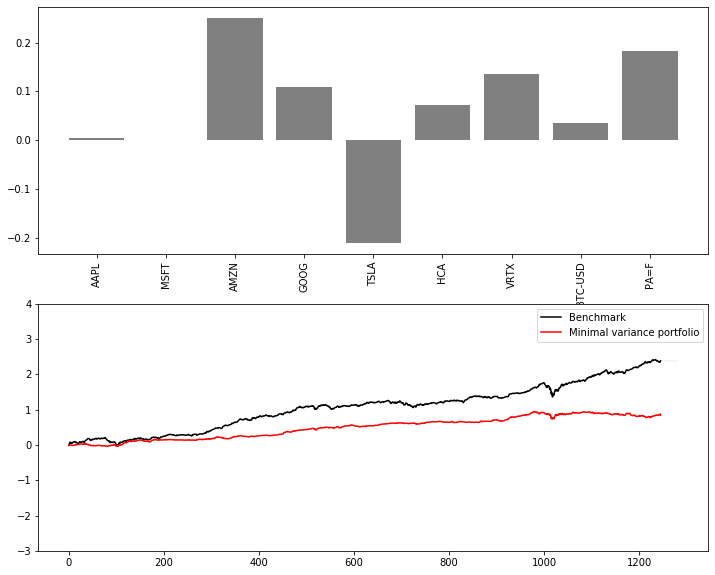

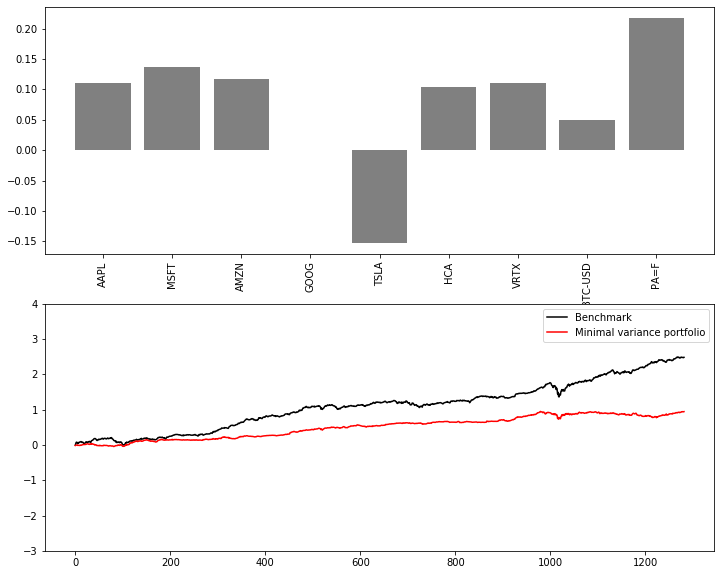

In [127]:
plot_results(result_equal, 
             result_minvar, 
             actions_minvar,  
             N_ASSETS,
             state.columns.tolist(), 
             'Minimal variance portfolio', './images/minvar/', 'series')

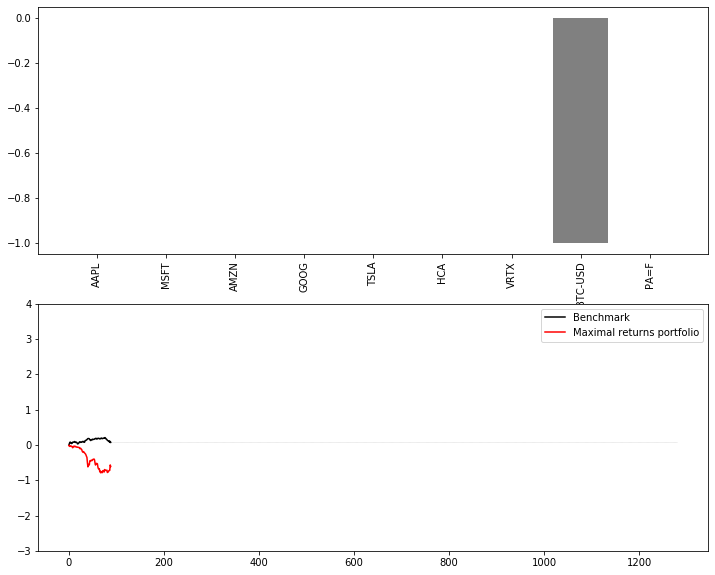

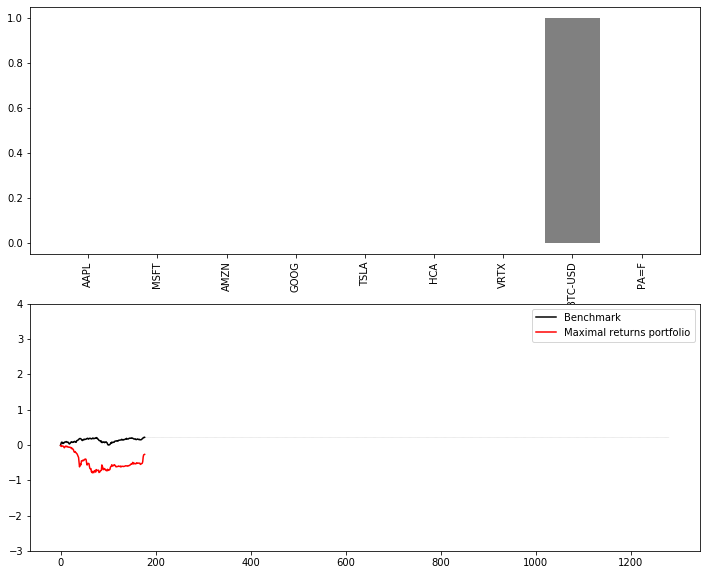

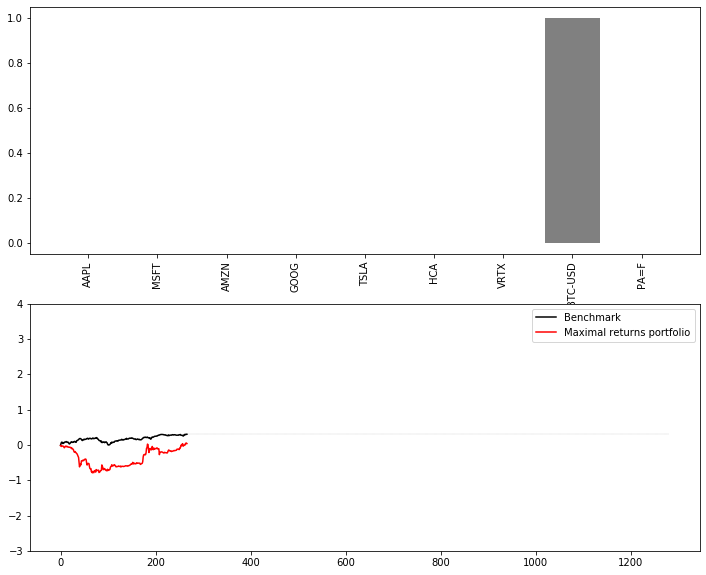

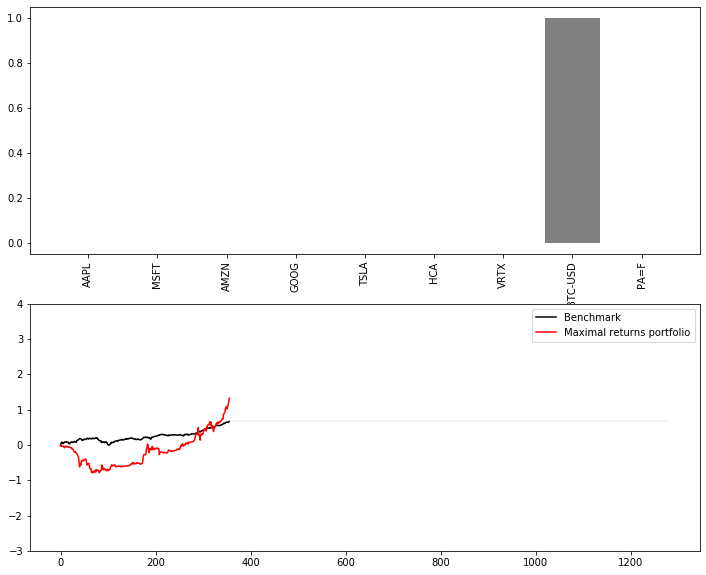

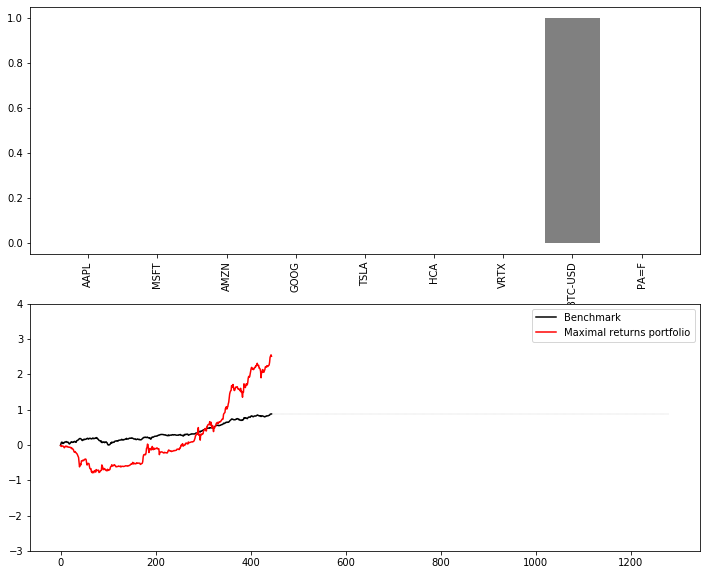

...

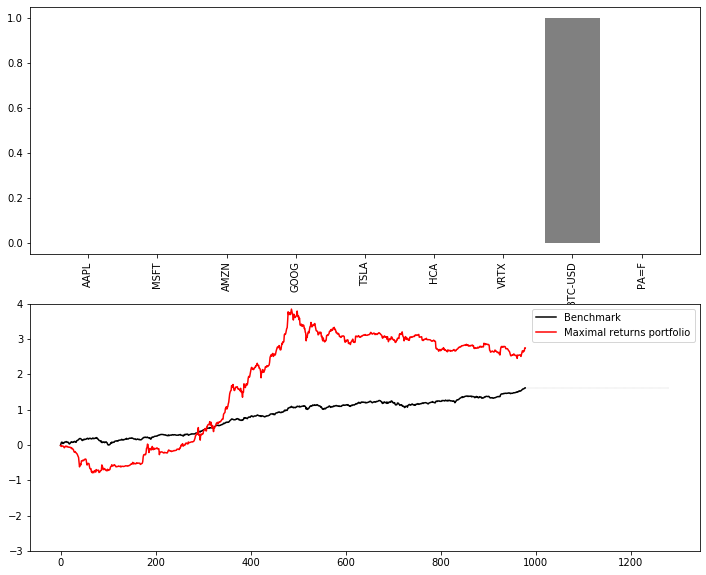

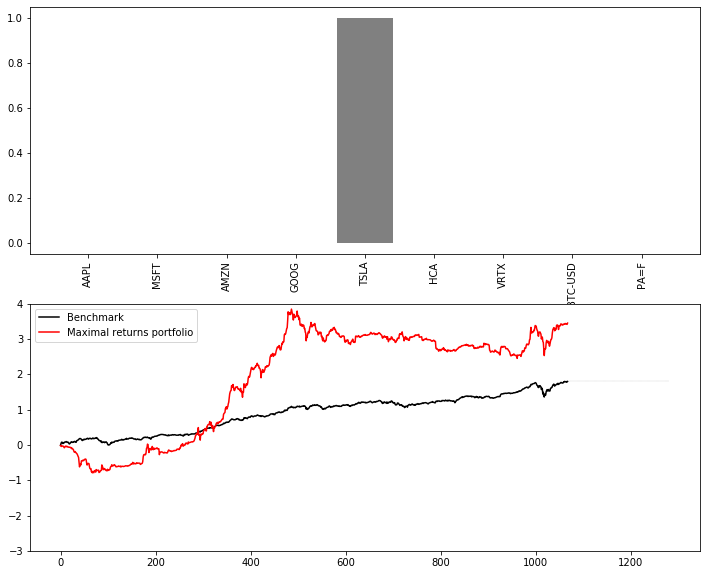

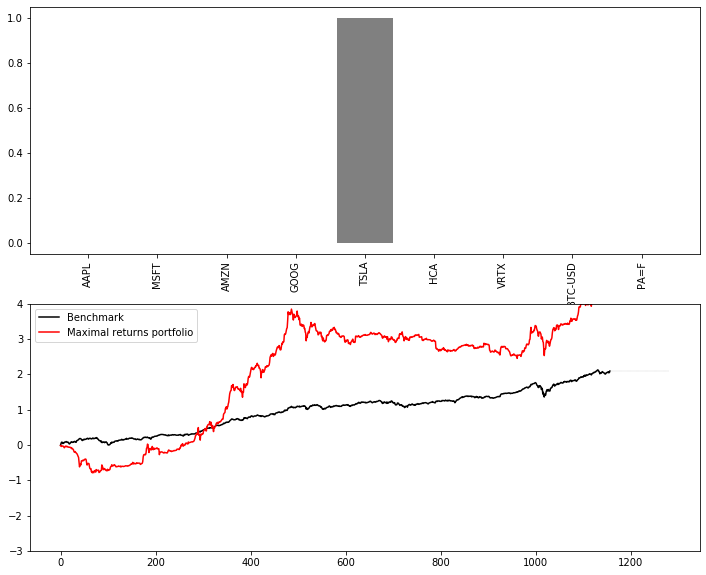

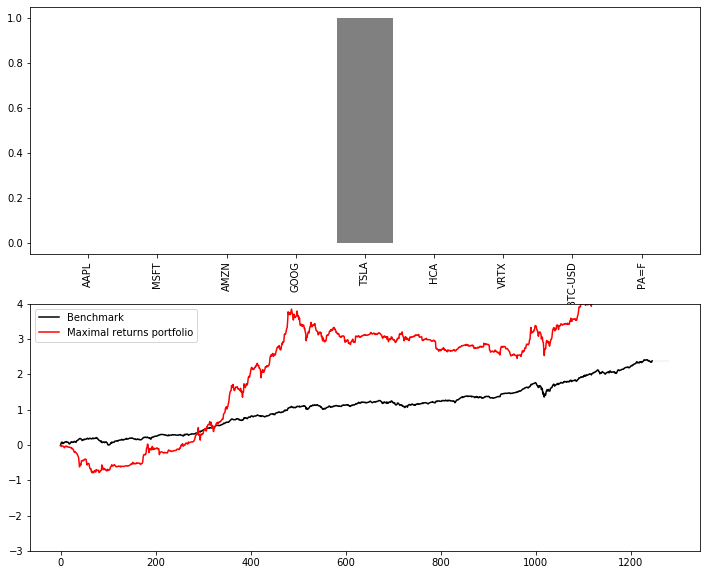

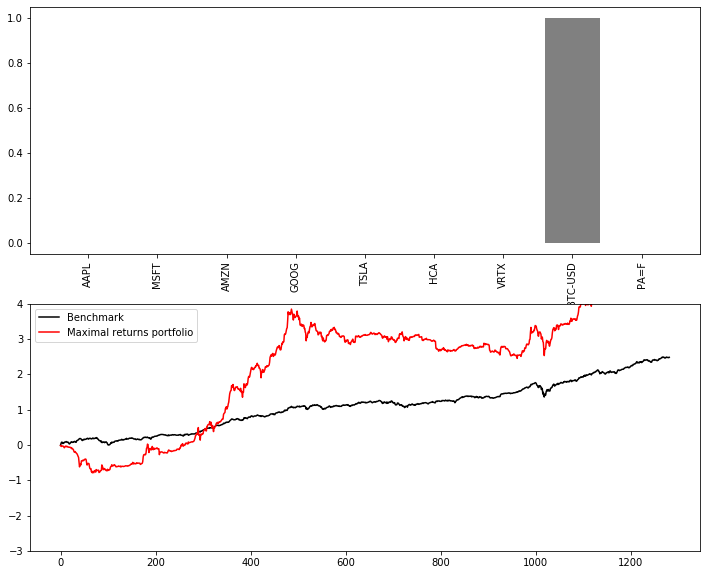

In [128]:
plot_results(result_equal, 
             result_returns, 
             actions_returns,  
             N_ASSETS,
             state.columns.tolist(), 
             'Maximal returns portfolio', './images/maxret/', 'series')

In [129]:
agent_pca = PCAAgent(N_ASSETS, allow_short=True, pc_id=0)

In [130]:
actions_equal, actions_pca = [], []
result_equal, result_pca = [], []

for i in range(WINDOW_FIT, len(env.data), WINDOW_HOLD):
    
    state = env.get_state(i, WINDOW_FIT, is_cov_matrix=False)
    
    action_equal = np.ones(N_ASSETS) / N_ASSETS
    action_pca = agent_pca.act(state)
 
    state_action = env.get_state(i+WINDOW_HOLD, WINDOW_HOLD, is_cov_matrix=False)
    
    r = np.dot(state_action, action_equal)
    result_equal.append(r.tolist())
    actions_equal.append(action_equal)
    
    r = np.dot(state_action, action_pca)
    result_pca.append(r.tolist())
    actions_pca.append(action_pca)

In [131]:
result_equal_vis = [item for sublist in result_equal for item in sublist]
result_pca_vis = [item for sublist in result_pca for item in sublist]

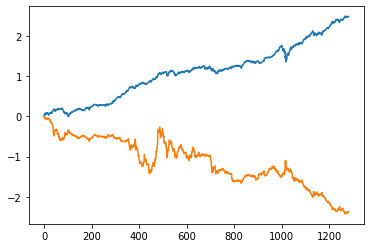

In [132]:
plt.figure()
plt.plot(np.array(result_equal_vis).cumsum())
plt.plot(np.array(result_pca_vis).cumsum())
plt.show()


In [133]:
print('EQUAL', print_stats(result_equal_vis, result_equal_vis))
print('PCA', print_stats(result_pca_vis, result_equal_vis))

EQUAL [0.0019, 0.0149, 2.0752, -0.0, 1.0]
PCA [-0.0019, 0.0314, -0.9322, -0.0013, -0.2714]


In [134]:
current_cmap = matplotlib.cm.get_cmap()

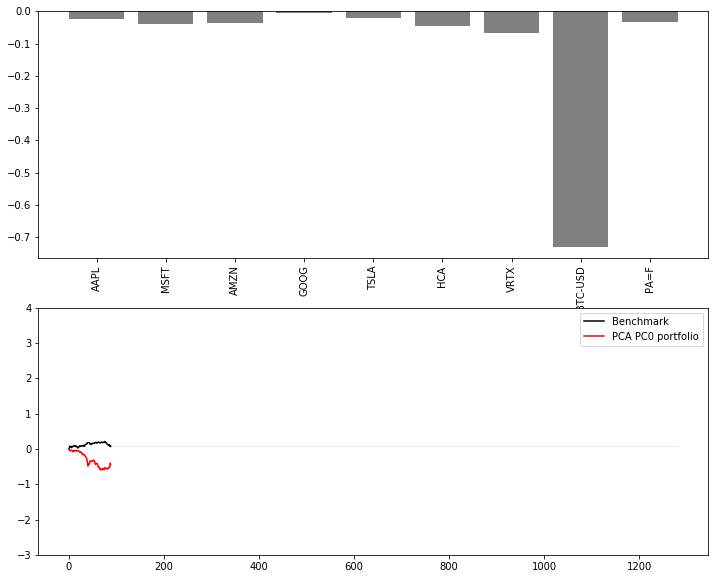

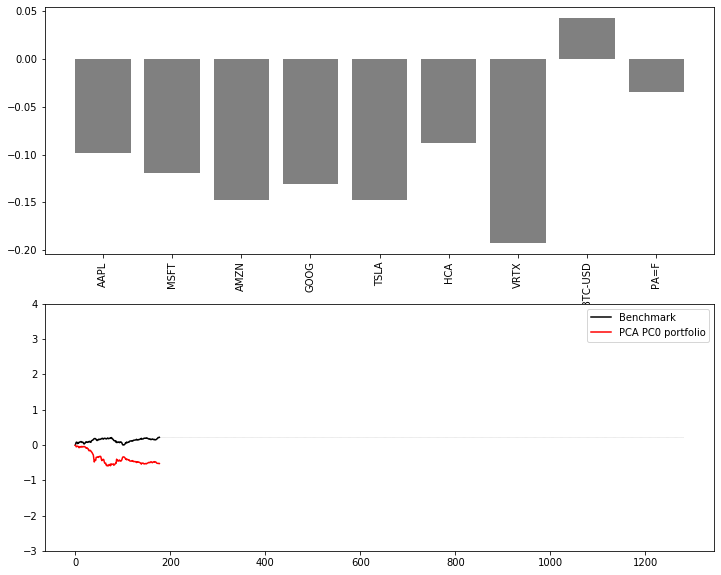

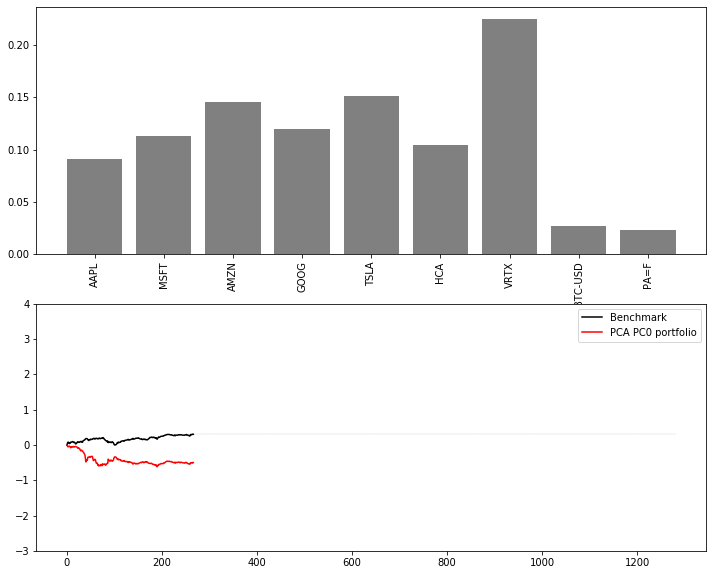

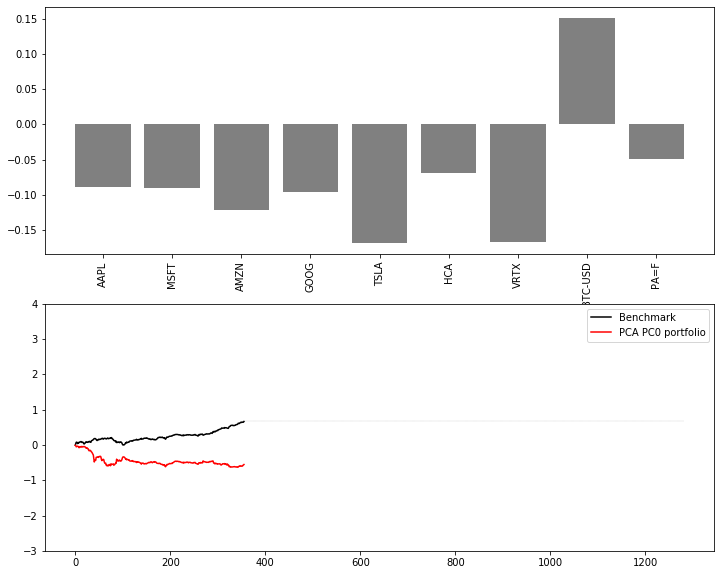

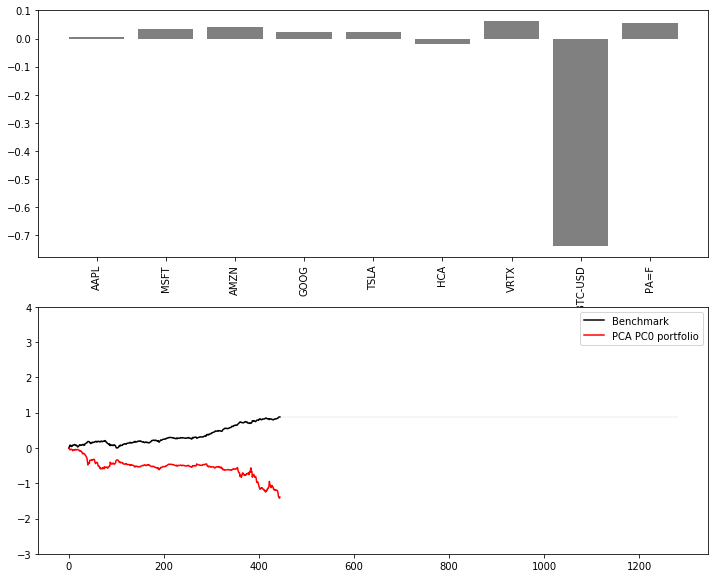

...

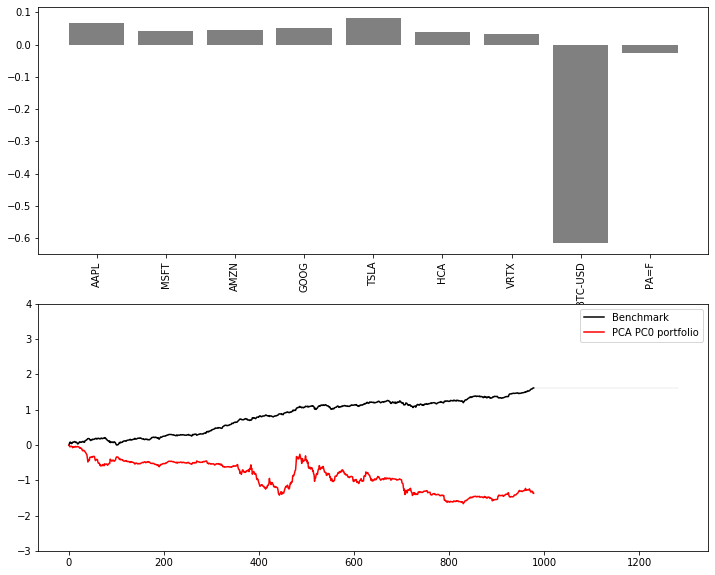

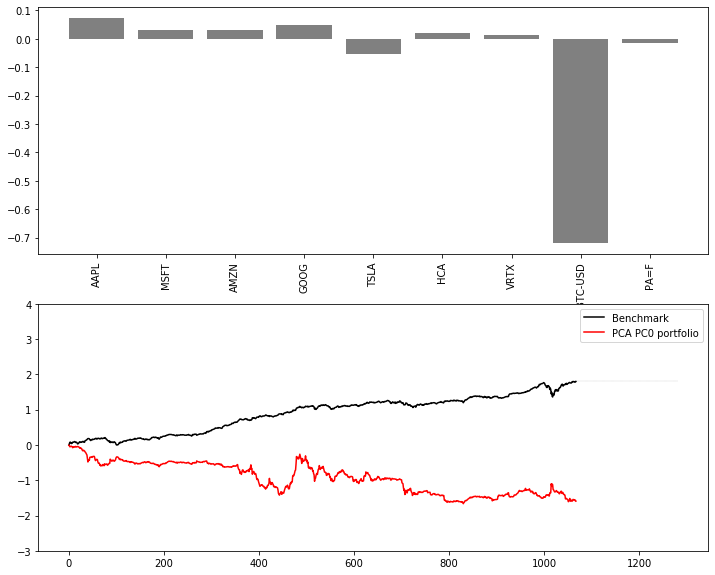

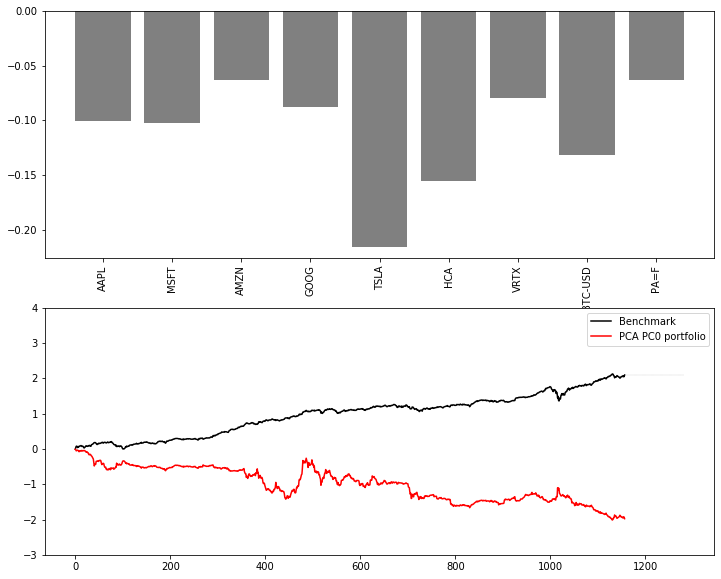

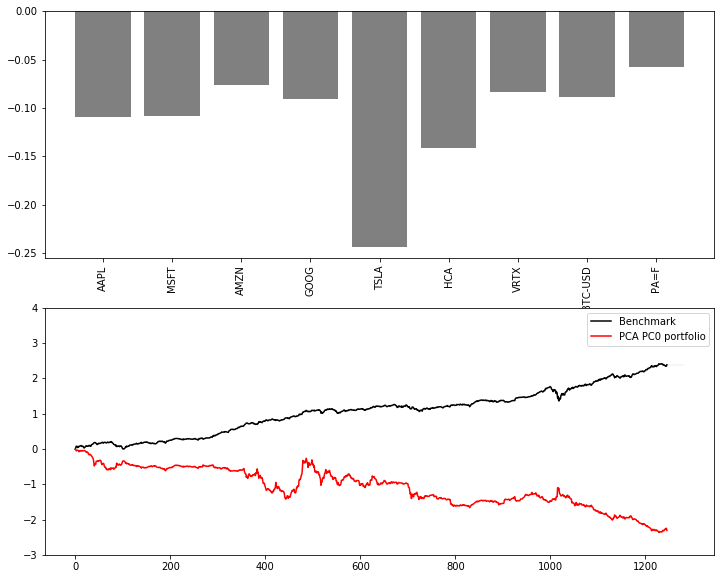

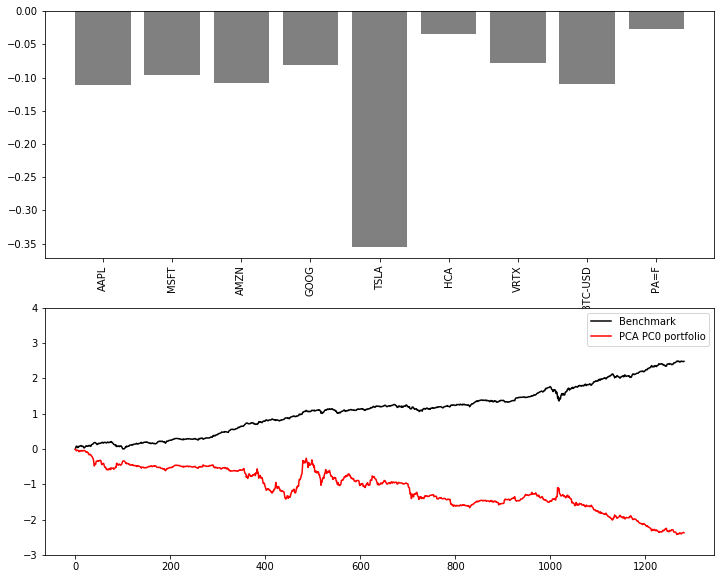

In [135]:
plot_results(result_equal, 
             result_pca, 
             actions_pca, 
             N_ASSETS,
             state.columns, 
             'PCA PC0 portfolio', './images/pca/', 'series')

In [136]:
agent_hrp = HRPAgent(N_ASSETS, allow_short=True)

In [137]:
actions_equal, actions_hrp = [], []
result_equal, result_hrp = [], []

for i in range(WINDOW_FIT, len(env.data), WINDOW_HOLD):
    
    state = env.get_state(i, WINDOW_FIT, is_cov_matrix=False)
    
    action_equal = np.ones(N_ASSETS) / N_ASSETS
    action_hrp = agent_hrp.act(state)

    state_action = env.get_state(i+WINDOW_HOLD, WINDOW_HOLD, is_cov_matrix=False)
    
    r = np.dot(state_action, action_equal)
    result_equal.append(r.tolist())
    actions_equal.append(action_equal)
    
    r = np.dot(state_action, action_hrp)
    result_hrp.append(r.tolist())
    actions_hrp.append(action_hrp)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:61: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:61: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:61: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:61: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:61: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciou

In [138]:
result_equal_vis = [item for sublist in result_equal for item in sublist]
result_hrp_vis = [item for sublist in result_hrp for item in sublist]

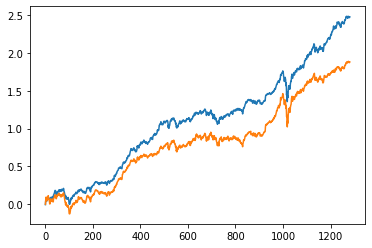

In [139]:
plt.figure()
plt.plot(np.array(result_equal_vis).cumsum())
plt.plot(np.array(result_hrp_vis).cumsum())
plt.show()

In [140]:
print('EQUAL', print_stats(result_equal_vis, result_equal_vis))
print('HRP', print_stats(result_hrp_vis, result_equal_vis))

EQUAL [0.0019, 0.0149, 2.0752, -0.0, 1.0]
HRP [0.0015, 0.0157, 1.4907, -0.0004, 0.9878]


In [141]:
current_cmap = matplotlib.cm.get_cmap()

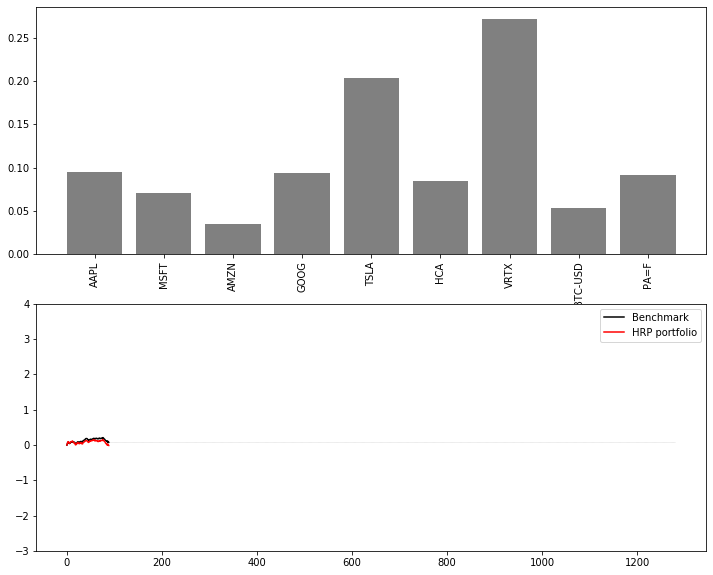

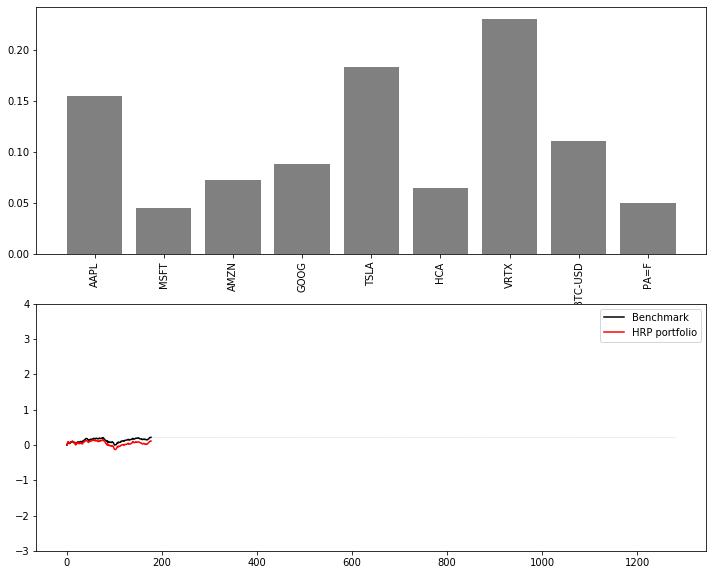

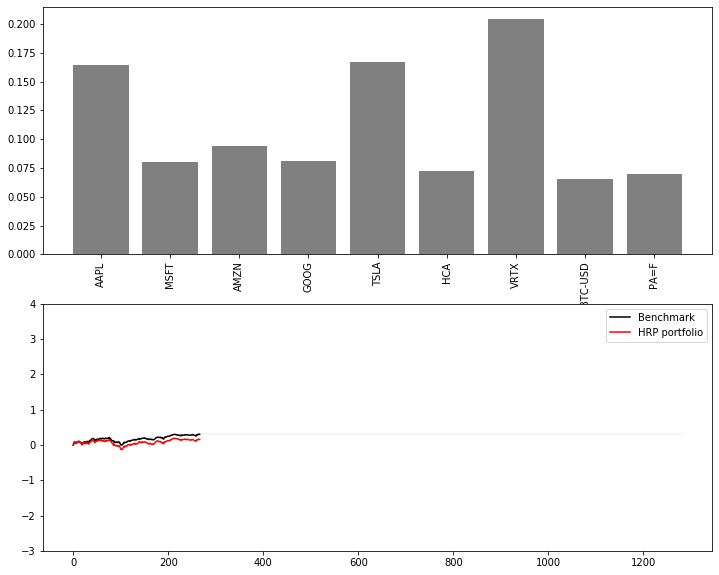

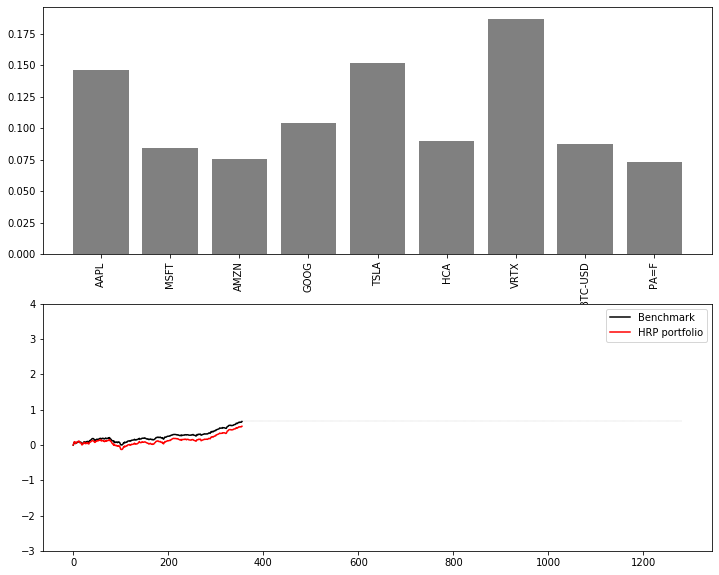

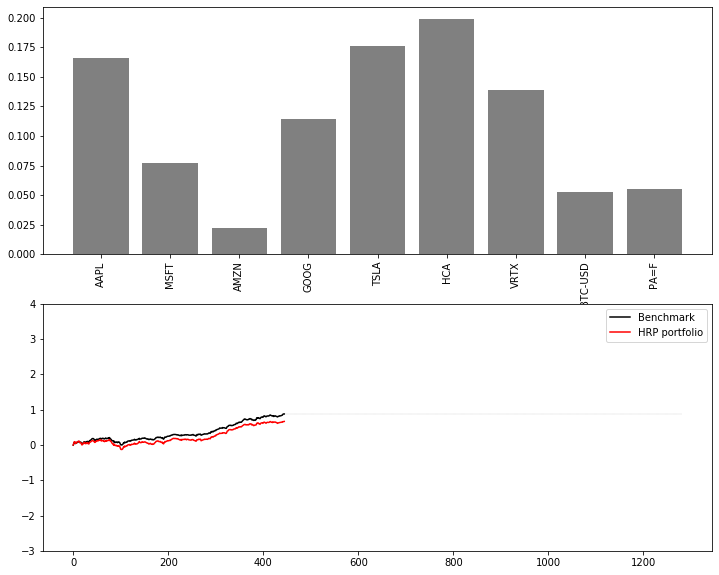

...

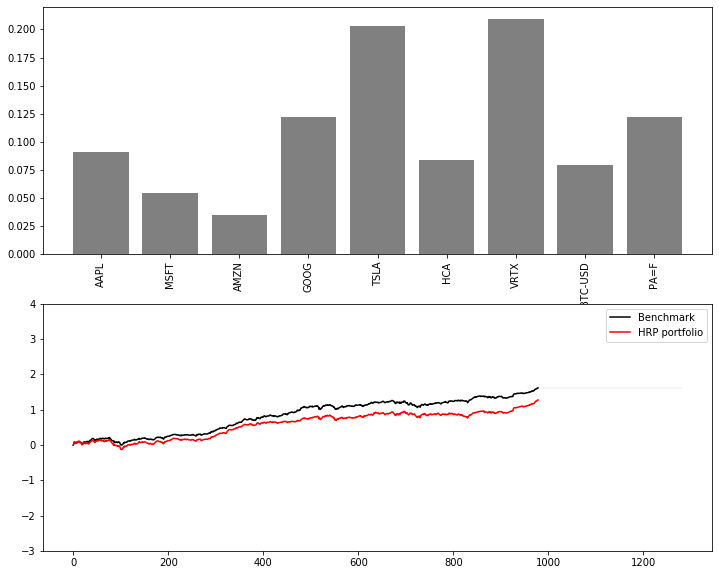

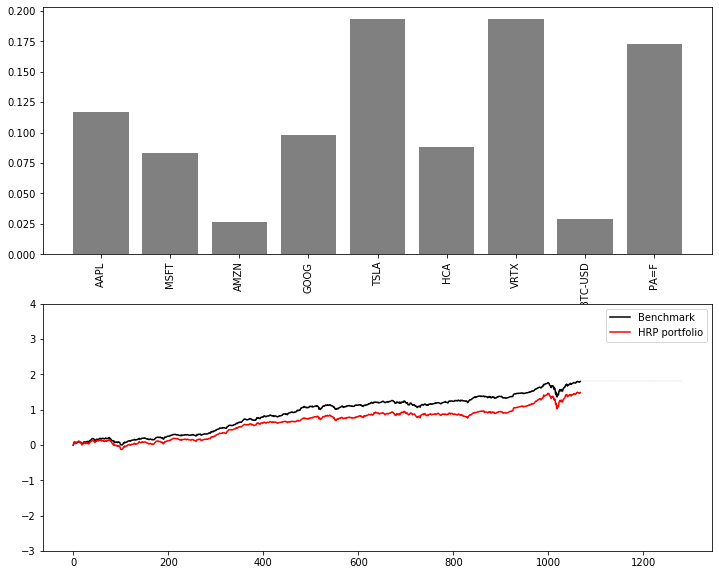

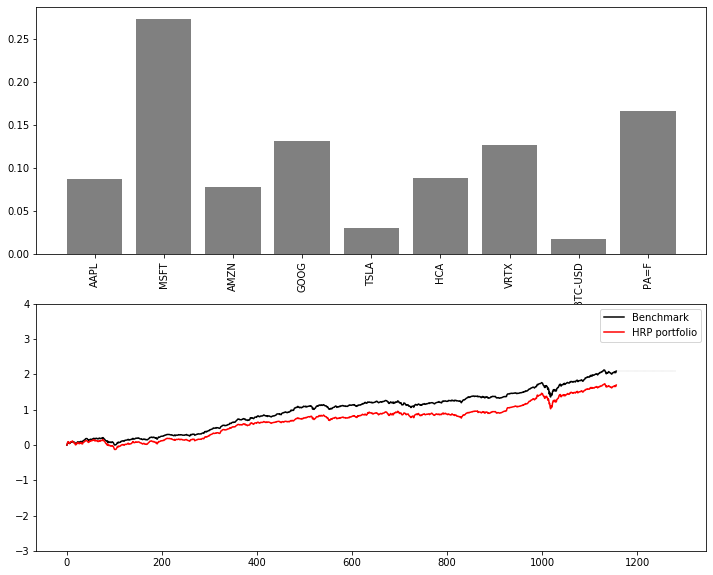

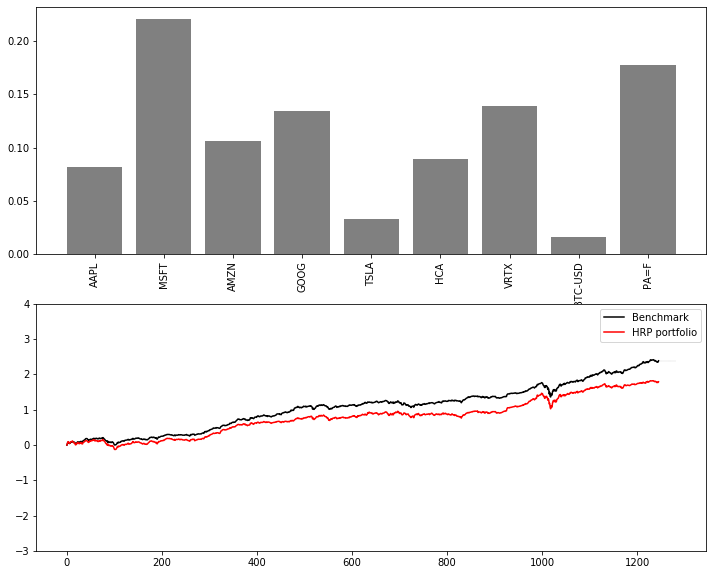

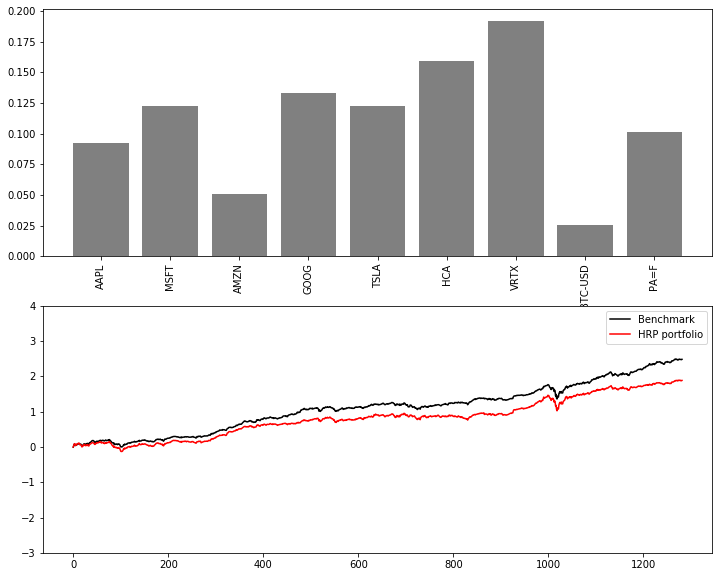

In [142]:
plot_results(result_equal, 
             result_hrp, 
             actions_hrp, 
             N_ASSETS,
             state.columns, 
             'HRP portfolio', './images/hrp/', 'series')

In [143]:
agent_smooth = SmoothingAgent(N_ASSETS, allow_short=True, forecast_horizon = WINDOW_HOLD)

In [144]:
actions_equal, actions_smooth = [], []
result_equal, result_smooth = [], []

for i in range(WINDOW_FIT, len(env.data), WINDOW_HOLD):
    
    state = env.get_state(i, WINDOW_FIT, is_cov_matrix=False, is_raw_time_series=True)
    
    action_equal = np.ones(N_ASSETS) / N_ASSETS
    action_smooth = agent_smooth.act(state)

    state_action = env.get_state(i+WINDOW_HOLD, WINDOW_HOLD, is_cov_matrix=False)
    
    r = np.dot(state_action, action_equal)
    result_equal.append(r.tolist())
    actions_equal.append(action_equal)
    
    r = np.dot(state_action, action_smooth)
    result_smooth.append(r.tolist())
    actions_smooth.append(action_smooth)

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:576: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:576: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)
/opt/anacond

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:576: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:576: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)
/opt/anacond

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:576: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:576: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)
/opt/anacond

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:576: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:576: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/opt/anacond

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:576: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:576: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/opt/anacond

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:576: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:576: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/opt/anacond

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:576: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:576: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/opt/anacond

In [145]:
result_equal_vis = [item for sublist in result_equal for item in sublist]
result_smooth_vis = [item for sublist in result_smooth for item in sublist]

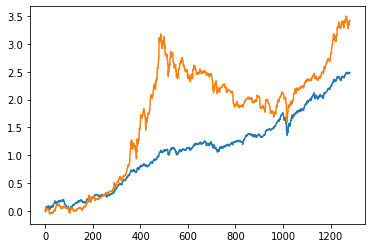

In [146]:
plt.figure()
plt.plot(np.array(result_equal_vis).cumsum())
plt.plot(np.array(result_smooth_vis).cumsum())
plt.show()

In [147]:
print('EQUAL', print_stats(result_equal_vis, result_equal_vis))
print('SMOOTHING', print_stats(result_smooth_vis, result_equal_vis))

EQUAL [0.0019, 0.0149, 2.0752, -0.0, 1.0]
SMOOTHING [0.0027, 0.0354, 1.1868, 0.0003, 1.2043]


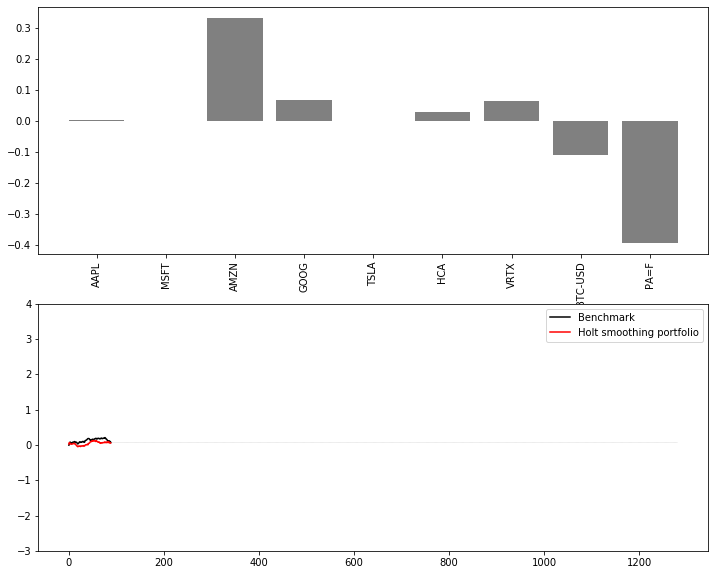

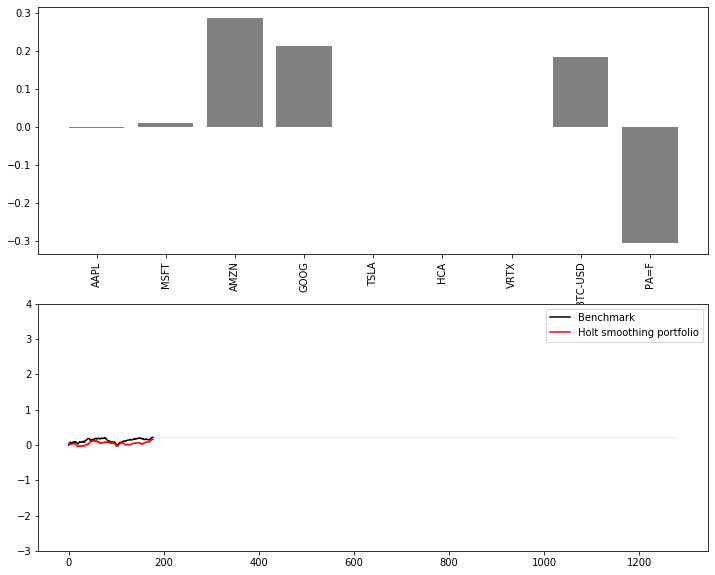

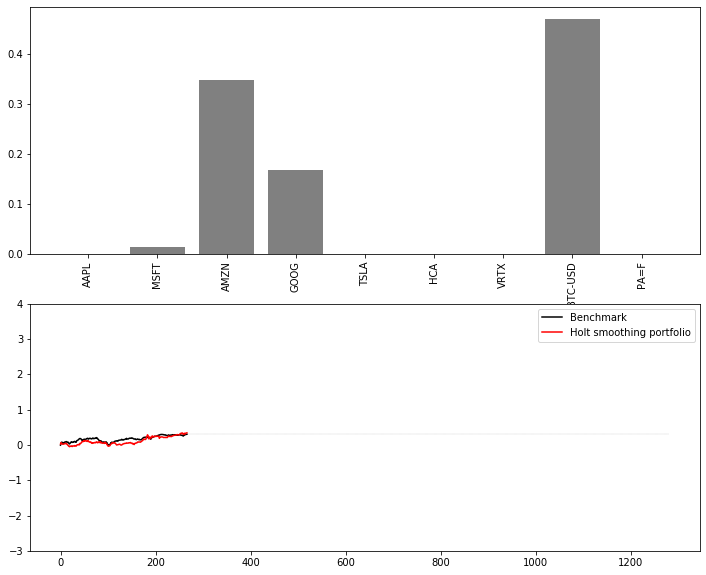

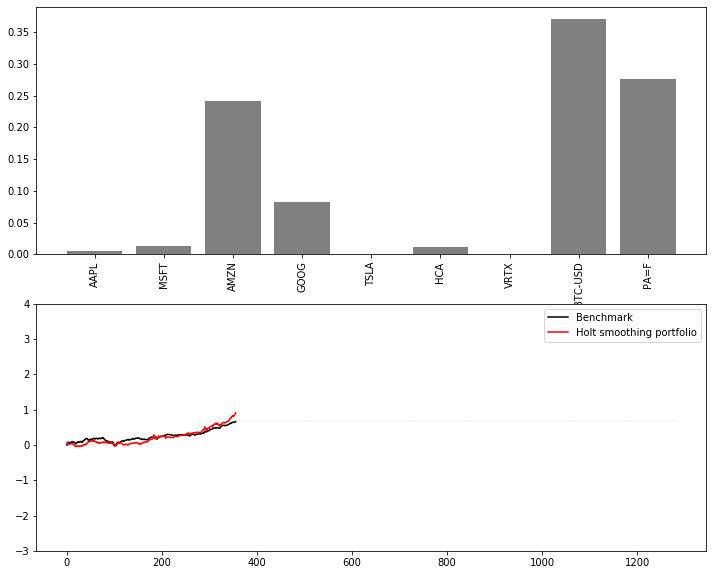

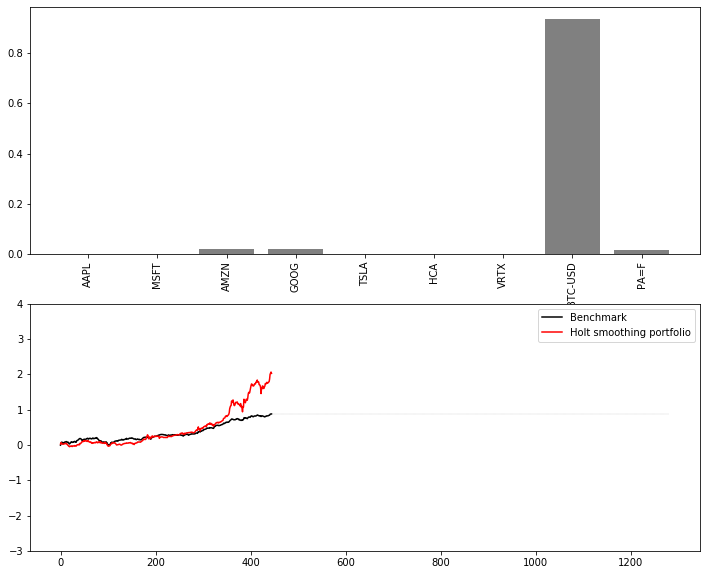

...

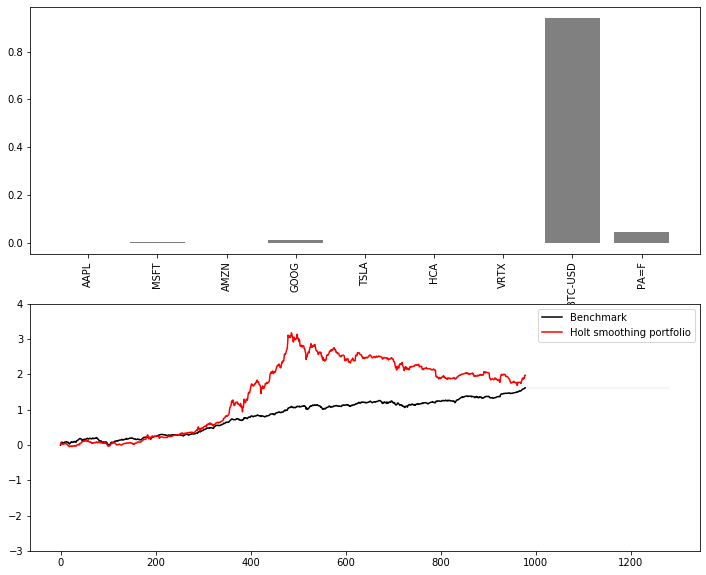

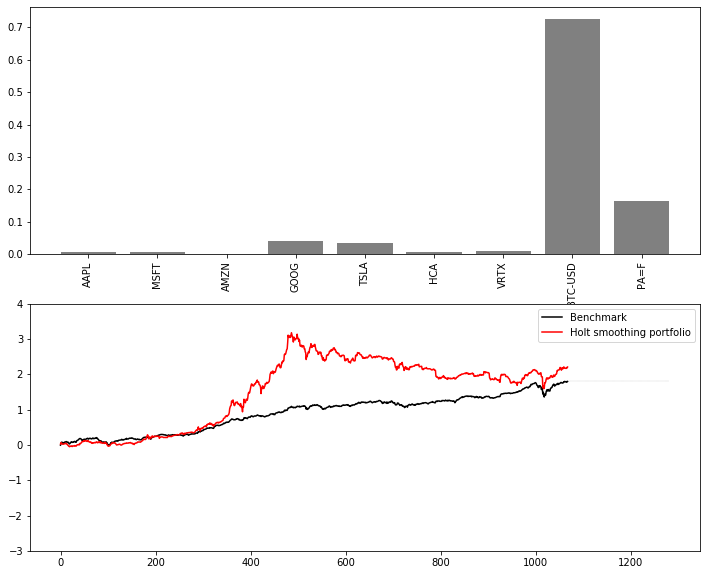

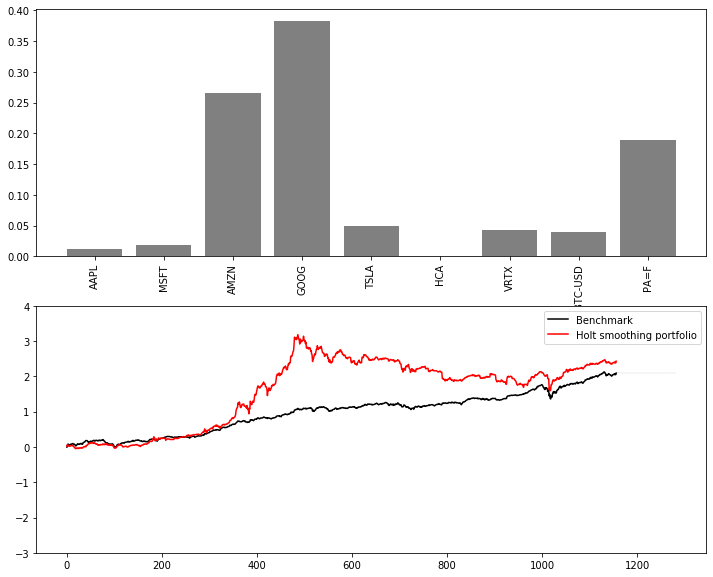

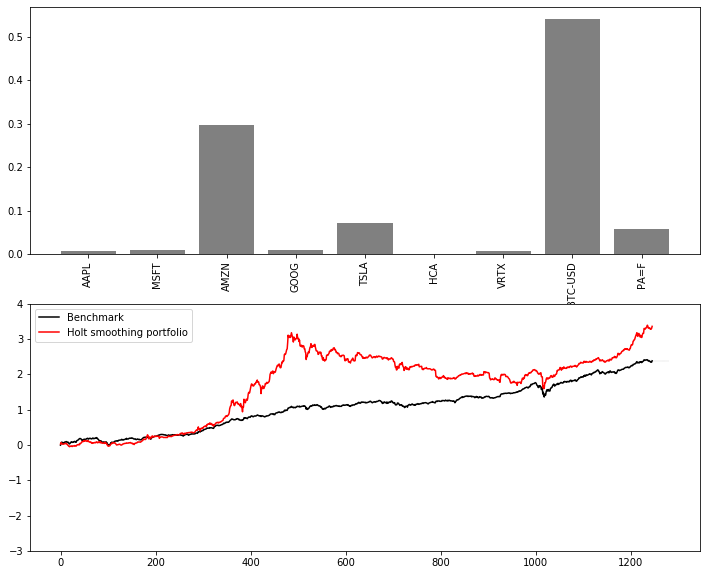

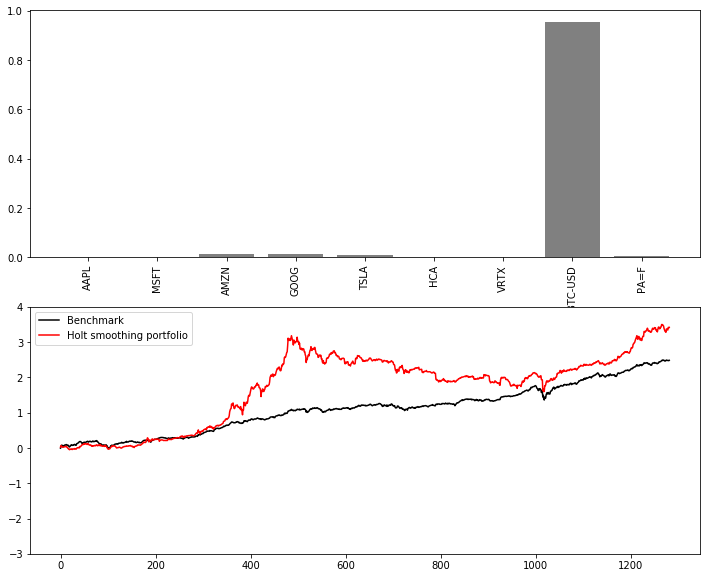

In [148]:
plot_results(result_equal, 
             result_smooth, 
             actions_smooth,
             N_ASSETS,
             state.columns, 
             'Holt smoothing portfolio', './images/smoothing/', 'series')

In [149]:
agent_ae = AutoencoderAgent(N_ASSETS, allow_short=True, encoding_dim = 5)

In [150]:
actions_equal, actions_ae = [], []
result_equal, result_ae = [], []

for i in range(WINDOW_FIT, len(env.data), WINDOW_HOLD):
    
    state = env.get_state(i, WINDOW_FIT, is_cov_matrix=False, is_raw_time_series=True)
    
    action_equal = np.ones(N_ASSETS) / N_ASSETS
    action_ae = agent_ae.act(state)

    state_action = env.get_state(i+WINDOW_HOLD, WINDOW_HOLD, is_cov_matrix=False)
    
    r = np.dot(state_action, action_equal)
    result_equal.append(r.tolist())
    actions_equal.append(action_equal)
    
    r = np.dot(state_action, action_ae)
    result_ae.append(r.tolist())
    actions_ae.append(action_ae)

In [151]:
result_equal_vis = [item for sublist in result_equal for item in sublist]
result_ae_vis = [item for sublist in result_ae for item in sublist]

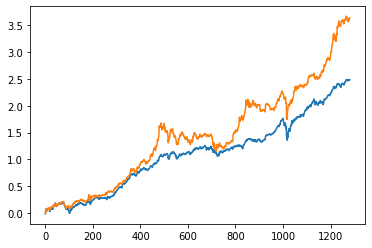

In [152]:
plt.figure()
plt.plot(np.array(result_equal_vis).cumsum())
plt.plot(np.array(result_ae_vis).cumsum())
plt.show()

In [153]:
print('EQUAL', print_stats(result_equal_vis, result_equal_vis))
print('AUTOENCODER', print_stats(result_ae_vis, result_equal_vis))

EQUAL [0.0019, 0.0149, 2.0752, -0.0, 1.0]
AUTOENCODER [0.0028, 0.025, 1.8081, 0.0007, 1.1089]


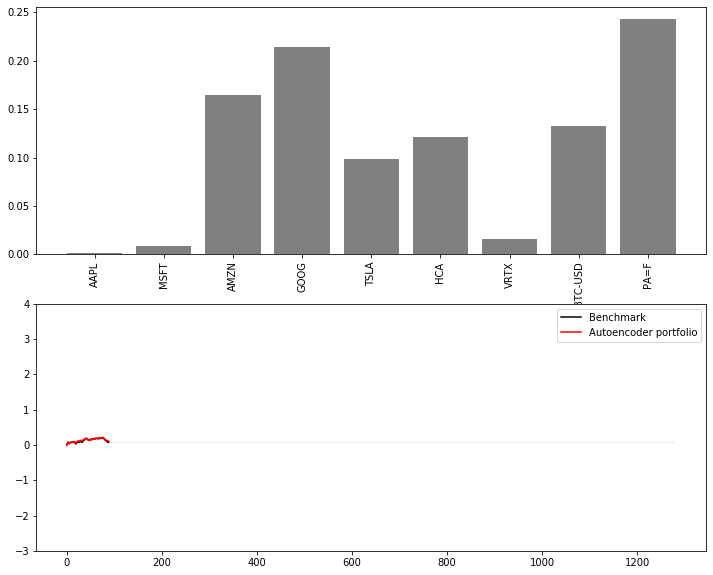

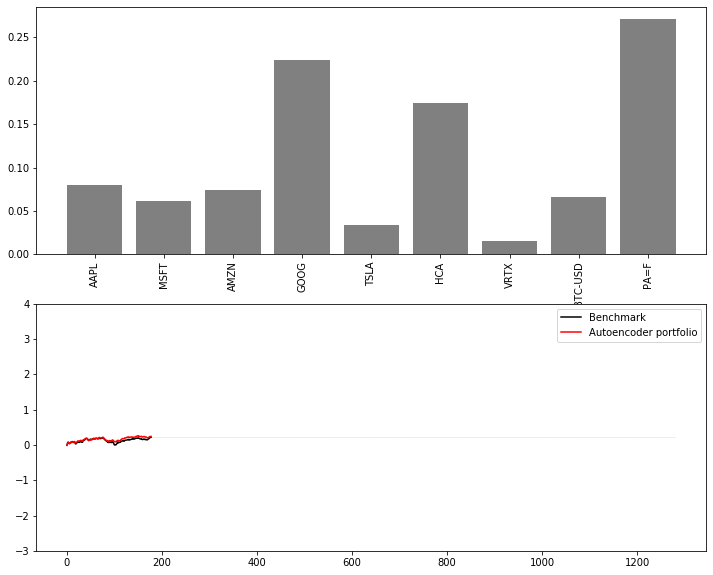

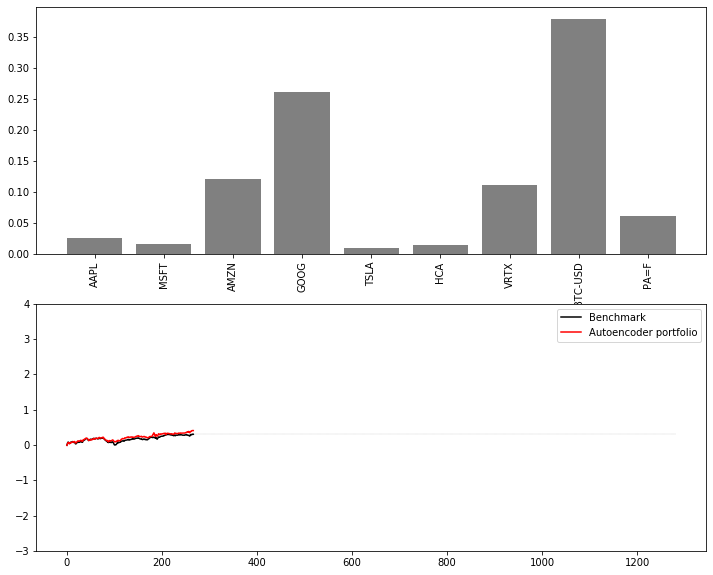

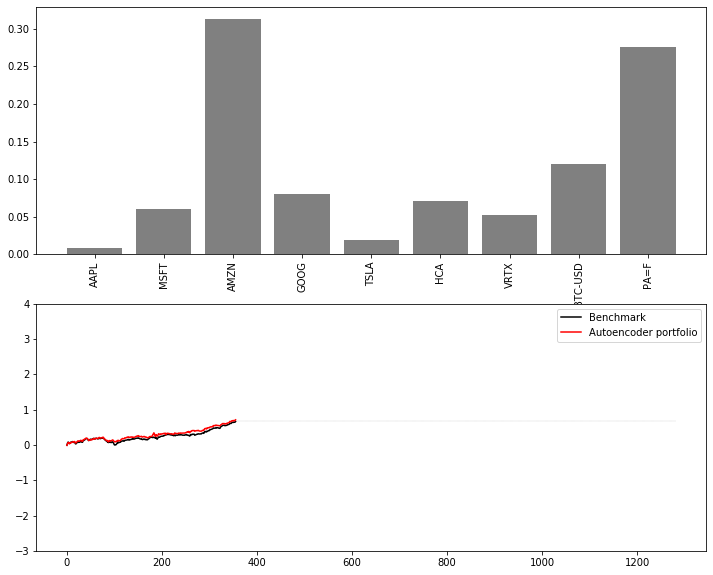

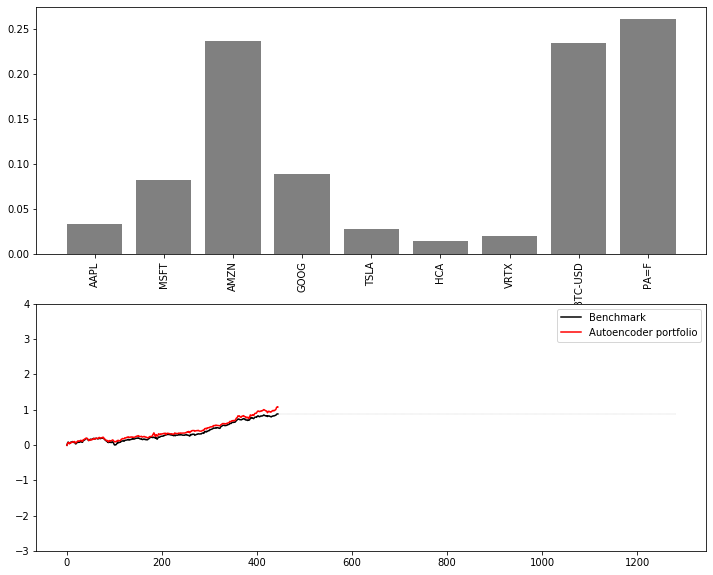

...

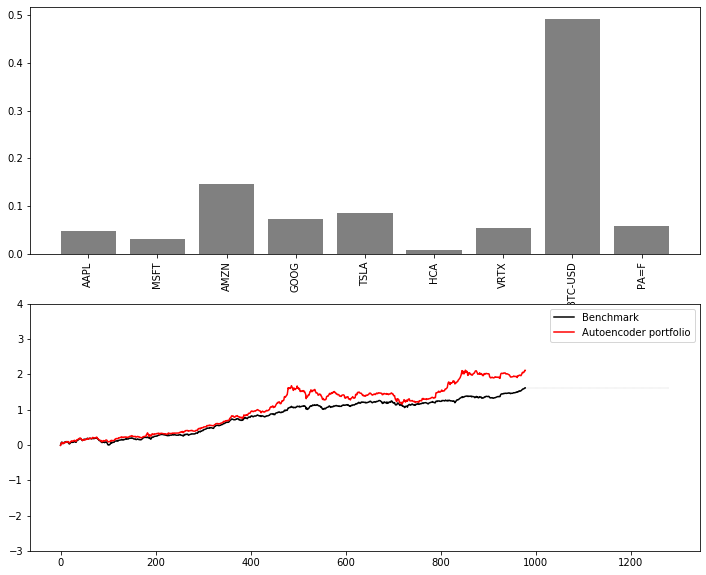

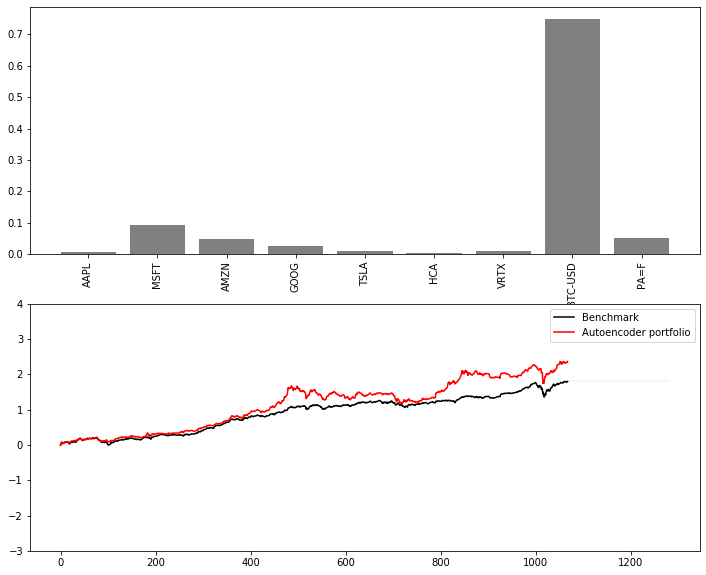

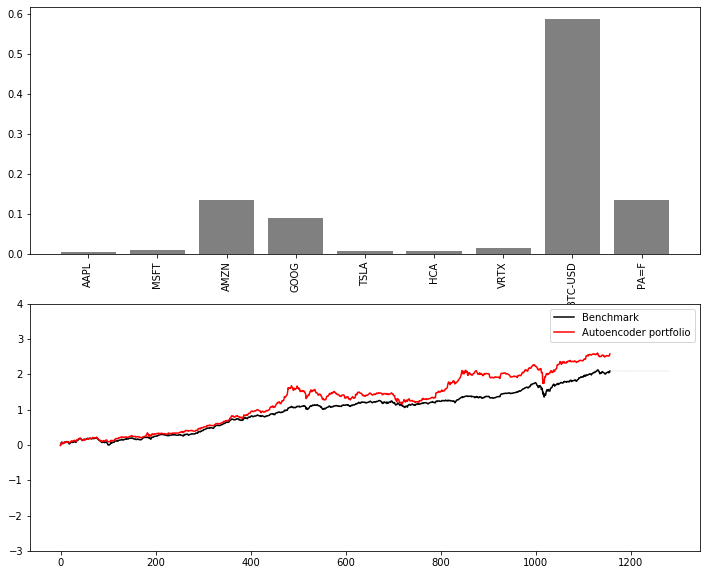

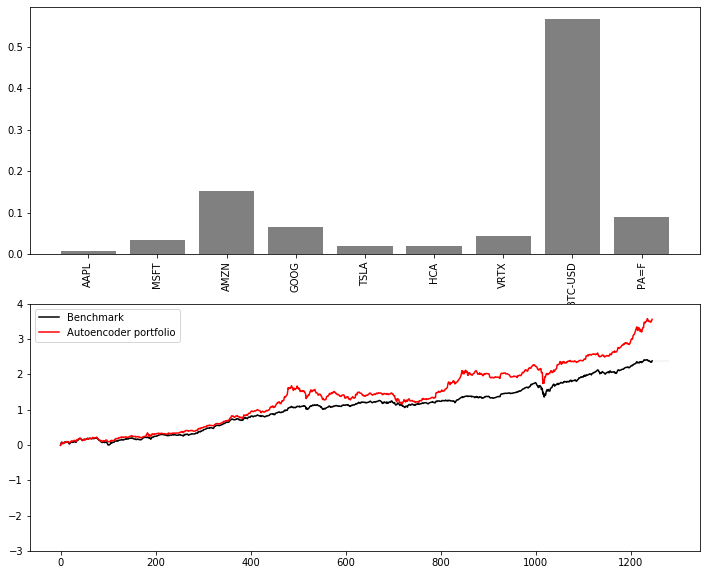

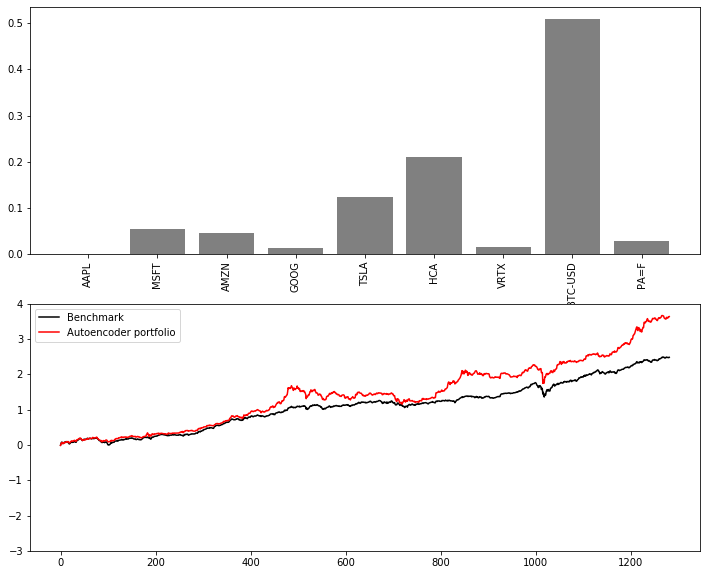

In [154]:
plot_results(result_equal, 
             result_ae, 
             actions_ae, 
             N_ASSETS,
             state.columns, 
             'Autoencoder portfolio', './images/ae/', 'series')
